In [2]:
# basic stuff 
from scipy import stats, signal, io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
# from google.colab import files
import os
import sklearn
import time
import json
import math
import statsmodels.api as sm
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
import subprocess
from sklearn.preprocessing import StandardScaler
import seaborn as sn

# torch stuff
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from torch import nn
import torch.nn.functional as F

# !pip install mat73
# import mat73

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import sys
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/PopFRData/')
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/xds_python/')

from xds import lab_data
import joint_angles as ja

In [5]:
sys.path.append('/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/')
import importlib
import data_loading
import train_test
import r2_pr2
import models
import visualization

importlib.reload(visualization)

<module 'visualization' from '/content/drive/MyDrive/Miller_Lab/FIU/custom_functions/visualization.py'>

# Load Raw Data

In [6]:
mat_20220309 = io.loadmat('/content/drive/MyDrive/Miller_Lab/FIU/PopFRData/combined_opensim_neural/fullyrestrained/new_labels_proc.mat')
input_20220309 = mat_20220309['data'][0][0][-4]
output_20220309 = mat_20220309['data'][0][0][-1]

In [7]:
input_20220309.shape, output_20220309.shape

((17969, 24), (17969, 96))

In [8]:
jarvis_dict = {}
jarvis_base_dir = '/content/drive/MyDrive/Miller_Lab/FIU/PopFRData/jarvis_data/'
jarvis_dict['20210710'] = np.genfromtxt(jarvis_base_dir+'20210710.csv', delimiter=',')
jarvis_dict['20210712'] = np.genfromtxt(jarvis_base_dir+'20210712.csv', delimiter=',')
jarvis_dict['20210814'] = np.genfromtxt(jarvis_base_dir+'20210814.csv', delimiter=',')
jarvis_dict['20211105'] = np.genfromtxt(jarvis_base_dir+'20211105.csv', delimiter=',')
jarvis_dict['20220224'] = np.genfromtxt(jarvis_base_dir+'20220224.csv', delimiter=',')
jarvis_dict['20220309'] = np.genfromtxt(jarvis_base_dir+'20220309.csv', delimiter=',')
jarvis_dict['20210928'] = np.genfromtxt(jarvis_base_dir+'20210928.csv', delimiter=',')
jarvis_dict['20211116stick'] = np.genfromtxt(jarvis_base_dir+'20211116stick.csv', delimiter=',')
jarvis_dict['20211116uc'] = np.genfromtxt(jarvis_base_dir+'20211116uc.csv', delimiter=',')
jarvis_dict['20211119stick'] = np.genfromtxt(jarvis_base_dir+'20211119stick.csv', delimiter=',')
jarvis_dict['20211119uc'] = np.genfromtxt(jarvis_base_dir+'20211119uc.csv', delimiter=',')
jarvis_dict['20211206pipe'] = np.genfromtxt(jarvis_base_dir+'20211206pipe.csv', delimiter=',')
jarvis_dict['20211206uc'] = np.genfromtxt(jarvis_base_dir+'20211206uc.csv', delimiter=',')
jarvis_dict['20211207uc'] = np.genfromtxt(jarvis_base_dir+'20211207uc.csv', delimiter=',')
jarvis_dict['20211209'] = np.genfromtxt(jarvis_base_dir+'20211209.csv', delimiter=',')
jarvis_dict['20211203'] = np.genfromtxt(jarvis_base_dir+'20211203.csv', delimiter=',')
jarvis_dict['20211207pipe'] = np.genfromtxt(jarvis_base_dir+'20211207pipe.csv', delimiter=',')
jarvis_dict['20211208pipe'] = np.genfromtxt(jarvis_base_dir+'20211208pipe.csv', delimiter=',')
jarvis_dict['20211208uc'] = np.genfromtxt(jarvis_base_dir+'20211208uc.csv', delimiter=',')
jarvis_dict['20220210pipe'] = np.genfromtxt(jarvis_base_dir+'20220210pipe.csv', delimiter=',')
jarvis_dict['20220210uc'] = np.genfromtxt(jarvis_base_dir+'20220210uc.csv', delimiter=',')

In [9]:
for date in jarvis_dict.keys():
    print(date, jarvis_dict[date].shape)

20210710 (54823, 104)
20210712 (37455, 92)
20210814 (55374, 92)
20211105 (36930, 92)
20220224 (18464, 92)
20220309 (18000, 92)
20210928 (37199, 104)
20211116stick (36002, 104)
20211116uc (9281, 104)
20211119stick (18500, 104)
20211119uc (18217, 104)
20211206pipe (9229, 104)
20211206uc (27422, 104)
20211207uc (18572, 104)
20211209 (18778, 104)
20211203 (18563, 104)
20211207pipe (18590, 104)
20211208pipe (18639, 104)
20211208uc (18557, 104)
20220210pipe (18000, 92)
20220210uc (18475, 92)


In [10]:
base_dir = '/content/drive/MyDrive/Miller_Lab/FIU/PopFRData/combined_opensim_neural/fullyrestrained/'
xds_list = []
files = os.listdir(base_dir)
bad_files = ['new_labels_proc.mat', '20220203_new_labels_proc.mat']
good_files = [i for i in files if i not in bad_files]
for i in good_files: 
    print(i)
    xds_list.append(lab_data(base_dir, i))

20210712_Pop_FR_01.mat
20211105_Pop_FR_001.mat
Pop_20210814_FR_001.mat
Pop_20210710_FR_001.mat
20220224_Pop_FR_001.mat
20211209_Pop_FR_001.mat
20211207_Pop_FR_002uc.mat
20211206_Pop_FR_001uc.mat
20211206_Pop_FR_002pipe.mat
20211203_Pop_FR_001.mat
20211119_Pop_FR_002uc.mat
20211119_Pop_FR_001stick.mat
20211116_Pop_FR_004uc.mat
20211116_Pop_FR_002stick.mat
20210928_Pop_FR_001.mat
20220210_Pop_FR_002pipe.mat
20220210_Pop_FR_001uc.mat
20211208_Pop_FR_002uc.mat
20211208_Pop_FR_001pipe.mat
20211207_Pop_FR_003pipe.mat


In [11]:
for xds_file in xds_list:
    print(xds_file.joint_angles.shape, xds_file.spike_counts.shape)

(35970, 24) (1199008, 142)
(35941, 24) (1199008, 113)
(53941, 24) (1799012, 145)
(53941, 24) (1799012, 153)
(17998, 24) (599963, 108)
(17941, 24) (599012, 104)
(17940, 24) (599002, 83)
(26941, 24) (899012, 99)
(8940, 24) (299002, 75)
(17941, 24) (599022, 25)
(17940, 24) (599002, 84)
(17940, 24) (598992, 83)
(8940, 24) (299002, 80)
(35941, 24) (1199012, 95)
(35941, 24) (1199012, 84)
(17941, 24) (599012, 96)
(17941, 24) (599012, 96)
(17941, 24) (599012, 96)
(17941, 24) (599012, 96)
(17940, 24) (599002, 90)


In [12]:
for k in range(input_20220309.shape[1]):
    if np.max(input_20220309[:,k]) < 2:
        print(k)

1
2


In [13]:
for good_file, xds_file in zip(good_files, xds_list):
    for k in range(xds_file.joint_angles.shape[1]):
        if np.max(xds_file.joint_angles[:,k]) < 2:
            print(good_file, k)

20210712_Pop_FR_01.mat 1
20210712_Pop_FR_01.mat 2
20211105_Pop_FR_001.mat 1
20211105_Pop_FR_001.mat 2
Pop_20210814_FR_001.mat 1
Pop_20210814_FR_001.mat 2
Pop_20210710_FR_001.mat 1
Pop_20210710_FR_001.mat 2
20220224_Pop_FR_001.mat 1
20220224_Pop_FR_001.mat 2
20211209_Pop_FR_001.mat 1
20211209_Pop_FR_001.mat 2
20211207_Pop_FR_002uc.mat 1
20211207_Pop_FR_002uc.mat 2
20211206_Pop_FR_001uc.mat 1
20211206_Pop_FR_001uc.mat 2
20211206_Pop_FR_002pipe.mat 1
20211206_Pop_FR_002pipe.mat 2
20211203_Pop_FR_001.mat 1
20211203_Pop_FR_001.mat 2
20211119_Pop_FR_002uc.mat 1
20211119_Pop_FR_002uc.mat 2
20211119_Pop_FR_001stick.mat 1
20211119_Pop_FR_001stick.mat 2
20211116_Pop_FR_004uc.mat 1
20211116_Pop_FR_004uc.mat 2
20211116_Pop_FR_002stick.mat 1
20211116_Pop_FR_002stick.mat 2
20210928_Pop_FR_001.mat 1
20210928_Pop_FR_001.mat 2
20220210_Pop_FR_002pipe.mat 1
20220210_Pop_FR_002pipe.mat 2
20220210_Pop_FR_001uc.mat 1
20220210_Pop_FR_001uc.mat 2
20211208_Pop_FR_002uc.mat 1
20211208_Pop_FR_002uc.mat 2
202112

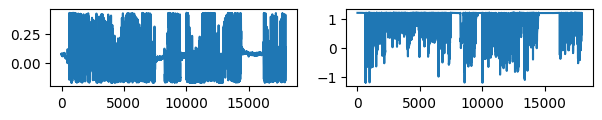

In [14]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(7, 1)
ax[0].plot(input_20220309[:,1])
ax[1].plot(input_20220309[:,2])
plt.show()

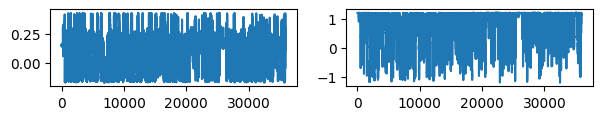

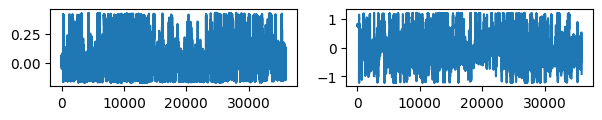

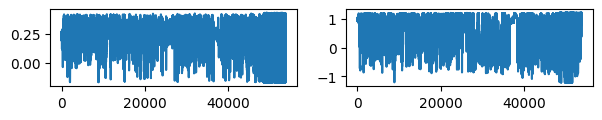

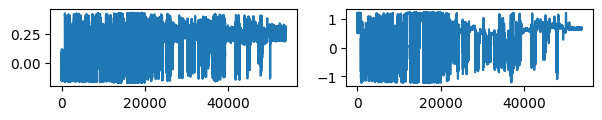

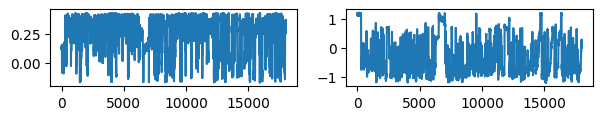

...

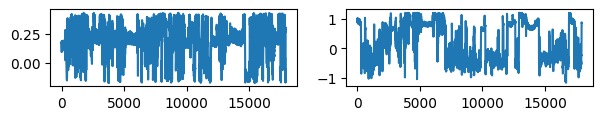

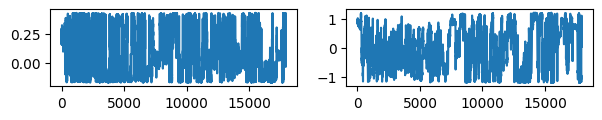

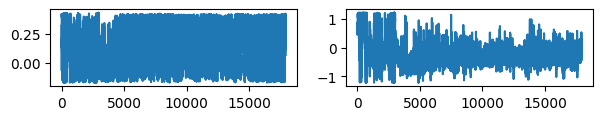

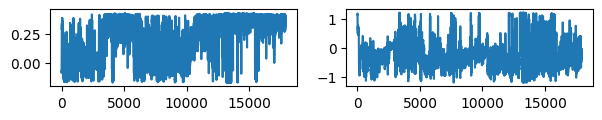

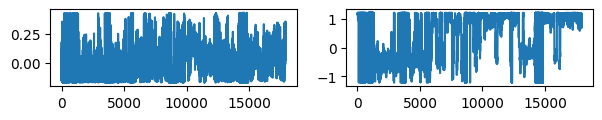

In [15]:
for xds_file in xds_list:
    fig, ax = plt.subplots(1,2)
    fig.set_size_inches(7, 1)
    ax[0].plot(xds_file.joint_angles[:,1])
    ax[1].plot(xds_file.joint_angles[:,2])
    plt.show()

Convert from radians to degrees

In [16]:
for k in range(input_20220309.shape[1]):
    if np.max(input_20220309[:,k]) < 2:
        input_20220309[:,k]*=180/np.pi

In [17]:
for good_file, xds_file in zip(good_files, xds_list):
    for k in range(xds_file.joint_angles.shape[1]):
        if np.max(xds_file.joint_angles[:,k]) < 2:
            xds_file.joint_angles[:,k]*=180/np.pi

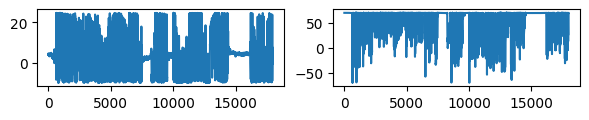

In [18]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(7, 1)
ax[0].plot(input_20220309[:,1])
ax[1].plot(input_20220309[:,2])
plt.show()

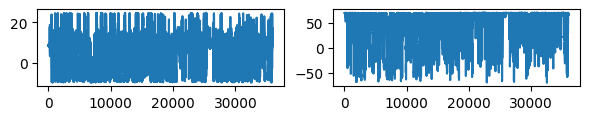

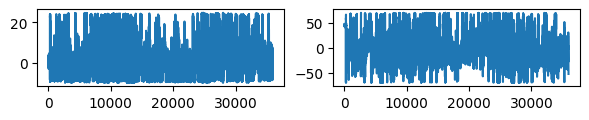

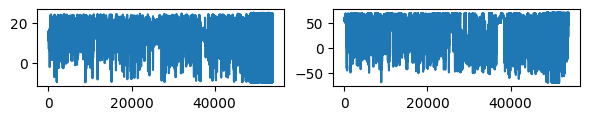

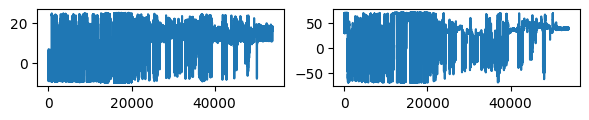

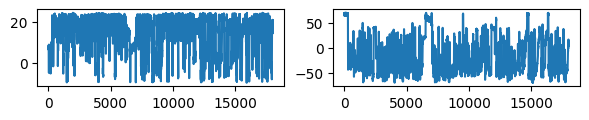

...

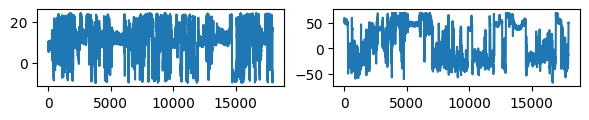

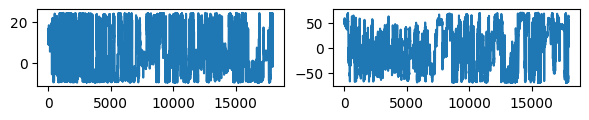

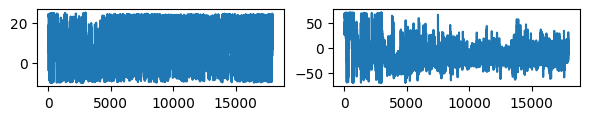

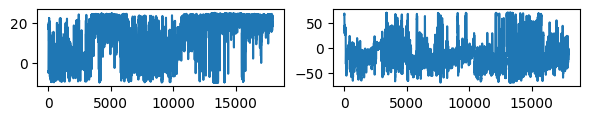

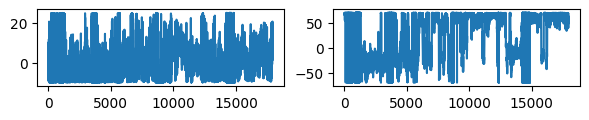

In [19]:
for xds_file in xds_list:
    fig, ax = plt.subplots(1,2)
    fig.set_size_inches(7, 1)
    ax[0].plot(xds_file.joint_angles[:,1])
    ax[1].plot(xds_file.joint_angles[:,2])
    plt.show()

In [20]:
for data in xds_list:
    print('Session Duration: {}, Num Neural Instances: {}'.format(data.get_meta()['duration'], data.spike_counts.shape))

Session Duration: 1200.0040000000001, Num Neural Instances: (1199008, 142)
Session Duration: 1200.0040000000001, Num Neural Instances: (1199008, 113)
Session Duration: 1800.0095, Num Neural Instances: (1799012, 145)
Session Duration: 1800.0095, Num Neural Instances: (1799012, 153)
Session Duration: 600.0095, Num Neural Instances: (599963, 108)
Session Duration: 600.0095, Num Neural Instances: (599012, 104)
Session Duration: 600.0095, Num Neural Instances: (599002, 83)
Session Duration: 900.0095, Num Neural Instances: (899012, 99)
Session Duration: 300.0095, Num Neural Instances: (299002, 75)
Session Duration: 600.0095, Num Neural Instances: (599022, 25)
Session Duration: 600.0095, Num Neural Instances: (599002, 84)
Session Duration: 600.0095, Num Neural Instances: (598992, 83)
Session Duration: 300.0095, Num Neural Instances: (299002, 80)
Session Duration: 1200.009, Num Neural Instances: (1199012, 95)
Session Duration: 1200.009, Num Neural Instances: (1199012, 84)
Session Duration: 600

Smooth and bin neural data

In [21]:
bin_size = 1/30
for xds_file in xds_list:
    print('Shape before binning+smoothing is: {}'.format(xds_file.spike_counts.shape))
    xds_file.update_bin_data(bin_size)                                      #bin
    xds_file.smooth_binned_spikes(bin_size, 'gaussian', bin_size*2)         #smooth
    print('Shape after binning+smoothing is: {}'.format(xds_file.spike_counts.shape))
    xds_file.spike_counts = xds_file.spike_counts/bin_size                  #convert to firing rates

Shape before binning+smoothing is: (1199008, 142)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (35971, 142)
Shape before binning+smoothing is: (1199008, 113)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (35971, 113)
Shape before binning+smoothing is: (1799012, 145)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (53971, 145)
Shape before binning+smoothing is: (1799012, 153)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (53971, 153)
Shape before binning+smoothing is: (599963, 108)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (17999, 108)
Shape before binning+smoothing is: (599012, 104)
The new bin size is 0.0333 s
The spike counts have been smoothed.
Shape after binning+smoothing is: (17971, 104)
Shape before binning+smo

Make dictionaries for inputs and outputs to easily access session data by date

In [22]:
import re
dates_list = []
for good_file in good_files:
    date = re.findall(r'\d{8}', good_file)[0]
    if 'uc' in good_file:
        date+='uc'
    if 'pipe' in good_file:
        date+= 'pipe'
    if 'stick' in good_file:
        date+= 'stick'
    dates_list.append(date)

In [23]:
joint_angles_dict = {}
velocities_dict = {}
angles_and_velocities_dict = {}
firing_rates_dict = {}
for date, xds_file in zip(dates_list, xds_list):
    angles = xds_file.joint_angles
    velocities = ja.get_joint_velocities(angles)
    angles_and_velocities = np.hstack((angles, velocities))
    joint_angles_dict[date] = angles
    velocities_dict[date] = velocities
    angles_and_velocities_dict[date] = angles_and_velocities

    firing_rates = xds_file.spike_counts
    len_diff = firing_rates.shape[0] - angles.shape[0]
    firing_rates_dict[date] = firing_rates[:-len_diff,:]

joint_angles_dict['20220309'] = input_20220309
velocities_dict['20220309'] = ja.get_joint_velocities(input_20220309)
firing_rates_dict['20220309'] = output_20220309/bin_size

Get rid of bad frames in 20210814 and 20220309

In [24]:
joint_angles_dict['20210814'] = joint_angles_dict['20210814'][:48000]
firing_rates_dict['20210814'] = firing_rates_dict['20210814'][:48000]

joint_angles_dict['20220309'] = joint_angles_dict['20220309'][800:17700]
firing_rates_dict['20220309'] = firing_rates_dict['20220309'][800:17700]

Make sure that the number of instances in the inputs and targets are the same

In [25]:
for date in joint_angles_dict.keys():
    jarvis_dict[date] = jarvis_dict[date][:joint_angles_dict[date].shape[0]]
    if jarvis_dict[date].shape[1] == 104:
        jarvis_dict[date] = jarvis_dict[date][:,:-12]
    jarvis_dict[date] = np.delete(jarvis_dict[date], np.s_[3::4], 1)
    print(date, jarvis_dict[date].shape, joint_angles_dict[date].shape, firing_rates_dict[date].shape)
    assert(len(jarvis_dict[date])==len(joint_angles_dict[date])==len(firing_rates_dict[date]))

20210712 (35970, 69) (35970, 24) (35970, 142)
20211105 (35941, 69) (35941, 24) (35941, 113)
20210814 (48000, 69) (48000, 24) (48000, 145)
20210710 (53941, 69) (53941, 24) (53941, 153)
20220224 (17998, 69) (17998, 24) (17998, 108)
20211209 (17941, 69) (17941, 24) (17941, 104)
20211207uc (17940, 69) (17940, 24) (17940, 83)
20211206uc (26941, 69) (26941, 24) (26941, 99)
20211206pipe (8940, 69) (8940, 24) (8940, 75)
20211203 (17941, 69) (17941, 24) (17941, 25)
20211119uc (17940, 69) (17940, 24) (17940, 84)
20211119stick (17940, 69) (17940, 24) (17940, 83)
20211116uc (8940, 69) (8940, 24) (8940, 80)
20211116stick (35941, 69) (35941, 24) (35941, 95)
20210928 (35941, 69) (35941, 24) (35941, 84)
20220210pipe (17941, 69) (17941, 24) (17941, 96)
20220210uc (17941, 69) (17941, 24) (17941, 96)
20211208uc (17941, 69) (17941, 24) (17941, 96)
20211208pipe (17941, 69) (17941, 24) (17941, 96)
20211207pipe (17940, 69) (17940, 24) (17940, 90)
20220309 (16900, 69) (16900, 24) (16900, 96)


20s contiguous segments of the video where the monkey is doing something interesting - used for plotting and testing later

In [26]:
good_range_dict = {'20210712':(540,1140),
                    '20211105':(3000,3600),
                    '20210814':(4500,5100),
                    '20210710':(4650,5250),
                    '20220224':(7200,7800),
                    '20211209':(1500,2100),
                    '20211207uc':(600,1200),
                    '20211206uc': (600,1200),
                    '20211206pipe':(0,600),
                    '20211203':(600,1200),
                    '20211119uc':(0,600),
                    '20211119stick':(0,600),
                    '20211116uc':(300,900),
                    '20211116stick':(0,600),
                    '20210928':(900,1500),
                    '20220309':(2200,2800),
                    '20211207pipe':(1500,2100),
                    '20211208pipe':(300,900),
                    '20211208uc':(900,1500),
                    '20220210uc':(9600,10200),
                    '20220210pipe':(1500,2100),}

In [27]:
good_dict = {}
for date in good_range_dict.keys():
    print(date)
    good_range = good_range_dict[date]
    good_input = joint_angles_dict[date][good_range[0]:good_range[1],:]
    good_output = firing_rates_dict[date][good_range[0]:good_range[1],:]
    good_dict[date] = (good_input, good_output)

20210712
20211105
20210814
20210710
20220224
20211209
20211207uc
20211206uc
20211206pipe
20211203
20211119uc
20211119stick
20211116uc
20211116stick
20210928
20220309
20211207pipe
20211208pipe
20211208uc
20220210uc
20220210pipe


Split target data by neurons randomly to artificially create more datasets - useful for transfer learning purposes. Note that ONLY the neural data is split - not the joint angle data.

In [ ]:
firing_rates_dict_split = {}
for date in firing_rates_dict.keys():
    num_neurons = firing_rates_dict[date].shape[1]
    splt = int(num_neurons/3)
    shuffled_neurons = np.arange(num_neurons)
    np.random.shuffle(shuffled_neurons) #shuffle neurons in place
    split1 = shuffled_neurons[:splt]
    split2 = shuffled_neurons[splt:2*splt]
    split3 = shuffled_neurons[2*splt:]
    firing_rates_dict_split[date] = {}
    firing_rates_dict_split[date][0] = firing_rates_dict[date][:,split1]
    firing_rates_dict_split[date][1] = firing_rates_dict[date][:,split2]
    firing_rates_dict_split[date][2] = firing_rates_dict[date][:,split3]

In [ ]:
for date in firing_rates_dict_split.keys():
    for splt in firing_rates_dict_split[date].keys():
        print(date, splt, firing_rates_dict_split[date][splt].shape)

20220309 0 (17969, 32)
20220309 1 (17969, 32)
20220309 2 (17969, 32)
20210712 0 (35970, 47)
20210712 1 (35970, 47)
20210712 2 (35970, 48)
20211108 0 (17970, 31)
20211108 1 (17970, 31)
20211108 2 (17970, 31)
20211105 0 (35941, 37)
20211105 1 (35941, 37)
20211105 2 (35941, 39)
20210710 0 (53941, 51)
20210710 1 (53941, 51)
20210710 2 (53941, 51)
20210814 0 (53941, 48)
20210814 1 (53941, 48)
20210814 2 (53941, 49)


# Plot Data

### Inputs

In [73]:
for date in joint_angles_dict.keys():
    print(date)
    nrows, ncols = 6,4
    f, ax = plt.subplots(nrows = nrows, ncols = ncols)
    f.set_size_inches(18, 15)
    for k in range(24):
        i = k-(int(k/ncols)*ncols)
        j = int(k/ncols)
        ax[j][i].plot(joint_angles_dict[date][:,k])
        ax[j][i].set_xlabel('Instance/Frame #')
        ax[j][i].set_ylabel('Joint Angle')
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

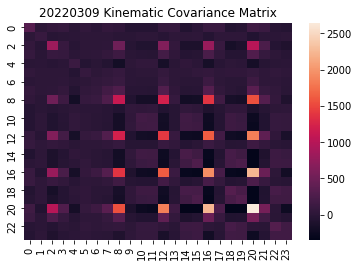

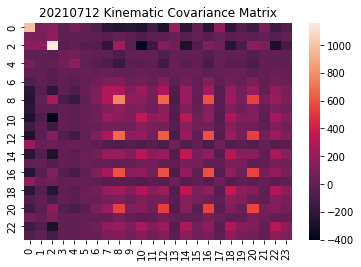

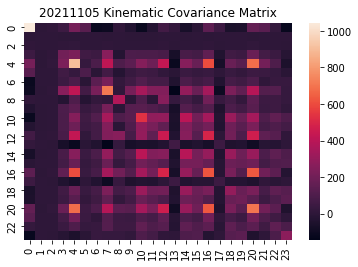

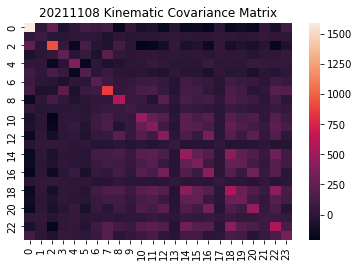

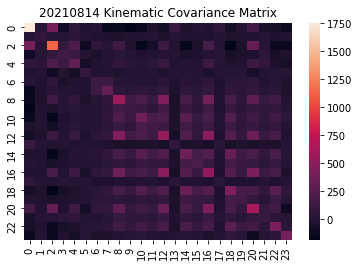

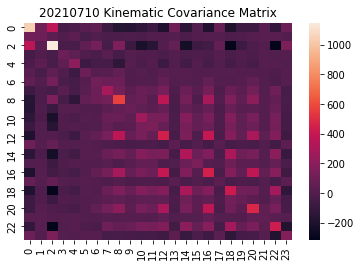

In [ ]:
import seaborn as sn
for date, inp in zip(dates_list, joint_angles_list):
    cov_matrix = np.cov(inp.T)
    sn.heatmap(cov_matrix)
    plt.title('{} Kinematic Covariance Matrix'.format(date))
    plt.show()

### Outputs

In [28]:
for date in firing_rates_dict.keys():
  print(date, firing_rates_dict[date].shape)

20210712 (35970, 142)
20211105 (35941, 113)
20210814 (48000, 145)
20210710 (53941, 153)
20220224 (17998, 108)
20211209 (17941, 104)
20211207uc (17940, 83)
20211206uc (26941, 99)
20211206pipe (8940, 75)
20211203 (17941, 25)
20211119uc (17940, 84)
20211119stick (17940, 83)
20211116uc (8940, 80)
20211116stick (35941, 95)
20210928 (35941, 84)
20220210pipe (17941, 96)
20220210uc (17941, 96)
20211208uc (17941, 96)
20211208pipe (17941, 96)
20211207pipe (17940, 90)
20220309 (16900, 96)


In [29]:
shapes_dict = {
'20220309': (12,8),
'20210712': (14,10),
'20211105': (11,10),
'20210814': (14,10),
'20210710': (15,10),
'20220224': (12,9),
'20211209': (13,8),
'20211207uc': (10,8),
'20211206uc': (11,9),
'20211206pipe': (10,7),
'20211203': (5,5),
'20211119uc': (12,7),
'20211119stick': (10,8),
'20211116uc': (10,8),
'20211116stick': (10,9),
'20210928': (12,7),
'20211209': (10,10),
'20211208pipe': (12,8),
'20211208uc': (12,8),
'20211207pipe': (10,9),
'20220210uc': (12,8),
'20220210pipe': (12,8)}

In [30]:
for date in firing_rates_dict.keys():
    print(date)
    nrows,ncols=shapes_dict[date][0], shapes_dict[date][1]
    f, ax = plt.subplots(nrows, ncols)
    f.subplots_adjust(top=0.97)
    f.set_size_inches(25, 25)
    for k in range(nrows*ncols):
        i = k-(int(k/ncols)*ncols)
        j = int(k/ncols)
        ax[j][i].plot(firing_rates_dict[date][:,k])
        ax[j][i].set_xlabel('Instance/Frame #')
        ax[j][i].set_ylabel('Smoothed Firing Rate')
    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# PCA

20210712, 35970 instances
20211105, 35941 instances
20210814, 48000 instances
20210710, 53941 instances
20220224, 17998 instances
20211207uc, 17940 instances
20211206uc, 26941 instances
20211206pipe, 8940 instances
20211203, 17941 instances
20211119uc, 17940 instances
20211119stick, 17940 instances
20211116uc, 8940 instances
20211116stick, 35941 instances
20210928, 35941 instances
20220210uc, 17941 instances
20220210pipe, 17941 instances
20211208pipe, 17941 instances


ValueError: ignored

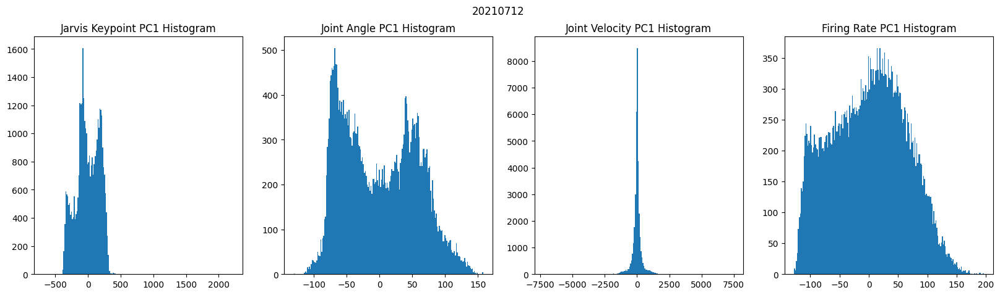

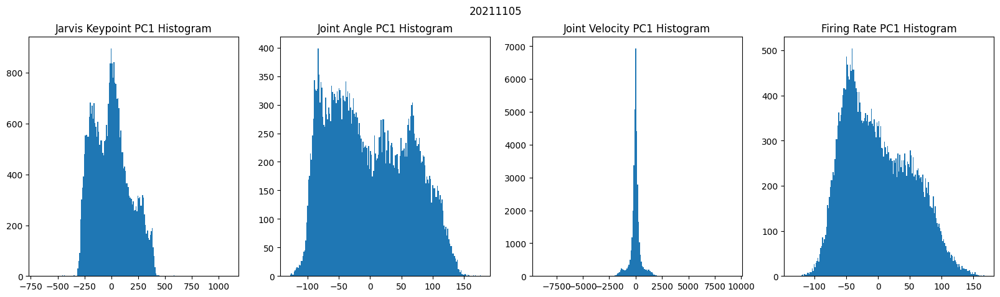

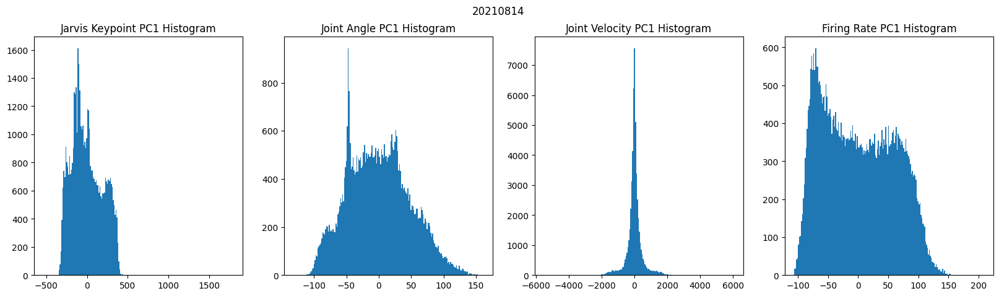

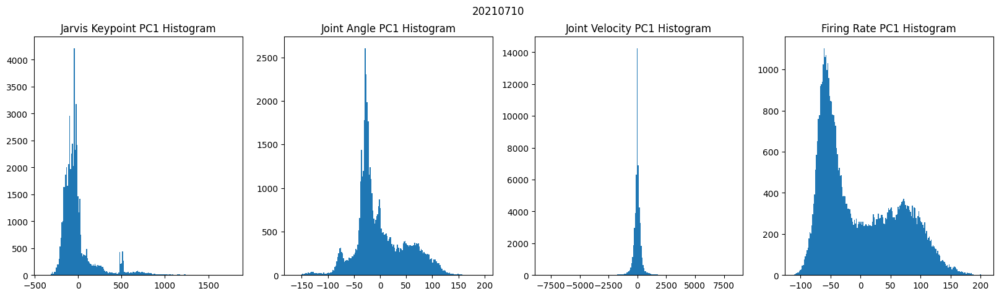

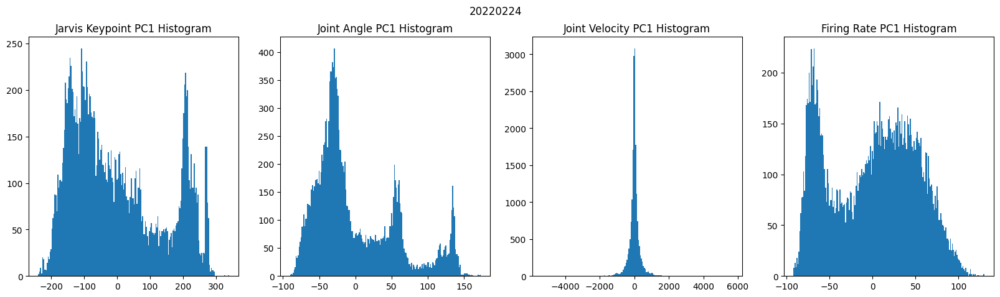

...

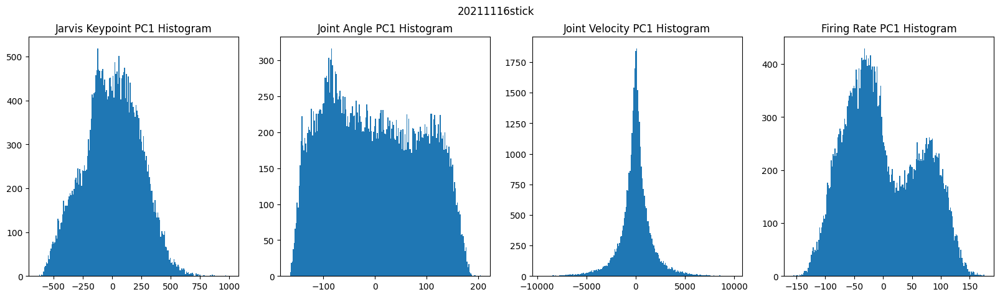

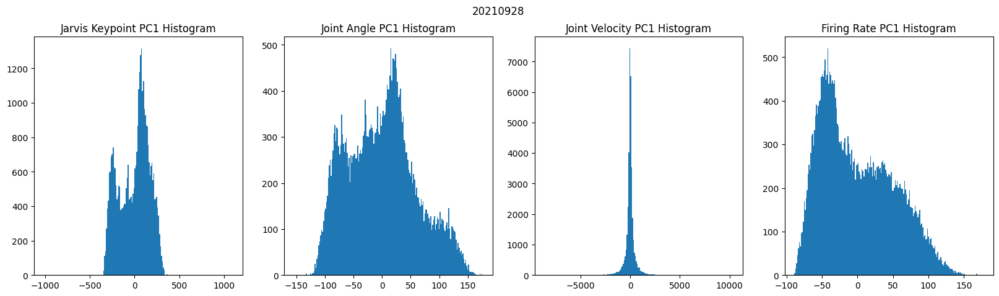

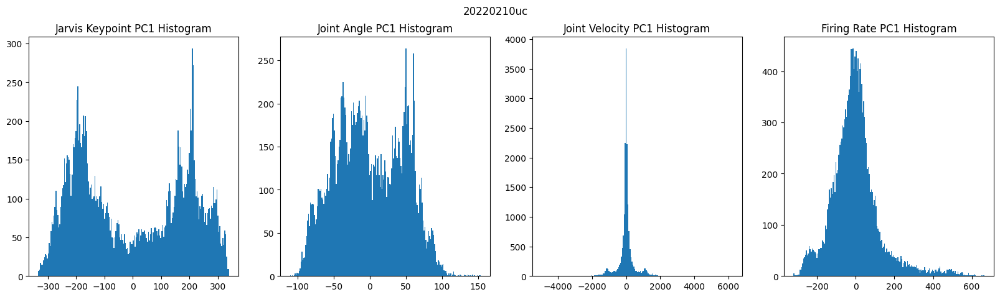

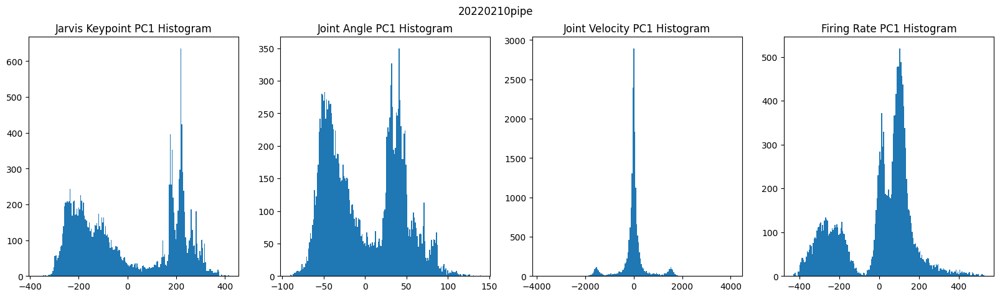

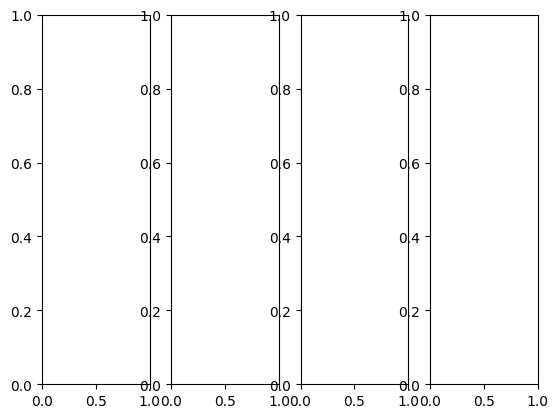

In [53]:
# Visualize data using PCA
for i, date in enumerate(joint_angles_dict.keys()):
    jarvis_data = jarvis_dict[date]
    joint_angles = joint_angles_dict[date]
    joint_velocities = velocities_dict[date]
    firing_rates = firing_rates_dict[date]

    num_instances = joint_angles.shape[0]
    print('{}, {} instances'.format(date, num_instances))

    fig, ax = plt.subplots(nrows = 1, ncols = 4)

    pca_jarvis = PCA(n_components=1)
    pca_joint_angles = PCA(n_components=1)
    pca_joint_velocities = PCA(n_components=1)
    pca_firing_rates = PCA(n_components=1)

    jarvis_features = pca_jarvis.fit_transform(jarvis_data)
    joint_angles_features = pca_joint_angles.fit_transform(joint_angles)
    joint_velocities_features = pca_joint_velocities.fit_transform(joint_velocities)
    firing_rates_features = pca_firing_rates.fit_transform(firing_rates)
    
    fig.set_size_inches(20, 5)
    ax[0].hist(jarvis_features, bins = 200)
    ax[1].hist(joint_angles_features, bins = 200)
    ax[2].hist(joint_velocities_features, bins = 200)
    ax[3].hist(firing_rates_features, bins = 200)

    fig.suptitle(date)
    ax[0].set_title('Jarvis Keypoint PC1 Histogram')
    ax[1].set_title('Joint Angle PC1 Histogram')
    ax[2].set_title('Joint Velocity PC1 Histogram')
    ax[3].set_title('Firing Rate PC1 Histogram')
    # print(joint_angles_features.shape)

In [ ]:
# Visualize data using PCA
for i, date in enumerate(joint_angles_dict.keys()):
    jarvis_data = jarvis_dict_nonans[date]
    joint_angles = joint_angles_dict[date]
    joint_velocities = velocities_dict[date]
    firing_rates = firing_rates_dict[date]

    # PCA - visualization
    num_instances = joint_angles.shape[0]
    train_split = int(num_instances*.8)
    p = np.random.permutation(num_instances)

    fig, ax = plt.subplots(nrows = 1, ncols = 4)

    pca_jarvis_data = PCA(n_components=2)
    pca_joint_angles = PCA(n_components=2)
    pca_joint_velocities = PCA(n_components=2)
    pca_firing_rates = PCA(n_components=2)

    jarvis_data_features = pca_jarvis_data.fit_transform(jarvis_data[p])
    joint_angles_features = pca_joint_angles.fit_transform(joint_angles[p])
    joint_velocities_features = pca_joint_velocities.fit_transform(joint_velocities[p])
    firing_rates_features = pca_firing_rates.fit_transform(firing_rates[p])
    
    joint_angles_var = pca_joint_angles.explained_variance_ratio_
    joint_velocities_var = pca_joint_velocities.explained_variance_ratio_
    firing_rates_var = pca_firing_rates.explained_variance_ratio_

    pca1_angles_var, pca2_angles_var = round(joint_angles_var[0],4), round(joint_angles_var[1],4)
    pca1_velocities_var, pca2_velocities_var = round(joint_velocities_var[0],4), round(joint_velocities_var[1],4)
    pca1_firing_rates_var, pca2_firing_rates_var = round(firing_rates_var[0],4), round(firing_rates_var[1],4)

    print('Joint Angles Variance PC1: {}, Joint Angles Variance PC2: {}, Variance PC1+PC2: {}'.format(pca1_angles_var, pca2_angles_var, pca1_angles_var+pca2_angles_var))
    print('Joint Velocities Variance PC1: {}, Joint Velocities Variance PC2: {}, Variance PC1+PC2: {}'.format(pca1_velocities_var, pca2_velocities_var, pca1_velocities_var+pca2_velocities_var))
    print('Firing Rates Variance PC1: {}, Firing Rates Variance PC2: {}, Variance PC1+PC2: {}'.format(pca1_firing_rates_var, pca2_firing_rates_var, pca1_firing_rates_var+pca2_firing_rates_var))
    
    fig.set_size_inches(20, 5)
    ax[0].scatter(jarvis_data_features[:train_split,0], jarvis_data_features[:train_split,1], label='Train')
    ax[0].scatter(jarvis_data_features[train_split:,0], jarvis_data_features[train_split:,1], label='Test')

    ax[1].scatter(joint_angles_features[:train_split,0], joint_angles_features[:train_split,1], label='Train')
    ax[1].scatter(joint_angles_features[train_split:,0], joint_angles_features[train_split:,1], label='Test')

    ax[2].scatter(joint_velocities_features[:train_split,0], joint_velocities_features[:train_split,1],label='Train')
    ax[2].scatter(joint_velocities_features[train_split:,0], joint_velocities_features[train_split:,1], label='Test')

    ax[3].scatter(firing_rates_features[:train_split,0], firing_rates_features[:train_split,1],label='Train')
    ax[3].scatter(firing_rates_features[train_split:,0], firing_rates_features[train_split:,1], label='Test')
    
    ax[0].set_xlabel('PC1')
    ax[0].set_ylabel('PC2')
    ax[1].set_xlabel('PC1')
    ax[1].set_ylabel('PC2')
    ax[2].set_xlabel('PC1')
    ax[2].set_ylabel('PC2')
    ax[3].set_xlabel('PC1')
    ax[3].set_ylabel('PC2')

    ax[0].set_title('{} Jarvis Data PCA'.format(date))
    ax[1].set_title('{} Joint Angles PCA'.format(date))
    ax[2].set_title('{} Joint Velocities PCA'.format(date))
    ax[3].set_title('{} Firing Rates PCA'.format(date))

    ax[0].legend()
    ax[1].legend()
    ax[2].legend()
    ax[3].legend()

    plt.show()
    print('\n')

Output hidden; open in https://colab.research.google.com to view.

# Sklearn Linear Regression

In [ ]:
# LinearRegression() works by using the Moore-Penrose pseudoinverse of X
from sklearn.linear_model import LinearRegression 
lin_reg = LinearRegression()
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(input_norm_20220309, output_20220309, test_size=0.2, shuffle = False, random_state=42)

lin_reg.fit(X_train, y_train)
pred_train = lin_reg.predict(X_train)
pred_test = lin_reg.predict(X_test)

In [ ]:
train_mse_linreg = np.mean(np.square(y_train-pred_train))
test_mse_linreg = np.mean(np.square(y_test-pred_test))

In [ ]:
train_mse_linreg, test_mse_linreg

(0.09877686656163322, 0.08564936205566907)

In [ ]:
train_r2 = r2_score(y_train,pred_train,multioutput='variance_weighted')
test_r2 = r2_score(y_test,pred_test,multioutput='variance_weighted')
print('Sklearn: Train r^2: {}, Test r^2: {}'.format(train_r2, test_r2))

Sklearn: Train r^2: 0.19678575748803742, Test r^2: 0.11910944555784582


# Creating, saving, and loading datasets

In [ ]:
torch.save(good_dict[dataset.date], os.path.join(full_dir,'GoodRange.pt'))

In [40]:
base_dir = '/content/drive/My Drive/Miller_Lab/FIU/PopFRData/tcnn_processed_shuffled_opensim_datasets/instance_length_100/fullyrestrained/'
date = '20210710'
torch.save(good_dict[date], os.path.join(base_dir, date, 'Joint Angles','GoodRange.pt'))

In [89]:
inp_types = ['Joint Angles']
new_dates = ['20211207pipe','20211208pipe','20211208uc','20220210uc','20220210pipe',]
for date in joint_angles_dict.keys():
    print(date)
    for inp_type in inp_types:
        dataset = data_loading.MLPDataset(date, inp_type, joint_angles_dict, firing_rates_dict, good_range_dict, shuffle = True, time_delay = True)
        data_loading.create_and_save_datasets(dataset, good_dict, restraint_type = 'fullyrestrained')

20210712
20211105
20210814
20210710
20220224
20211207uc
20211206uc
20211206pipe
20211203
20211119uc
20211119stick
20211116uc
20211116stick
20210928
20220210uc
20220210pipe
20211208pipe
20211208uc
20211207pipe
20211209
20220309


In [85]:
inp_types = ['Joint Angles']
for date in joint_angles_dict.keys():
    print(date)
    for inp_type in inp_types:
        dataset = data_loading.TCNDataset(date, inp_type, joint_angles_dict, firing_rates_dict, good_range_dict[date], shuffle = True, time_delay = True, instance_length = 100)
        data_loading.create_and_save_datasets(dataset, good_dict, tcnn = True, instance_length = 100, restraint_type = 'fullyrestrained')

20210712
20211105
20210814
20210710
20220224
20211207uc
20211206uc
20211206pipe
20211203
20211119uc
20211119stick
20211116uc
20211116stick
20210928
20220210uc
20220210pipe
20211208pipe
20211208uc
20211207pipe
20211209
20220309


In [70]:
base_dir = '/content/drive/My Drive/Miller_Lab/FIU/PopFRData/processed_shuffled_opensim_datasets/fullyrestrained/'
dataset_dict = data_loading.load_datasets(base_dir)
loader_dict = data_loading.get_loaders(dataset_dict, 32)

In [71]:
base_dir = '/content/drive/My Drive/Miller_Lab/FIU/PopFRData/tcnn_processed_shuffled_opensim_datasets/instance_length_{}/{}'.format(100,'fullyrestrained')
tcn_dataset_dict = data_loading.load_datasets(base_dir)
tcn_loader_dict = data_loading.get_loaders(tcn_dataset_dict, 32)

In [60]:
for date in dataset_dict.keys():
    print(date, len(dataset_dict[date]['Joint Angles']['Full']),\
          dataset_dict[date]['Joint Angles']['Full'][0][0].shape,\
          dataset_dict[date]['Joint Angles']['Full'][0][1].shape)

20220309 17369 torch.Size([24]) torch.Size([96])
20210712 35370 torch.Size([24]) torch.Size([142])
20211105 35341 torch.Size([24]) torch.Size([113])
20210814 53341 torch.Size([24]) torch.Size([145])
20210710 53341 torch.Size([24]) torch.Size([153])
20220224 17394 torch.Size([24]) torch.Size([108])
20211209 17337 torch.Size([24]) torch.Size([104])
20211207uc 17336 torch.Size([24]) torch.Size([83])
20211206uc 26337 torch.Size([24]) torch.Size([99])
20211206pipe 8336 torch.Size([24]) torch.Size([75])
20211203 17337 torch.Size([24]) torch.Size([25])
20211119uc 17336 torch.Size([24]) torch.Size([84])
20211119stick 17336 torch.Size([24]) torch.Size([83])
20211116uc 8336 torch.Size([24]) torch.Size([80])
20211116stick 35337 torch.Size([24]) torch.Size([95])
20210928 35337 torch.Size([24]) torch.Size([84])
20220309new 16296 torch.Size([24]) torch.Size([96])
20210814new 47396 torch.Size([24]) torch.Size([145])
20220210uc 17337 torch.Size([24]) torch.Size([96])
20211207pipe 17336 torch.Size([24]

In [61]:
for date in tcn_dataset_dict.keys():
    print(date, len(tcn_dataset_dict[date]['Joint Angles']['Full']),\
          tcn_dataset_dict[date]['Joint Angles']['Full'][0][0].shape,\
          tcn_dataset_dict[date]['Joint Angles']['Full'][0][1].shape)

20220309 (1) 173 torch.Size([24, 100]) torch.Size([100, 96])
20210712 353 torch.Size([24, 100]) torch.Size([100, 142])
20211105 353 torch.Size([24, 100]) torch.Size([100, 113])
20210814 (1) 533 torch.Size([24, 100]) torch.Size([100, 145])
20210710 533 torch.Size([24, 100]) torch.Size([100, 153])
20220224 173 torch.Size([24, 100]) torch.Size([100, 108])
20211209 173 torch.Size([24, 100]) torch.Size([100, 104])
20211207uc 173 torch.Size([24, 100]) torch.Size([100, 83])
20211206uc 263 torch.Size([24, 100]) torch.Size([100, 99])
20211206pipe 83 torch.Size([24, 100]) torch.Size([100, 75])
20211203 173 torch.Size([24, 100]) torch.Size([100, 25])
20211119uc 173 torch.Size([24, 100]) torch.Size([100, 84])
20211119stick 173 torch.Size([24, 100]) torch.Size([100, 83])
20211116uc 83 torch.Size([24, 100]) torch.Size([100, 80])
20211116stick 353 torch.Size([24, 100]) torch.Size([100, 95])
20210928 353 torch.Size([24, 100]) torch.Size([100, 84])
20210814 473 torch.Size([24, 100]) torch.Size([100, 14

# Model and Training

In [9]:
og_dates_list = ['20210712','20211105','20210814','20210710','20220309']
new_dates_list = [i for i in dataset_dict.keys() if i not in og_dates_list]

In [10]:
new_dates_list

['20220224',
 '20211209',
 '20211207uc',
 '20211206uc',
 '20211206pipe',
 '20211203',
 '20211119uc',
 '20211119stick',
 '20211116uc',
 '20211116stick',
 '20210928']

# MLP

20211207pipe 90
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 25626
Epoch: 000, LR: 0.001000, Train Loss: 157.674138, Test Loss: 137.402902. Train R2: 0.2023891, Test R2: 0.1963027, Train pR2: -2.6762836, Test pR2: -2.6463592
Epoch: 050, LR: 0.001000, Train Loss: 80.054664, Test Loss: 100.217552. Train R2: 0.5210784, Test R2: 0.4133687, Train pR2: -1.3216507, Test pR2: -1.4081699
Epoch: 100, LR: 0.000640, Train Loss: 72.324557, Test Loss: 99.350895. Train R2: 0.5605684, Test R2: 0.4186094, Train pR2: -1.3452350, Test pR2: -1.4853431
Time to train model: 199.26678228378296


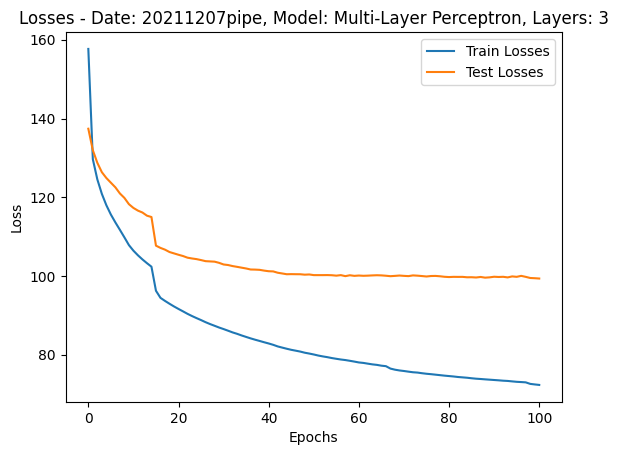

20211208pipe 96
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 1524.705791, Test Loss: 1208.550781. Train R2: -0.1251047, Test R2: -0.1407527, Train pR2: -9.5181675, Test pR2: -9.7912874
Epoch: 050, LR: 0.001000, Train Loss: 529.312536, Test Loss: 592.023051. Train R2: 0.5216942, Test R2: 0.4416308, Train pR2: 0.4145890, Test pR2: 0.3340167
Epoch: 100, LR: 0.000800, Train Loss: 469.917575, Test Loss: 576.998179. Train R2: 0.5649217, Test R2: 0.4554181, Train pR2: 0.4152064, Test pR2: 0.2778089
Time to train model: 194.76622557640076


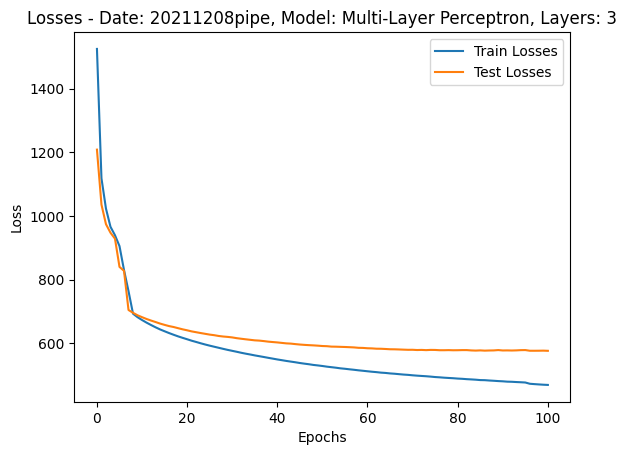

20211208uc 96
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 1320.904787, Test Loss: 1065.622372. Train R2: -0.1363658, Test R2: -0.1524734, Train pR2: -12.3640203, Test pR2: -12.3364973
Epoch: 050, LR: 0.001000, Train Loss: 506.799857, Test Loss: 582.281158. Train R2: 0.4411293, Test R2: 0.3694938, Train pR2: -2.4857388, Test pR2: -2.5075054
Epoch: 100, LR: 0.000800, Train Loss: 336.641130, Test Loss: 441.040235. Train R2: 0.6259041, Test R2: 0.5230271, Train pR2: 0.2888702, Test pR2: 0.1883191
Time to train model: 194.94612169265747


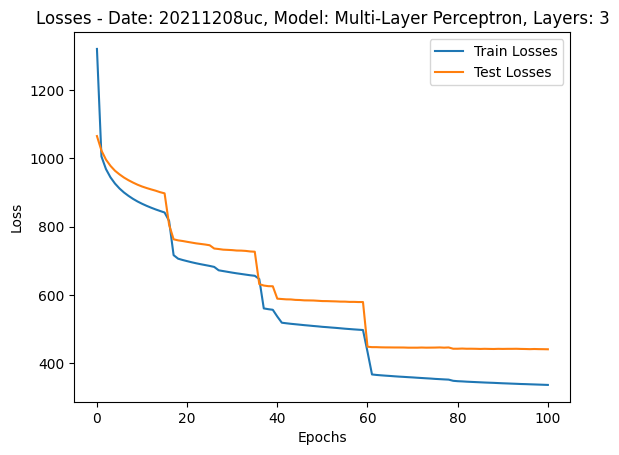

20220210uc 96


KeyError: ignored

In [62]:
mlp_models_dict_3layers = {}
for date in new_dates:
    print(date, dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = dataset_dict[date]['Joint Angles']['Full']
    train_loader = loader_dict[date]['Joint Angles']['Train']
    test_loader = loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_layers = 3
    model = visualization.plot_losses_MLP(dataset, train_loader, test_loader, learning_rate, num_layers, save = True)
    mlp_models_dict_3layers[date] = model

20220210uc 96
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 557.565918, Test Loss: 372.902557. Train R2: 0.2233891, Test R2: 0.2052331, Train pR2: -4.2205949, Test pR2: -4.1737976
Epoch: 050, LR: 0.001000, Train Loss: 232.428130, Test Loss: 255.131751. Train R2: 0.5141730, Test R2: 0.4558467, Train pR2: -2.0117671, Test pR2: -2.0252044
Epoch: 100, LR: 0.001000, Train Loss: 208.850054, Test Loss: 249.974376. Train R2: 0.5539592, Test R2: 0.4670092, Train pR2: -2.0484283, Test pR2: -2.1077740
Time to train model: 203.1723439693451


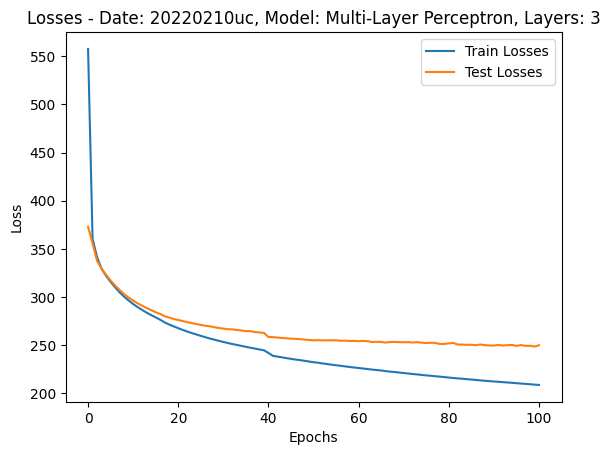

20220210pipe 96
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 911.692515, Test Loss: 796.491325. Train R2: -0.0812132, Test R2: -0.0891255, Train pR2: -7.8536377, Test pR2: -7.8936543
Epoch: 050, LR: 0.001000, Train Loss: 458.537310, Test Loss: 483.916111. Train R2: 0.3697044, Test R2: 0.3385007, Train pR2: -1.7037983, Test pR2: -1.7693218
Epoch: 100, LR: 0.001000, Train Loss: 417.212102, Test Loss: 452.790947. Train R2: 0.4265762, Test R2: 0.3809003, Train pR2: -1.2447888, Test pR2: -1.3280143
Time to train model: 202.59486532211304


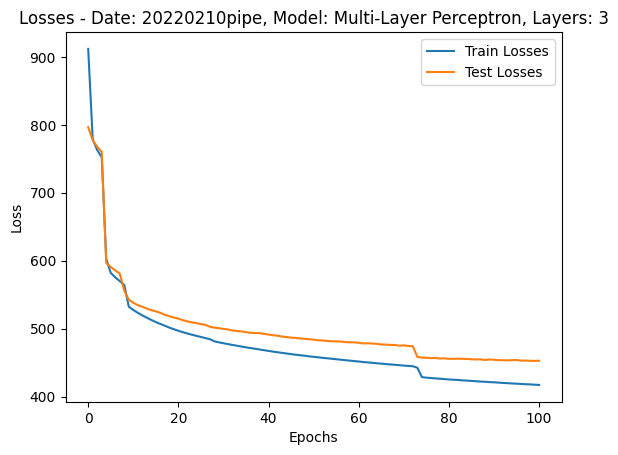

In [72]:
for date in ['20220210uc','20220210pipe']:
    print(date, dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = dataset_dict[date]['Joint Angles']['Full']
    train_loader = loader_dict[date]['Joint Angles']['Train']
    test_loader = loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_layers = 3
    model = visualization.plot_losses_MLP(dataset, train_loader, test_loader, learning_rate, num_layers, save = True)
    mlp_models_dict_3layers[date] = model

20210814 145
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 31841
Epoch: 000, LR: 0.001000, Train Loss: 93.032163, Test Loss: 81.904842. Train R2: 0.3263144, Test R2: 0.3176191, Train pR2: -2.5480638, Test pR2: -2.5932519
Epoch: 050, LR: 0.001000, Train Loss: 60.777320, Test Loss: 66.444916. Train R2: 0.4927249, Test R2: 0.4464240, Train pR2: -0.6316396, Test pR2: -0.7720779
Epoch: 100, LR: 0.000800, Train Loss: 58.724843, Test Loss: 65.994025. Train R2: 0.5086103, Test R2: 0.4501655, Train pR2: -0.6236522, Test pR2: -0.7950011
Time to train model: 664.5979518890381


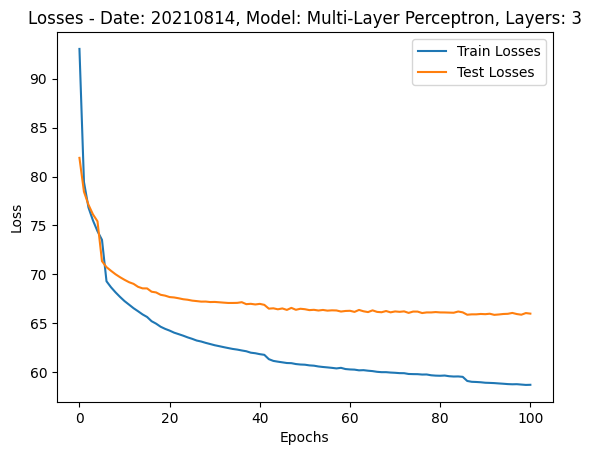

20220309 96
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 154.598738, Test Loss: 138.983816. Train R2: -0.2476525, Test R2: -0.2467882, Train pR2: -16.8644505, Test pR2: -16.4925766
Epoch: 050, LR: 0.001000, Train Loss: 64.507350, Test Loss: 71.585726. Train R2: 0.4106079, Test R2: 0.3576633, Train pR2: -0.6634872, Test pR2: -0.6997709
Epoch: 100, LR: 0.000512, Train Loss: 59.767737, Test Loss: 69.970007. Train R2: 0.4503111, Test R2: 0.3719450, Train pR2: -0.6404706, Test pR2: -0.7090338
Time to train model: 209.0186266899109


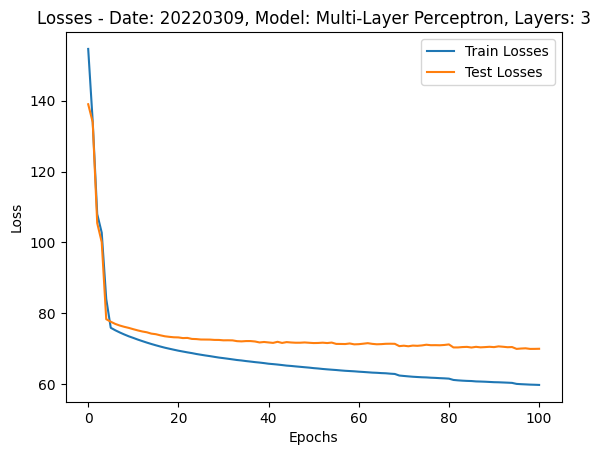

In [90]:
mlp_models_dict_3layers = {}
for date in ['20210814','20220309']:
    print(date, dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = dataset_dict[date]['Joint Angles']['Full']
    train_loader = loader_dict[date]['Joint Angles']['Train']
    test_loader = loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_layers = 3
    model = visualization.plot_losses_MLP(dataset, train_loader, test_loader, learning_rate, num_layers, save = True)
    mlp_models_dict_3layers[date] = model

20220224 108
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 27660
Epoch: 000, LR: 0.001000, Train Loss: 137.581089, Test Loss: 124.784546. Train R2: -0.1352963, Test R2: -0.1354171, Train pR2: -5.2337513, Test pR2: -5.2001076
Epoch: 050, LR: 0.001000, Train Loss: 81.501778, Test Loss: 87.747200. Train R2: 0.2622283, Test R2: 0.2016029, Train pR2: -0.6145492, Test pR2: -0.6750367
Epoch: 100, LR: 0.000800, Train Loss: 75.481381, Test Loss: 85.564657. Train R2: 0.3037643, Test R2: 0.2214060, Train pR2: -0.6521202, Test pR2: -0.7437388
Time to train model: 173.83257222175598


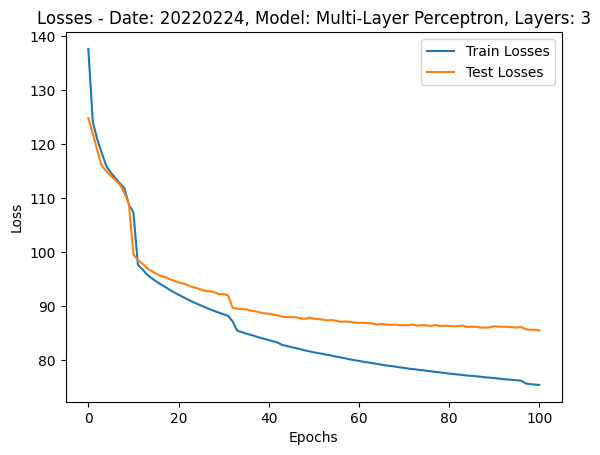

20211209 104
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 27208
Epoch: 000, LR: 0.001000, Train Loss: 283.479391, Test Loss: 245.030984. Train R2: 0.0250311, Test R2: 0.0153379, Train pR2: -3.5497992, Test pR2: -3.5641348
Epoch: 050, LR: 0.000800, Train Loss: 124.245046, Test Loss: 144.831068. Train R2: 0.4977775, Test R2: 0.4178212, Train pR2: -0.1012728, Test pR2: -0.1900270
Epoch: 100, LR: 0.000328, Train Loss: 115.907141, Test Loss: 144.138712. Train R2: 0.5298662, Test R2: 0.4207344, Train pR2: -0.0839436, Test pR2: -0.2334951
Time to train model: 164.23336219787598


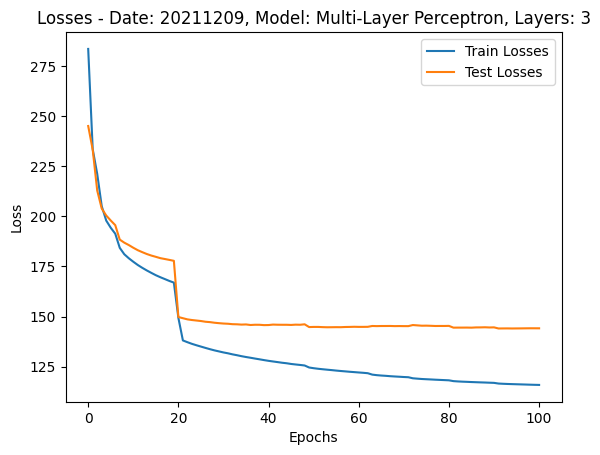

20211207uc 83
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 24835
Epoch: 000, LR: 0.001000, Train Loss: 115.997076, Test Loss: 102.074473. Train R2: 0.1959268, Test R2: 0.1796821, Train pR2: -2.0270426, Test pR2: -2.0461061
Epoch: 050, LR: 0.001000, Train Loss: 66.136645, Test Loss: 82.200706. Train R2: 0.4645114, Test R2: 0.3384633, Train pR2: -1.1209326, Test pR2: -1.2678046
Epoch: 100, LR: 0.000410, Train Loss: 60.036606, Test Loss: 82.262366. Train R2: 0.5072145, Test R2: 0.3380632, Train pR2: -0.9893367, Test pR2: -1.1575359
Time to train model: 162.818519115448


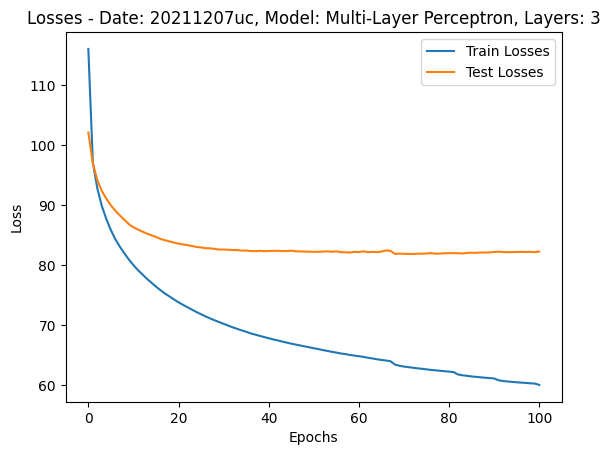

20211206uc 99
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26643
Epoch: 000, LR: 0.001000, Train Loss: 79.454588, Test Loss: 68.936243. Train R2: 0.2405958, Test R2: 0.2308147, Train pR2: -1.0701169, Test pR2: -1.0820427
Epoch: 050, LR: 0.001000, Train Loss: 50.334176, Test Loss: 56.768772. Train R2: 0.4456103, Test R2: 0.3666980, Train pR2: -0.4396277, Test pR2: -0.5215710
Epoch: 100, LR: 0.000512, Train Loss: 47.607150, Test Loss: 56.214167. Train R2: 0.4725158, Test R2: 0.3728165, Train pR2: -0.4121707, Test pR2: -0.5127524
Time to train model: 259.4512960910797


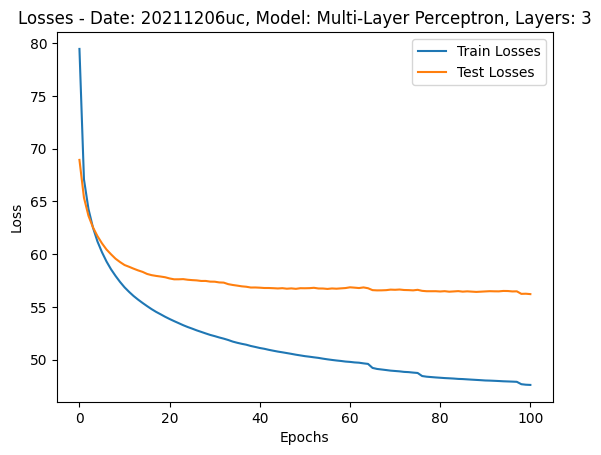

20211206pipe 75
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 23931
Epoch: 000, LR: 0.001000, Train Loss: 83.565439, Test Loss: 71.941533. Train R2: -0.1247360, Test R2: -0.1320989, Train pR2: -5.9323025, Test pR2: -5.9020872
Epoch: 050, LR: 0.001000, Train Loss: 34.154785, Test Loss: 41.739397. Train R2: 0.4724007, Test R2: 0.3414301, Train pR2: -0.3737814, Test pR2: -0.6644572
Epoch: 100, LR: 0.000410, Train Loss: 30.653975, Test Loss: 41.940933. Train R2: 0.5210038, Test R2: 0.3377983, Train pR2: -0.2014593, Test pR2: -0.7284544
Time to train model: 77.00926375389099


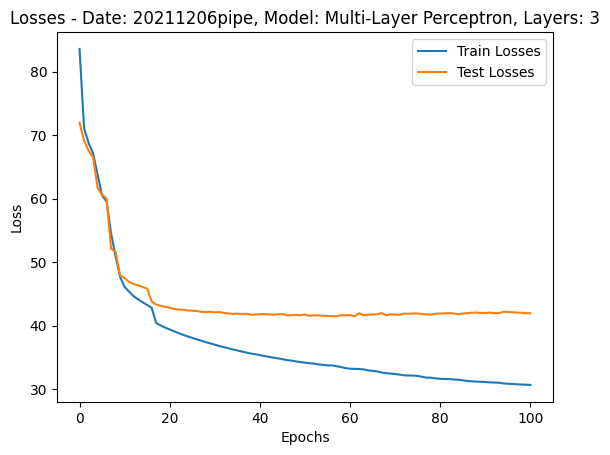

20211203 25
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 18281
Epoch: 000, LR: 0.001000, Train Loss: 356.435600, Test Loss: 307.402290. Train R2: -0.0210953, Test R2: -0.0292690, Train pR2: -4.1049471, Test pR2: -4.1373568
Epoch: 050, LR: 0.001000, Train Loss: 128.142935, Test Loss: 161.412164. Train R2: 0.5651298, Test R2: 0.4604492, Train pR2: -0.3862750, Test pR2: -0.6049181
Epoch: 100, LR: 0.000410, Train Loss: 113.295982, Test Loss: 160.487308. Train R2: 0.6172448, Test R2: 0.4627564, Train pR2: -0.3110701, Test pR2: -0.6121854
Time to train model: 155.79538702964783


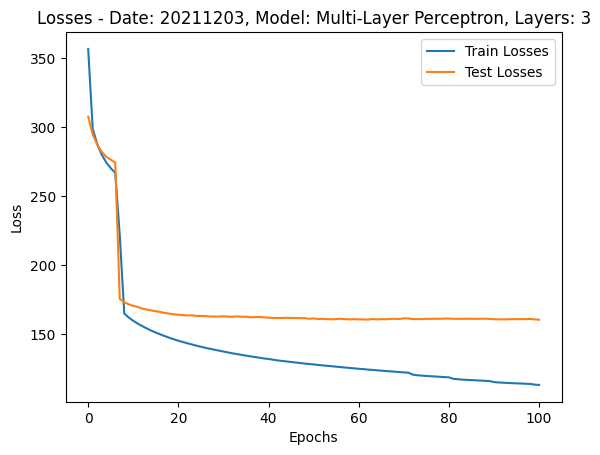

20211119uc 84
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 24948
Epoch: 000, LR: 0.001000, Train Loss: 133.766243, Test Loss: 122.001269. Train R2: 0.0418894, Test R2: 0.0310271, Train pR2: -1.7736722, Test pR2: -1.7819463
Epoch: 050, LR: 0.000512, Train Loss: 92.121658, Test Loss: 112.709802. Train R2: 0.2724031, Test R2: 0.1052562, Train pR2: -0.9847384, Test pR2: -1.1472086
Epoch: 100, LR: 0.000168, Train Loss: 86.771806, Test Loss: 114.490072. Train R2: 0.3117565, Test R2: 0.0912132, Train pR2: -0.9904807, Test pR2: -1.2232524
Time to train model: 162.22562217712402


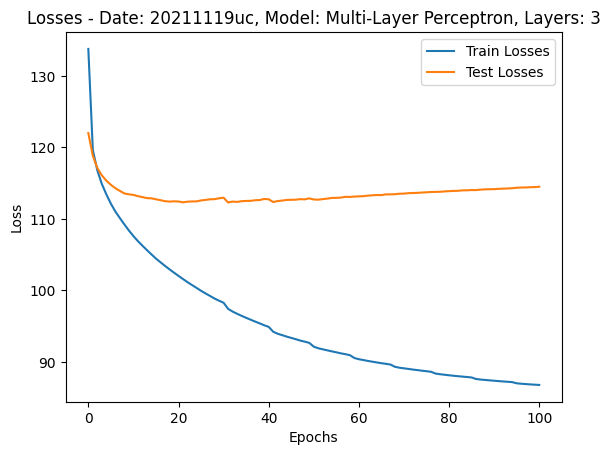

20211119stick 83
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 24835
Epoch: 000, LR: 0.001000, Train Loss: 196.951669, Test Loss: 183.484246. Train R2: -0.0263776, Test R2: -0.0299768, Train pR2: -1.4890138, Test pR2: -1.4727534
Epoch: 050, LR: 0.000512, Train Loss: 143.775975, Test Loss: 174.064093. Train R2: 0.1978447, Test R2: 0.0224597, Train pR2: -0.4407279, Test pR2: -0.6161398
Epoch: 100, LR: 0.000168, Train Loss: 135.579177, Test Loss: 176.909582. Train R2: 0.2433829, Test R2: 0.0061916, Train pR2: -0.3400478, Test pR2: -0.6188171
Time to train model: 158.91713953018188


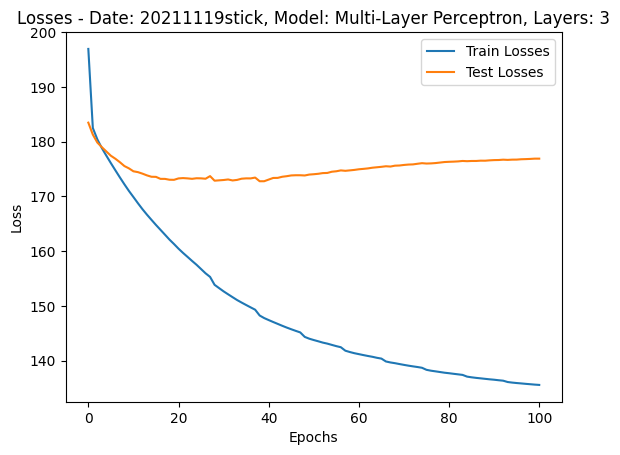

20211116uc 80
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 24496
Epoch: 000, LR: 0.001000, Train Loss: 175.886428, Test Loss: 149.129470. Train R2: 0.0264205, Test R2: 0.0000529, Train pR2: -1.5283518, Test pR2: -1.5847771
Epoch: 050, LR: 0.000512, Train Loss: 93.376476, Test Loss: 129.692382. Train R2: 0.3811523, Test R2: 0.1270112, Train pR2: -0.3757088, Test pR2: -0.6556467
Epoch: 100, LR: 0.000134, Train Loss: 86.417799, Test Loss: 128.944156. Train R2: 0.4297829, Test R2: 0.1328737, Train pR2: -0.3312333, Test pR2: -0.7236845
Time to train model: 75.4165518283844


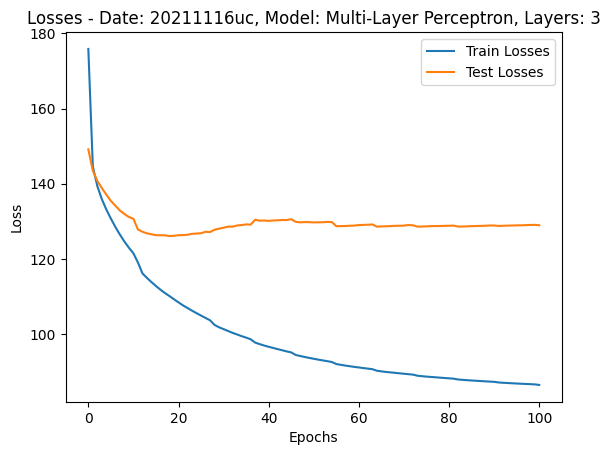

20211116stick 95
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26191
Epoch: 000, LR: 0.001000, Train Loss: 219.248146, Test Loss: 163.356903. Train R2: 0.1091763, Test R2: 0.1046193, Train pR2: -2.9754360, Test pR2: -2.9595575
Epoch: 050, LR: 0.000512, Train Loss: 124.486356, Test Loss: 146.574754. Train R2: 0.3161827, Test R2: 0.1965871, Train pR2: -1.2672212, Test pR2: -1.3654777
Epoch: 100, LR: 0.000168, Train Loss: 119.754865, Test Loss: 147.040490. Train R2: 0.3424002, Test R2: 0.1940319, Train pR2: -0.9716524, Test pR2: -1.0931137
Time to train model: 332.99574041366577


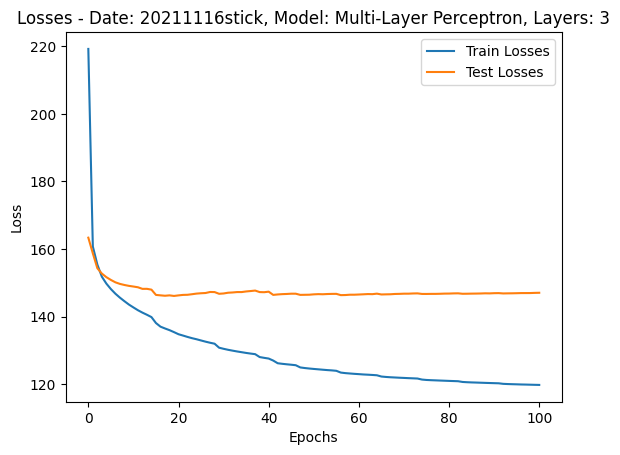

20210928 84
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 24948
Epoch: 000, LR: 0.001000, Train Loss: 131.059773, Test Loss: 119.711177. Train R2: 0.2324209, Test R2: 0.2275226, Train pR2: -0.9744843, Test pR2: -0.9875880
Epoch: 050, LR: 0.001000, Train Loss: 87.475288, Test Loss: 95.979881. Train R2: 0.4364084, Test R2: 0.3807152, Train pR2: -0.3426969, Test pR2: -0.3951635
Epoch: 100, LR: 0.000640, Train Loss: 83.451594, Test Loss: 95.477794. Train R2: 0.4579328, Test R2: 0.3839630, Train pR2: -0.3254332, Test pR2: -0.3956335
Time to train model: 336.49902987480164


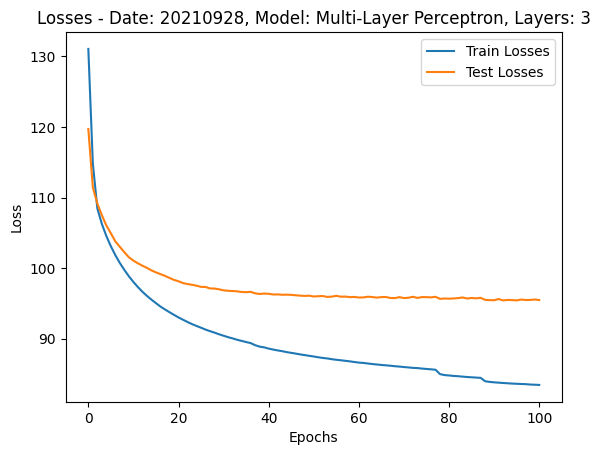

In [11]:
mlp_models_dict_3layers = {}
for date in new_dates_list:
    print(date, dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = dataset_dict[date]['Joint Angles']['Full']
    train_loader = loader_dict[date]['Joint Angles']['Train']
    test_loader = loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_layers = 3
    model = visualization.plot_losses_MLP(dataset, train_loader, test_loader, learning_rate, num_layers, save = True)
    mlp_models_dict_3layers[date] = model

Multi-Layer Perceptron, full dataset
Num Layers: 2, Hidden Layer Dimensionality: 112, Total Parameters: 13648
Epoch: 000, LR: 0.001000, Train Loss: 110.242470, Test Loss: 85.648548. Train R2: 0.2227628, Test R2: 0.2172248, Train pR2: -1.4455748, Test pR2: -1.4471122
Epoch: 050, LR: 0.001000, Train Loss: 73.246366, Test Loss: 75.434198. Train R2: 0.3372012, Test R2: 0.3107605, Train pR2: -1.0315164, Test pR2: -1.0566396
Epoch: 100, LR: 0.001000, Train Loss: 68.053481, Test Loss: 71.240367. Train R2: 0.3838967, Test R2: 0.3491906, Train pR2: -0.0270377, Test pR2: -0.0676880
Epoch: 150, LR: 0.000800, Train Loss: 66.939788, Test Loss: 70.511726. Train R2: 0.3947848, Test R2: 0.3559410, Train pR2: -0.0124011, Test pR2: -0.0551160
Epoch: 200, LR: 0.000640, Train Loss: 66.104858, Test Loss: 70.213009. Train R2: 0.4017266, Test R2: 0.3586782, Train pR2: -0.0091583, Test pR2: -0.0589940
Epoch: 250, LR: 0.000328, Train Loss: 65.124615, Test Loss: 69.701452. Train R2: 0.4094337, Test R2: 0.363331

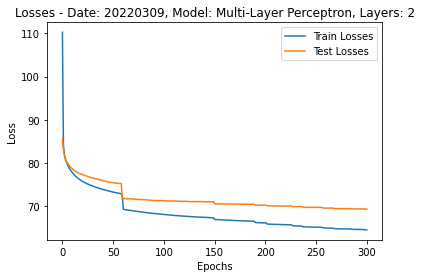

In [ ]:
mlp_2layers_addedrelu = plot_losses_MLP(dataset_dict['20220309']['Joint Angles']['Full'], \
                                        loader_dict['20220309']['Joint Angles']['Train'], \
                                        loader_dict['20220309']['Joint Angles']['Test'], \
                                        0.001, 2, add_relu = True, adapt_lr = True, save = True)

Multi-Layer Perceptron, full dataset
Num Layers: 2, Hidden Layer Dimensionality: 112, Total Parameters: 13648
Epoch: 000, LR: 0.001000, Train Loss: 114.481267, Test Loss: 82.896527. Train R2: 0.2489264, Test R2: 0.2424289, Train pR2: -0.5805938, Test pR2: -0.5871055
Epoch: 050, LR: 0.001000, Train Loss: 69.660131, Test Loss: 72.188498. Train R2: 0.3671905, Test R2: 0.3404906, Train pR2: -0.0235419, Test pR2: -0.0566750
Epoch: 100, LR: 0.001000, Train Loss: 67.854009, Test Loss: 71.451003. Train R2: 0.3807961, Test R2: 0.3471995, Train pR2: -0.0352075, Test pR2: -0.0801329
Epoch: 150, LR: 0.001000, Train Loss: 67.052450, Test Loss: 71.033912. Train R2: 0.3883481, Test R2: 0.3509880, Train pR2: -0.0362875, Test pR2: -0.0893766
Epoch: 200, LR: 0.001000, Train Loss: 66.530767, Test Loss: 71.043473. Train R2: 0.3923525, Test R2: 0.3508552, Train pR2: -0.0409511, Test pR2: -0.0992218
Epoch: 250, LR: 0.001000, Train Loss: 66.163387, Test Loss: 70.946727. Train R2: 0.3948463, Test R2: 0.351702

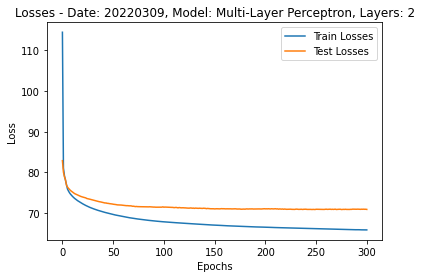

In [ ]:
m = plot_losses_MLP(dataset_dict['20220309']['Joint Angles']['Full'], \
                    loader_dict['20220309']['Joint Angles']['Train'], \
                    loader_dict['20220309']['Joint Angles']['Test'], \
                    0.001, 2, add_relu = True, adapt_lr = False, save = False)

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 26304
Epoch: 000, LR: 0.001000, Train Loss: 128.737854, Test Loss: 112.551250. Train R2: -0.0119799, Test R2: -0.0378976, Train pR2: -8.1818342, Test pR2: -8.5144615
Epoch: 050, LR: 0.001000, Train Loss: 63.746996, Test Loss: 69.636404. Train R2: 0.4227581, Test R2: 0.3584076, Train pR2: -0.1727056, Test pR2: -0.2287008
Epoch: 100, LR: 0.000800, Train Loss: 59.637325, Test Loss: 68.531403. Train R2: 0.4542749, Test R2: 0.3685013, Train pR2: -0.0282746, Test pR2: -0.1128705
Epoch: 150, LR: 0.000512, Train Loss: 57.181460, Test Loss: 68.076892. Train R2: 0.4753909, Test R2: 0.3726706, Train pR2: 0.0012823, Test pR2: -0.1080636
Epoch: 200, LR: 0.000210, Train Loss: 55.559137, Test Loss: 67.586299. Train R2: 0.4924432, Test R2: 0.3771091, Train pR2: 0.0141869, Test pR2: -0.1132520
Epoch: 250, LR: 0.000086, Train Loss: 54.715399, Test Loss: 67.369287. Train R2: 0.5021048, Test R2: 0.37901

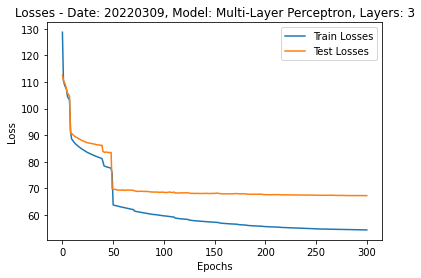

In [ ]:
mlp_3layers_addedrelu = plot_losses_MLP(dataset_dict['20220309']['Joint Angles']['Full'], \
                                        loader_dict['20220309']['Joint Angles']['Train'], \
                                        loader_dict['20220309']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

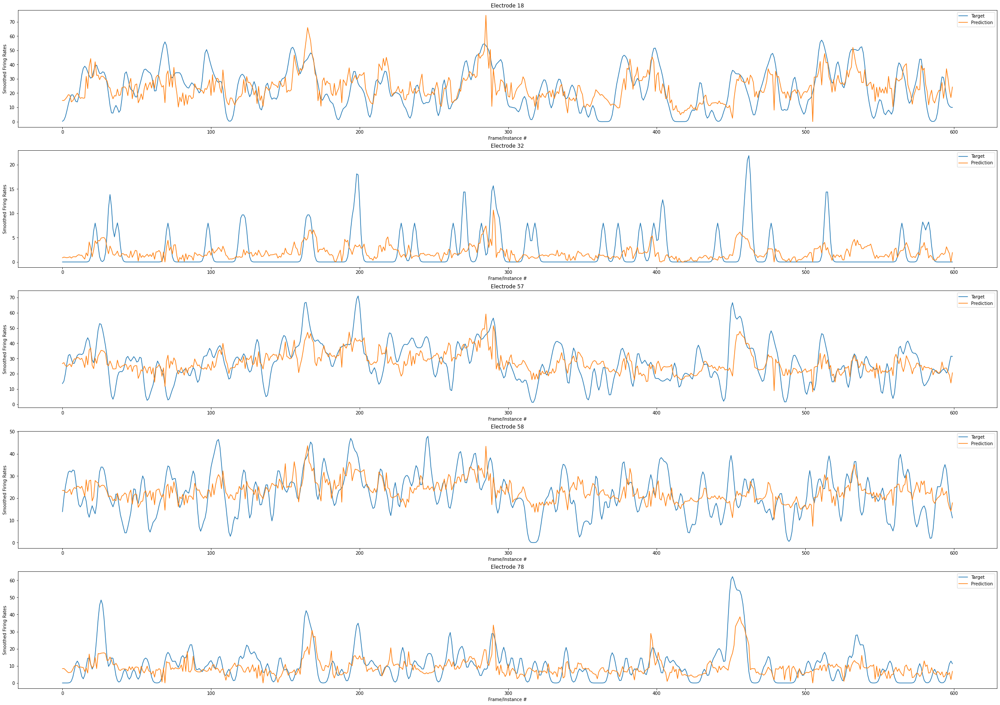

In [ ]:
plot_top_5_electrodes(mlp_3layers_addedrelu, good_input_20220309, good_output_frates_20220309)

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 31502
Epoch: 000, LR: 0.001000, Train Loss: 167.303542, Test Loss: 149.227604. Train R2: 0.0179023, Test R2: 0.0154838, Train pR2: -5.3060889, Test pR2: -5.2882915
Epoch: 050, LR: 0.001000, Train Loss: 90.560833, Test Loss: 96.334301. Train R2: 0.3979526, Test R2: 0.3661262, Train pR2: -0.1271791, Test pR2: -0.1722024
Epoch: 100, LR: 0.000800, Train Loss: 87.244690, Test Loss: 94.529190. Train R2: 0.4201503, Test R2: 0.3780527, Train pR2: -0.1224631, Test pR2: -0.1833864
Epoch: 150, LR: 0.000640, Train Loss: 85.437459, Test Loss: 93.958459. Train R2: 0.4307846, Test R2: 0.3818707, Train pR2: -0.1257925, Test pR2: -0.1943270
Epoch: 200, LR: 0.000410, Train Loss: 83.924454, Test Loss: 93.192987. Train R2: 0.4406589, Test R2: 0.3871839, Train pR2: -0.1122982, Test pR2: -0.1877112
Epoch: 250, LR: 0.000134, Train Loss: 82.499406, Test Loss: 92.316104. Train R2: 0.4510259, Test R2: 0.39338

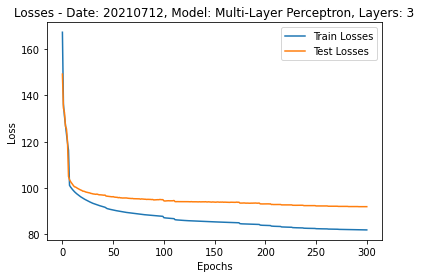

In [ ]:
mlp_3layers_addedrelu_0712 = plot_losses_MLP(dataset_dict['20210712']['Joint Angles']['Full'], \
                                        loader_dict['20210712']['Joint Angles']['Train'], \
                                        loader_dict['20210712']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 25965
Epoch: 000, LR: 0.001000, Train Loss: 174.882927, Test Loss: 152.607143. Train R2: 0.0663417, Test R2: 0.0683593, Train pR2: -1.3806895, Test pR2: -1.3676264
Epoch: 050, LR: 0.000800, Train Loss: 101.534636, Test Loss: 119.069005. Train R2: 0.3831221, Test R2: 0.2726304, Train pR2: -0.3909837, Test pR2: -0.5144487
Epoch: 100, LR: 0.000328, Train Loss: 94.406377, Test Loss: 117.856729. Train R2: 0.4260968, Test R2: 0.2799457, Train pR2: -0.3627734, Test pR2: -0.5375313
Epoch: 150, LR: 0.000107, Train Loss: 91.717775, Test Loss: 117.304971. Train R2: 0.4426688, Test R2: 0.2833281, Train pR2: -0.3425932, Test pR2: -0.5292735
Epoch: 200, LR: 0.000050, Train Loss: 90.792713, Test Loss: 117.232615. Train R2: 0.4478076, Test R2: 0.2837617, Train pR2: -0.3356723, Test pR2: -0.5295337
Epoch: 250, LR: 0.000050, Train Loss: 90.448677, Test Loss: 117.403350. Train R2: 0.4498995, Test R2: 0

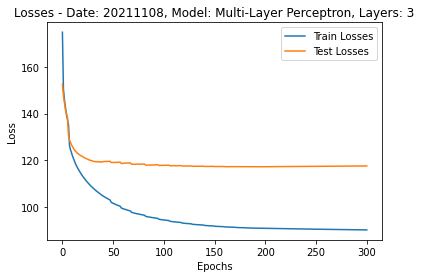

In [ ]:
mlp_3layers_addedrelu_1108 = plot_losses_MLP(dataset_dict['20211108']['Joint Angles']['Full'], \
                                        loader_dict['20211108']['Joint Angles']['Train'], \
                                        loader_dict['20211108']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

113
Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 28225
Epoch: 000, LR: 0.001000, Train Loss: 102.771539, Test Loss: 87.731819. Train R2: 0.2159066, Test R2: 0.2193690, Train pR2: -1.6883935, Test pR2: -1.6754404
Epoch: 050, LR: 0.001000, Train Loss: 68.626589, Test Loss: 72.587011. Train R2: 0.3893501, Test R2: 0.3541269, Train pR2: -0.8179168, Test pR2: -0.8485392
Epoch: 100, LR: 0.000800, Train Loss: 65.793222, Test Loss: 71.653106. Train R2: 0.4129420, Test R2: 0.3624416, Train pR2: -0.8280669, Test pR2: -0.8735202
Epoch: 150, LR: 0.000512, Train Loss: 64.124190, Test Loss: 71.180035. Train R2: 0.4256495, Test R2: 0.3666569, Train pR2: -0.8128413, Test pR2: -0.8713995
Epoch: 200, LR: 0.000210, Train Loss: 62.838740, Test Loss: 70.907990. Train R2: 0.4358350, Test R2: 0.3690815, Train pR2: -0.7997806, Test pR2: -0.8713536
Epoch: 250, LR: 0.000086, Train Loss: 62.262208, Test Loss: 70.720377. Train R2: 0.4421787, Test R2: 0.37

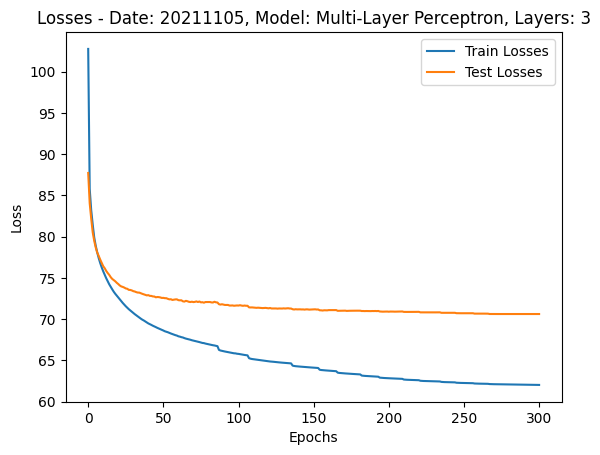

In [ ]:
print(dataset_dict['20211105']['Joint Angles']['Full'].num_neural_units)
mlp_3layers_addedrelu_1105 = plot_losses_MLP(dataset_dict['20211105']['Joint Angles']['Full'], \
                                        loader_dict['20211105']['Joint Angles']['Train'], \
                                        loader_dict['20211105']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 31841
Epoch: 000, LR: 0.001000, Train Loss: 104.131748, Test Loss: 94.113032. Train R2: 0.2235819, Test R2: 0.2158789, Train pR2: -4.4636879, Test pR2: -4.5170755
Epoch: 050, LR: 0.001000, Train Loss: 66.624974, Test Loss: 71.923135. Train R2: 0.4440639, Test R2: 0.4008098, Train pR2: -1.4202845, Test pR2: -1.5552310
Epoch: 100, LR: 0.000800, Train Loss: 61.035795, Test Loss: 68.030481. Train R2: 0.4880153, Test R2: 0.4332159, Train pR2: -0.8602919, Test pR2: -1.0064029
Epoch: 150, LR: 0.000410, Train Loss: 59.399563, Test Loss: 67.414388. Train R2: 0.5018697, Test R2: 0.4383632, Train pR2: -0.7798029, Test pR2: -0.9541431
Epoch: 200, LR: 0.000328, Train Loss: 58.846045, Test Loss: 67.204577. Train R2: 0.5065692, Test R2: 0.4401065, Train pR2: -0.7726535, Test pR2: -0.9591536
Epoch: 250, LR: 0.000168, Train Loss: 58.249463, Test Loss: 67.039611. Train R2: 0.5121257, Test R2: 0.441465

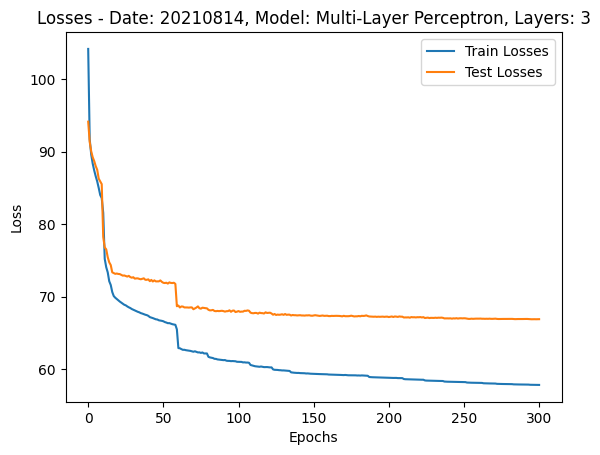

In [ ]:
mlp_3layers_addedrelu_0814 = plot_losses_MLP(dataset_dict['20210814']['Joint Angles']['Full'], \
                                        loader_dict['20210814']['Joint Angles']['Train'], \
                                        loader_dict['20210814']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

Multi-Layer Perceptron, full dataset
Num Layers: 3, Hidden Layer Dimensionality: 112, Total Parameters: 32745
Epoch: 000, LR: 0.001000, Train Loss: 103.325305, Test Loss: 92.312574. Train R2: 0.1836438, Test R2: 0.1811198, Train pR2: -1.7210462, Test pR2: -1.7216560
Epoch: 050, LR: 0.001000, Train Loss: 71.765636, Test Loss: 75.390569. Train R2: 0.3632622, Test R2: 0.3313908, Train pR2: -0.3947608, Test pR2: -0.4310802
Epoch: 100, LR: 0.000640, Train Loss: 69.426583, Test Loss: 74.438234. Train R2: 0.3833349, Test R2: 0.3398041, Train pR2: -0.3720720, Test pR2: -0.4253047
Epoch: 150, LR: 0.000262, Train Loss: 67.962963, Test Loss: 73.586650. Train R2: 0.3981429, Test R2: 0.3472958, Train pR2: -0.3525434, Test pR2: -0.4198232
Epoch: 200, LR: 0.000107, Train Loss: 67.316525, Test Loss: 73.249797. Train R2: 0.4044582, Test R2: 0.3502795, Train pR2: -0.3471901, Test pR2: -0.4212450
Epoch: 250, LR: 0.000050, Train Loss: 67.037235, Test Loss: 73.142602. Train R2: 0.4068862, Test R2: 0.351235

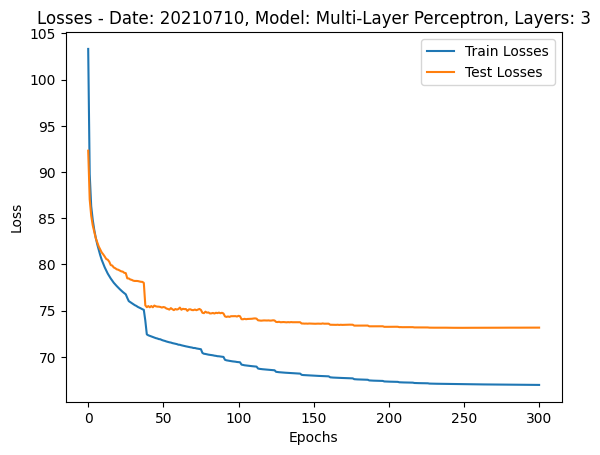

In [ ]:
mlp_3layers_addedrelu_0710 = plot_losses_MLP(dataset_dict['20210710']['Joint Angles']['Full'], \
                                        loader_dict['20210710']['Joint Angles']['Train'], \
                                        loader_dict['20210710']['Joint Angles']['Test'], \
                                        0.001, 3, add_relu = True, adapt_lr = True, save = True)

In [ ]:
mlp_3layers_addedrelu = FCNet(24, 96, 3, 112, add_relu = True)
mlp_3layers_addedrelu.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/MLP/Pop_FR_OpenSIM/MLP_20220309_Joint Angles_3_layers_reluadded'))

<All keys matched successfully>

In [ ]:
mlp_pr2_0309 = get_all_pr2(mlp_3layers_addedrelu, dataset_dict['20220309']['Joint Angles']['Full'], loader_dict['20220309']['Joint Angles']['Test'])

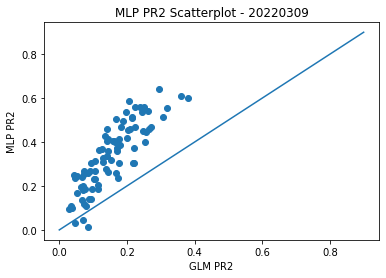

In [ ]:
inds = np.where(mlp_pr2_0309>0)
plt.scatter(pr2_glm[inds],mlp_pr2_0309[inds])
plt.plot(np.arange(0,1,0.1),np.arange(0,1,0.1))
plt.xlabel('GLM PR2')
plt.ylabel('MLP PR2')
plt.title('MLP PR2 Scatterplot - 20220309')
plt.show()

# Temp CNN

20211207pipe 90
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 138666
Epoch: 000, LR: 0.001000, Train Loss: 533.596307, Test Loss: 309.711914. Train R2: -1.3824715, Test R2: -1.4419583, Train pR2: -9.6034594, Test pR2: -12.0936308
Epoch: 050, LR: 0.001000, Train Loss: 97.101009, Test Loss: 100.385517. Train R2: 0.4202233, Test R2: 0.1724149, Train pR2: -1.8586301, Test pR2: -1.9987700
Epoch: 100, LR: 0.000410, Train Loss: 80.419596, Test Loss: 100.307777. Train R2: 0.5076842, Test R2: 0.1732279, Train pR2: -1.4102539, Test pR2: -1.6512315
Time to train model: 16.010243892669678


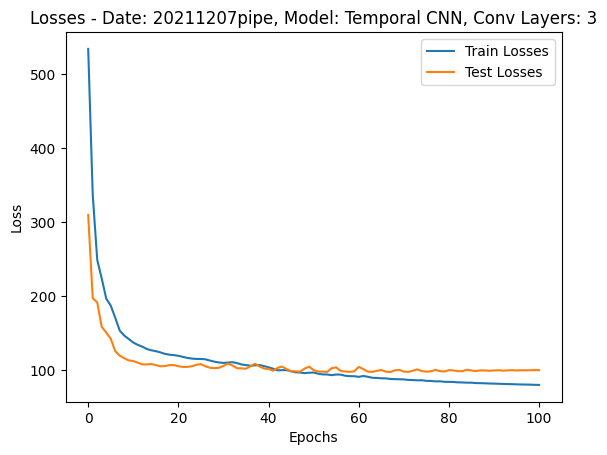

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211207pipe/TempCNN_20211207pipe_Joint Angles_3_convlayers_reluadded
20211208pipe 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 5543.255566, Test Loss: 3858.974976. Train R2: -2.8406044, Test R2: -2.8078275, Train pR2: -17.7157669, Test pR2: -16.6339817
Epoch: 050, LR: 0.001000, Train Loss: 826.325952, Test Loss: 779.832153. Train R2: 0.2544396, Test R2: 0.1638924, Train pR2: -1.0742145, Test pR2: -1.1066574
Epoch: 100, LR: 0.000512, Train Loss: 658.633679, Test Loss: 755.062042. Train R2: 0.3976717, Test R2: 0.1868167, Train pR2: -0.9837217, Test pR2: -1.1730858
Time to train model: 13.558969020843506


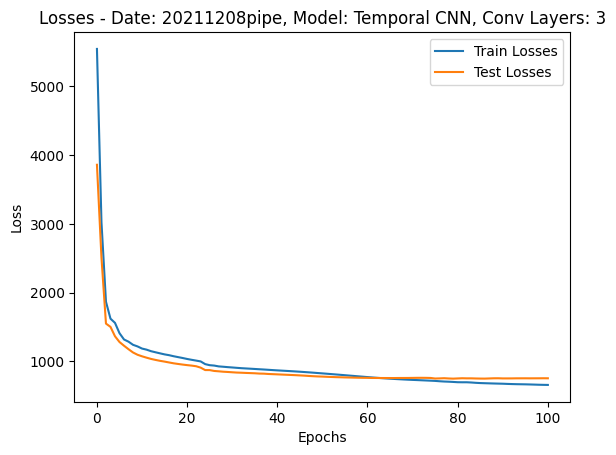

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211208pipe/TempCNN_20211208pipe_Joint Angles_3_convlayers_reluadded
20211208uc 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 4818.664844, Test Loss: 4026.909546. Train R2: -3.0735592, Test R2: -3.2117121, Train pR2: -27.4099140, Test pR2: -28.4346600
Epoch: 050, LR: 0.001000, Train Loss: 486.025684, Test Loss: 617.951782. Train R2: 0.4538782, Test R2: 0.3396709, Train pR2: -3.4119618, Test pR2: -3.7800963
Epoch: 100, LR: 0.000800, Train Loss: 412.334351, Test Loss: 589.062103. Train R2: 0.5324818, Test R2: 0.3818621, Train pR2: -3.3347089, Test pR2: -3.7344558
Time to train model: 13.818262815475464


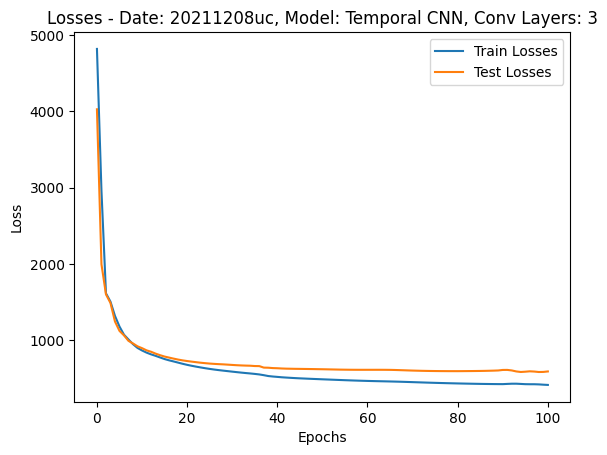

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211208uc/TempCNN_20211208uc_Joint Angles_3_convlayers_reluadded
20220210uc 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 2988.673438, Test Loss: 2345.290894. Train R2: -4.0132561, Test R2: -4.1010755, Train pR2: -9.4621973, Test pR2: -10.7917871
Epoch: 050, LR: 0.001000, Train Loss: 342.606650, Test Loss: 350.021393. Train R2: 0.2504459, Test R2: 0.0966441, Train pR2: -9.0902376, Test pR2: -9.7933817
Epoch: 100, LR: 0.000512, Train Loss: 275.312302, Test Loss: 298.062393. Train R2: 0.3950217, Test R2: 0.2111642, Train pR2: -7.5429864, Test pR2: -8.1895113
Time to train model: 14.503777503967285


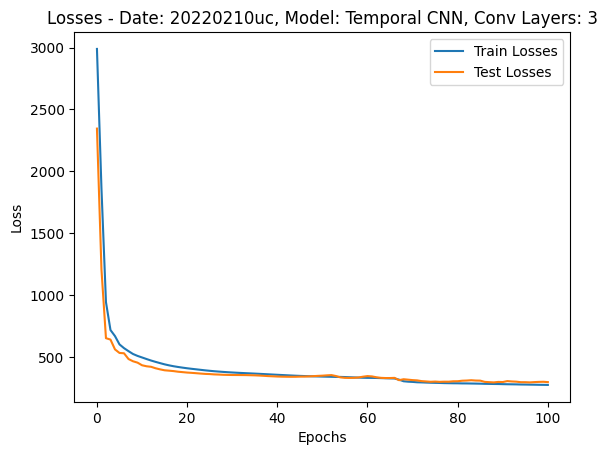

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220210uc/TempCNN_20220210uc_Joint Angles_3_convlayers_reluadded
20220210pipe 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 2560.923682, Test Loss: 2085.869019. Train R2: -1.7352237, Test R2: -1.9125581, Train pR2: -12.1941786, Test pR2: -12.3917494
Epoch: 050, LR: 0.001000, Train Loss: 461.653650, Test Loss: 446.574875. Train R2: 0.3800906, Test R2: 0.2939011, Train pR2: -3.8327076, Test pR2: -3.6577632
Epoch: 100, LR: 0.000800, Train Loss: 358.889349, Test Loss: 433.917847. Train R2: 0.5133130, Test R2: 0.3247696, Train pR2: -2.5316238, Test pR2: -2.4765971
Time to train model: 14.50240969657898


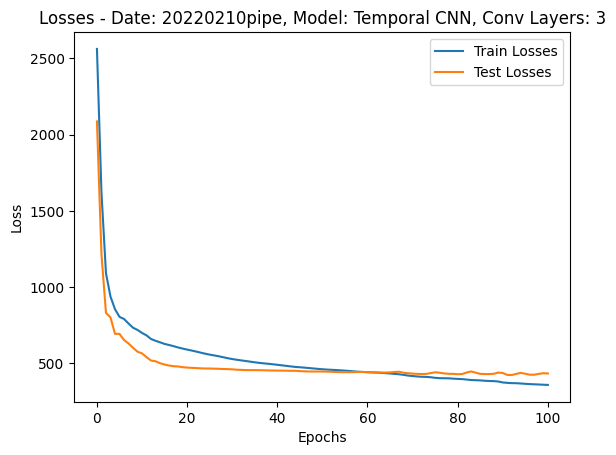

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220210pipe/TempCNN_20220210pipe_Joint Angles_3_convlayers_reluadded


In [83]:
tcn_models_dict = {}
for date in new_dates:
    print(date, tcn_dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = tcn_dataset_dict[date]['Joint Angles']['Full']
    train_loader = tcn_loader_dict[date]['Joint Angles']['Train']
    test_loader = tcn_loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_conv_layers = 3
    tcn = visualization.plot_losses_TempCNN(dataset, train_loader, test_loader, learning_rate, num_conv_layers, save = True, numepochs = 101)
    tcn_models_dict[date] = tcn

20211207pipe 90
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 524970
Epoch: 000, LR: 0.001000, Train Loss: 487.764435, Test Loss: 258.509476. Train R2: -0.7677907, Test R2: -0.7977245, Train pR2: -5.4036074, Test pR2: -5.0601597
Epoch: 050, LR: 0.000640, Train Loss: 100.109424, Test Loss: 99.956898. Train R2: 0.3969726, Test R2: 0.1758232, Train pR2: -3.1147463, Test pR2: -3.1701682
Epoch: 100, LR: 0.000168, Train Loss: 88.030856, Test Loss: 100.107086. Train R2: 0.4616212, Test R2: 0.1703096, Train pR2: -3.0717421, Test pR2: -3.1871650
Time to train model: 23.63229203224182


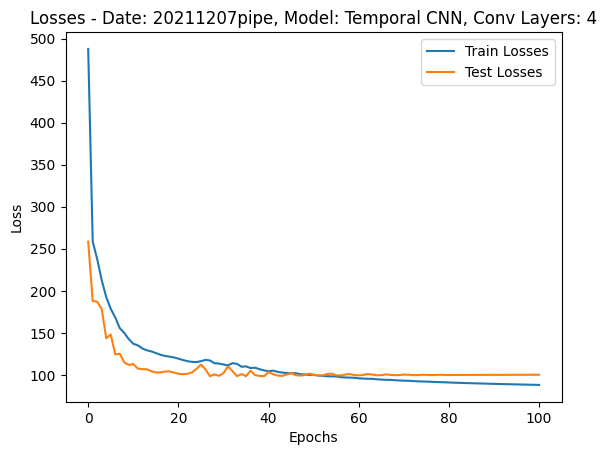

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211207pipe/TempCNN_20211207pipe_Joint Angles_4_convlayers_reluadded
20211208pipe 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 4744.549951, Test Loss: 3381.156738. Train R2: -1.9515914, Test R2: -2.6272509, Train pR2: -6.5467525, Test pR2: -6.6202617
Epoch: 050, LR: 0.001000, Train Loss: 815.376440, Test Loss: 832.726257. Train R2: 0.2578195, Test R2: 0.1392332, Train pR2: -2.5866687, Test pR2: -2.5916131
Epoch: 100, LR: 0.000410, Train Loss: 619.828967, Test Loss: 824.136383. Train R2: 0.4304374, Test R2: 0.0997173, Train pR2: -2.4561844, Test pR2: -2.6291714
Time to train model: 21.599382877349854


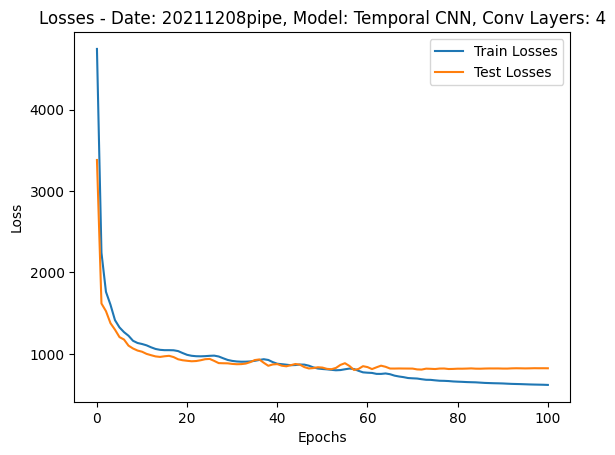

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211208pipe/TempCNN_20211208pipe_Joint Angles_4_convlayers_reluadded
20211208uc 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 4606.731738, Test Loss: 2914.485840. Train R2: -2.0160867, Test R2: -2.1215659, Train pR2: -17.0278091, Test pR2: -18.0288563
Epoch: 050, LR: 0.001000, Train Loss: 407.539496, Test Loss: 568.316711. Train R2: 0.5381987, Test R2: 0.3824995, Train pR2: -1.1524843, Test pR2: -1.2898782
Epoch: 100, LR: 0.000640, Train Loss: 339.002448, Test Loss: 549.558685. Train R2: 0.6227767, Test R2: 0.3962101, Train pR2: -1.0808147, Test pR2: -1.2996887
Time to train model: 22.600598096847534


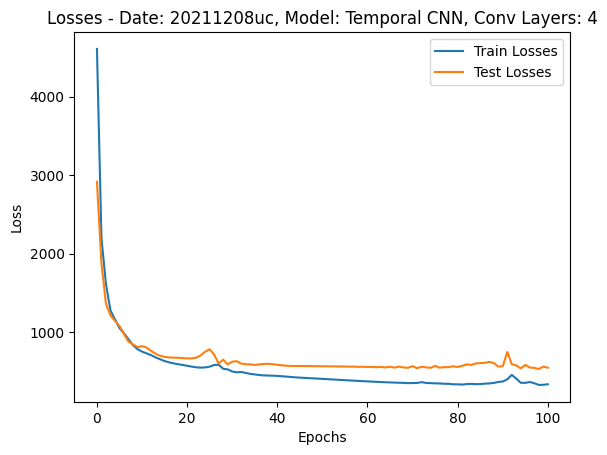

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211208uc/TempCNN_20211208uc_Joint Angles_4_convlayers_reluadded
20220210uc 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 2776.152563, Test Loss: 1541.867859. Train R2: -2.2845805, Test R2: -2.3819619, Train pR2: -4.5598369, Test pR2: -5.1542234
Epoch: 050, LR: 0.000800, Train Loss: 298.610696, Test Loss: 325.252335. Train R2: 0.3469635, Test R2: 0.1655382, Train pR2: -8.0270357, Test pR2: -8.5570641
Epoch: 100, LR: 0.000328, Train Loss: 240.441235, Test Loss: 329.810989. Train R2: 0.4694570, Test R2: 0.1971982, Train pR2: -7.4531770, Test pR2: -7.9151917
Time to train model: 22.99579358100891


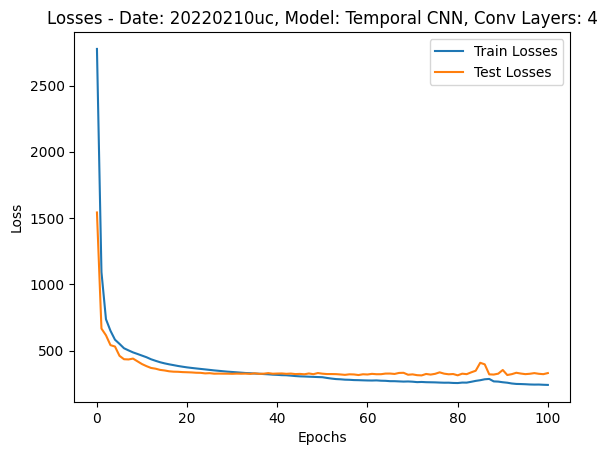

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220210uc/TempCNN_20220210uc_Joint Angles_4_convlayers_reluadded
20220210pipe 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 2396.145752, Test Loss: 1502.450562. Train R2: -1.0450695, Test R2: -1.2215997, Train pR2: -3.3055105, Test pR2: -3.5826197
Epoch: 050, LR: 0.000640, Train Loss: 444.975720, Test Loss: 459.259491. Train R2: 0.4027369, Test R2: 0.2703530, Train pR2: -5.6347184, Test pR2: -5.3948188
Epoch: 100, LR: 0.000210, Train Loss: 342.807404, Test Loss: 449.984772. Train R2: 0.5299608, Test R2: 0.2752970, Train pR2: -5.1162448, Test pR2: -4.9670830
Time to train model: 23.020921230316162


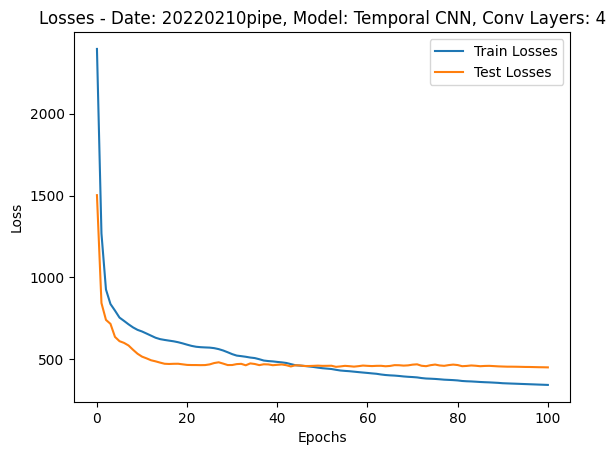

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220210pipe/TempCNN_20220210pipe_Joint Angles_4_convlayers_reluadded


In [84]:
tcn_models_dict = {}
for date in new_dates:
    print(date, tcn_dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = tcn_dataset_dict[date]['Joint Angles']['Full']
    train_loader = tcn_loader_dict[date]['Joint Angles']['Train']
    test_loader = tcn_loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_conv_layers = 4
    tcn = visualization.plot_losses_TempCNN(dataset, train_loader, test_loader, learning_rate, num_conv_layers, save = True, numepochs = 101)
    tcn_models_dict[date] = tcn

20210814 145
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 546145
Epoch: 000, LR: 0.001000, Train Loss: 183.773459, Test Loss: 124.560448. Train R2: -0.1208244, Test R2: -0.1036770, Train pR2: -4.1559477, Test pR2: -4.1722288
Epoch: 050, LR: 0.001000, Train Loss: 56.100852, Test Loss: 63.342500. Train R2: 0.4900434, Test R2: 0.4388794, Train pR2: -1.2813010, Test pR2: -1.3669893
Epoch: 100, LR: 0.000512, Train Loss: 50.160361, Test Loss: 63.270517. Train R2: 0.5404178, Test R2: 0.4396168, Train pR2: -1.0428109, Test pR2: -1.1735325
Time to train model: 78.38019013404846


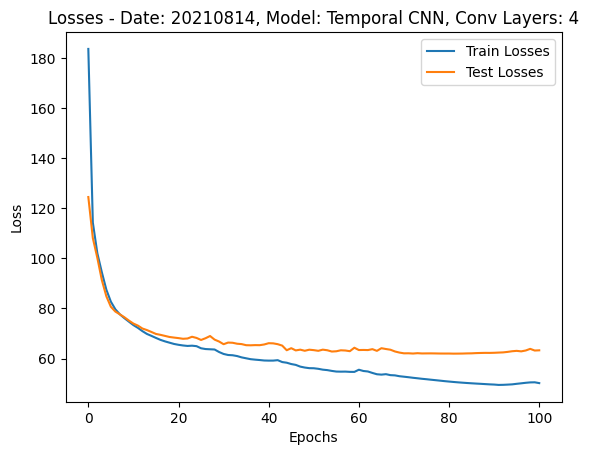

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20210814/TempCNN_20210814_Joint Angles_4_convlayers_reluadded
20220309 96
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 422.763678, Test Loss: 224.655991. Train R2: -1.0485314, Test R2: -1.0899248, Train pR2: -17.1554203, Test pR2: -20.2402630
Epoch: 050, LR: 0.001000, Train Loss: 68.322990, Test Loss: 68.149672. Train R2: 0.3898518, Test R2: 0.3141592, Train pR2: -1.1356845, Test pR2: -1.2016276
Epoch: 100, LR: 0.000512, Train Loss: 53.684490, Test Loss: 67.026827. Train R2: 0.4575533, Test R2: 0.3200613, Train pR2: -0.7740080, Test pR2: -0.8782237
Time to train model: 21.36796283721924


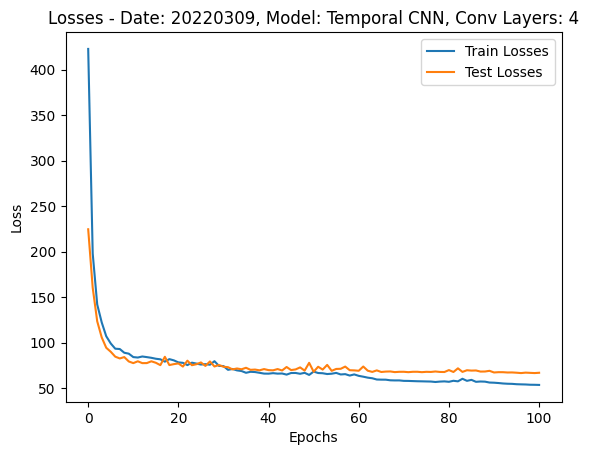

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220309/TempCNN_20220309_Joint Angles_4_convlayers_reluadded


In [88]:
tcn_models_dict = {}
for date in ['20210814','20220309']:
    print(date, tcn_dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = tcn_dataset_dict[date]['Joint Angles']['Full']
    train_loader = tcn_loader_dict[date]['Joint Angles']['Train']
    test_loader = tcn_loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_conv_layers = 4
    tcn = visualization.plot_losses_TempCNN(dataset, train_loader, test_loader, learning_rate, num_conv_layers, save = True, numepochs = 101)
    tcn_models_dict[date] = tcn

In [87]:
tcn_models_dict = {}
for date in new_dates_list:
    print(date, tcn_dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = tcn_dataset_dict[date]['Joint Angles']['Full']
    train_loader = tcn_loader_dict[date]['Joint Angles']['Train']
    test_loader = tcn_loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_conv_layers = 3
    tcn = visualization.plot_losses_TempCNN(dataset, train_loader, test_loader, learning_rate, num_conv_layers, save = True, numepochs = 101)
    tcn_models_dict[date] = tcn

NameError: ignored

20220224 108
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 531900
Epoch: 000, LR: 0.001000, Train Loss: 291.276846, Test Loss: 167.562019. Train R2: -0.5169915, Test R2: -0.5016124, Train pR2: -4.1966796, Test pR2: -3.9520080
Epoch: 050, LR: 0.000410, Train Loss: 114.523026, Test Loss: 129.160400. Train R2: -0.0465372, Test R2: -0.1539531, Train pR2: -4.3126221, Test pR2: -4.2091103
Epoch: 100, LR: 0.000134, Train Loss: 109.098268, Test Loss: 131.878853. Train R2: -0.0049488, Test R2: -0.1748366, Train pR2: -4.2887616, Test pR2: -4.2246509
Time to train model: 21.3407301902771


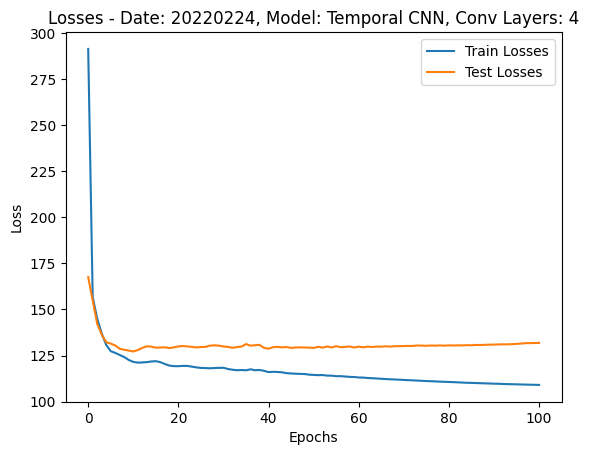

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220224/TempCNN_20220224_Joint Angles_4_convlayers_reluadded
20211209 104
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 530360
Epoch: 000, LR: 0.001000, Train Loss: 802.813477, Test Loss: 486.945190. Train R2: -0.8978157, Test R2: -0.9309145, Train pR2: -6.2917638, Test pR2: -6.6182146
Epoch: 050, LR: 0.001000, Train Loss: 152.221475, Test Loss: 194.994499. Train R2: 0.3539616, Test R2: 0.1904247, Train pR2: -0.7399089, Test pR2: -0.9959994
Epoch: 100, LR: 0.000410, Train Loss: 125.289610, Test Loss: 188.109444. Train R2: 0.4847647, Test R2: 0.2208629, Train pR2: -0.2105428, Test pR2: -0.4648422
Time to train model: 20.486238718032837


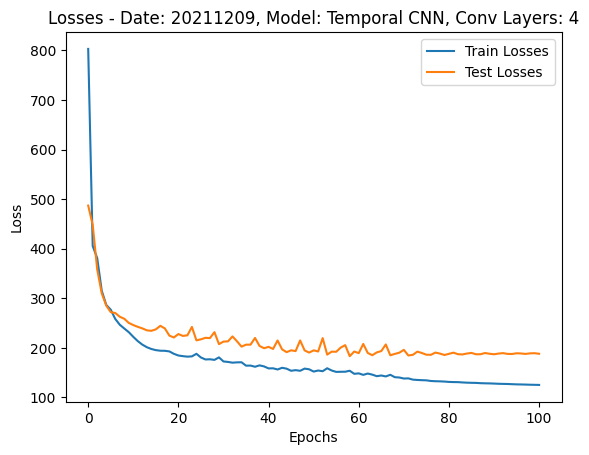

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211209/TempCNN_20211209_Joint Angles_4_convlayers_reluadded
20211207uc 83
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 522275
Epoch: 000, LR: 0.001000, Train Loss: 277.476633, Test Loss: 154.630173. Train R2: -0.2555634, Test R2: -0.2796936, Train pR2: -2.8425667, Test pR2: -2.8116777
Epoch: 050, LR: 0.001000, Train Loss: 62.804393, Test Loss: 100.076866. Train R2: 0.4797927, Test R2: 0.2056407, Train pR2: -2.8142035, Test pR2: -3.0993984
Epoch: 100, LR: 0.000262, Train Loss: 52.734872, Test Loss: 103.466702. Train R2: 0.5628608, Test R2: 0.1913357, Train pR2: -1.9982921, Test pR2: -2.4213357
Time to train model: 19.648402452468872


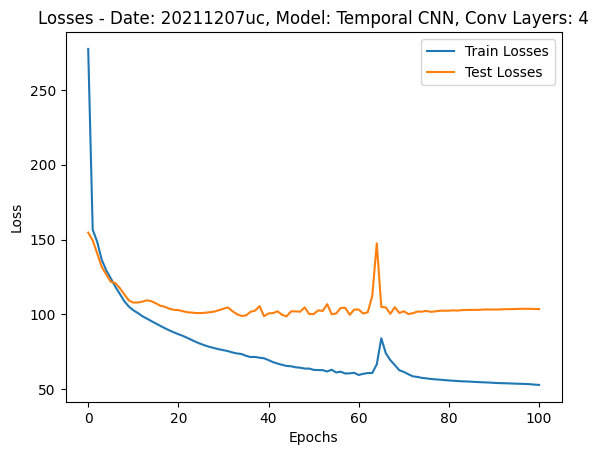

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211207uc/TempCNN_20211207uc_Joint Angles_4_convlayers_reluadded
20211206uc 99
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 528435
Epoch: 000, LR: 0.001000, Train Loss: 190.375828, Test Loss: 122.418133. Train R2: -0.3121830, Test R2: -0.3619766, Train pR2: -4.0224814, Test pR2: -4.0128384
Epoch: 050, LR: 0.000640, Train Loss: 57.657784, Test Loss: 74.176044. Train R2: 0.3455013, Test R2: 0.1726967, Train pR2: -2.5501826, Test pR2: -2.6998541
Epoch: 100, LR: 0.000210, Train Loss: 45.814322, Test Loss: 70.098095. Train R2: 0.4878068, Test R2: 0.2168281, Train pR2: -1.9386351, Test pR2: -2.1425035
Time to train model: 31.18865203857422


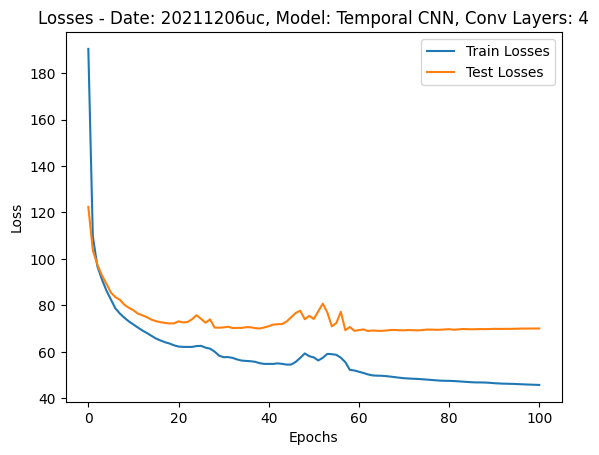

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211206uc/TempCNN_20211206uc_Joint Angles_4_convlayers_reluadded
20211206pipe 75
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 519195
Epoch: 000, LR: 0.001000, Train Loss: 177.578288, Test Loss: 144.200333. Train R2: -1.4456767, Test R2: -1.4983145, Train pR2: -5.0539017, Test pR2: -6.8927069
Epoch: 050, LR: 0.000800, Train Loss: 39.605739, Test Loss: 55.002769. Train R2: 0.2784242, Test R2: 0.0470604, Train pR2: -1.6177330, Test pR2: -1.9473155
Epoch: 100, LR: 0.000328, Train Loss: 32.224715, Test Loss: 56.393951. Train R2: 0.3962320, Test R2: 0.0229577, Train pR2: -1.3231865, Test pR2: -1.8504714
Time to train model: 9.849814891815186


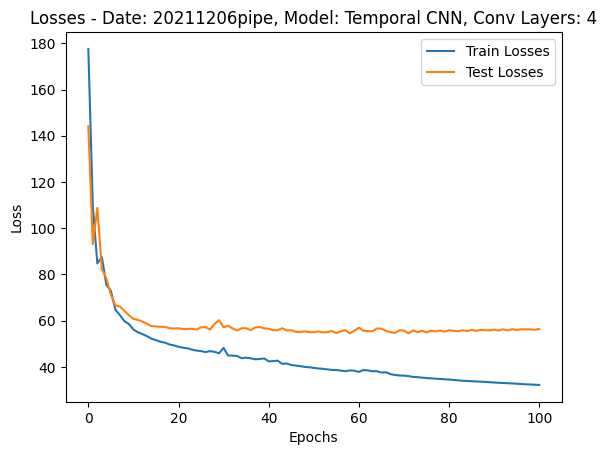

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211206pipe/TempCNN_20211206pipe_Joint Angles_4_convlayers_reluadded
20211203 25
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 499945
Epoch: 000, LR: 0.001000, Train Loss: 730.928326, Test Loss: 347.803619. Train R2: -0.2252645, Test R2: -0.2206294, Train pR2: -2.7979641, Test pR2: -2.8195052
Epoch: 050, LR: 0.001000, Train Loss: 144.194647, Test Loss: 180.739861. Train R2: 0.5180290, Test R2: 0.3741686, Train pR2: -2.2326846, Test pR2: -2.2669985
Epoch: 100, LR: 0.000262, Train Loss: 108.962859, Test Loss: 179.634705. Train R2: 0.6256600, Test R2: 0.3748135, Train pR2: -2.1513081, Test pR2: -2.2625067
Time to train model: 14.414791584014893


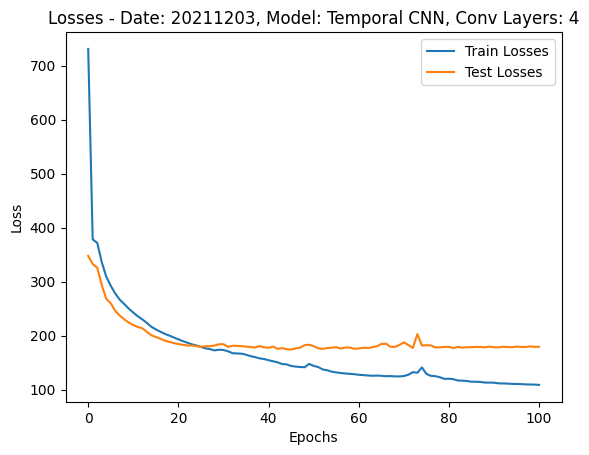

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211203/TempCNN_20211203_Joint Angles_4_convlayers_reluadded
20211119uc 84
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 522660
Epoch: 000, LR: 0.001000, Train Loss: 317.286130, Test Loss: 194.728630. Train R2: -0.6567766, Test R2: -0.6766789, Train pR2: -5.6382575, Test pR2: -5.5402398
Epoch: 050, LR: 0.000800, Train Loss: 137.065414, Test Loss: 147.655949. Train R2: -0.0940605, Test R2: -0.3055506, Train pR2: -6.7150683, Test pR2: -6.7765436
Epoch: 100, LR: 0.000262, Train Loss: 118.147621, Test Loss: 155.657715. Train R2: 0.0414850, Test R2: -0.3587634, Train pR2: -5.8747082, Test pR2: -6.0734282
Time to train model: 19.35276770591736


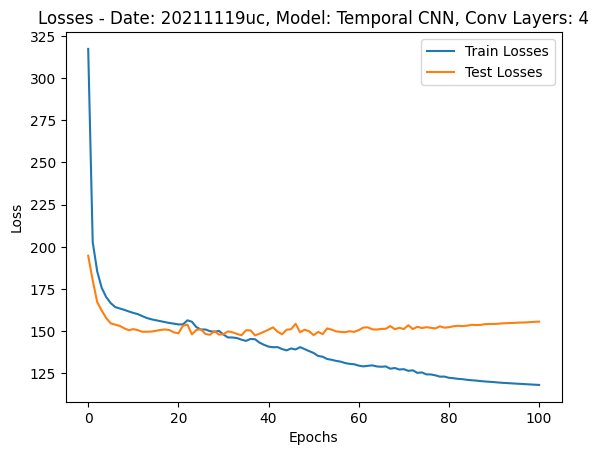

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211119uc/TempCNN_20211119uc_Joint Angles_4_convlayers_reluadded
20211119stick 83
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 522275
Epoch: 000, LR: 0.001000, Train Loss: 440.679590, Test Loss: 274.527290. Train R2: -0.4816393, Test R2: -0.4702793, Train pR2: -5.0231504, Test pR2: -4.9603028
Epoch: 050, LR: 0.000640, Train Loss: 159.903049, Test Loss: 198.279457. Train R2: 0.0896432, Test R2: -0.0733072, Train pR2: -3.3484423, Test pR2: -3.3905125
Epoch: 100, LR: 0.000168, Train Loss: 132.028888, Test Loss: 224.483444. Train R2: 0.2393492, Test R2: -0.1735109, Train pR2: -2.9725630, Test pR2: -3.1948841
Time to train model: 18.91989517211914


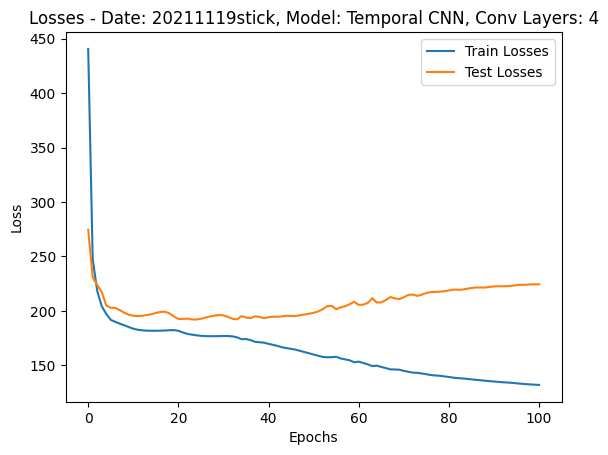

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211119stick/TempCNN_20211119stick_Joint Angles_4_convlayers_reluadded
20211116uc 80
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 521120
Epoch: 000, LR: 0.001000, Train Loss: 426.348846, Test Loss: 332.088226. Train R2: -1.2249440, Test R2: -1.2771544, Train pR2: -6.9622316, Test pR2: -6.4756050
Epoch: 050, LR: 0.000640, Train Loss: 106.125679, Test Loss: 166.525818. Train R2: 0.1763541, Test R2: -0.1418803, Train pR2: -3.7031028, Test pR2: -3.7193058
Epoch: 100, LR: 0.000168, Train Loss: 87.261014, Test Loss: 173.932266. Train R2: 0.2927437, Test R2: -0.1926668, Train pR2: -2.6403093, Test pR2: -2.9185615
Time to train model: 10.115835428237915


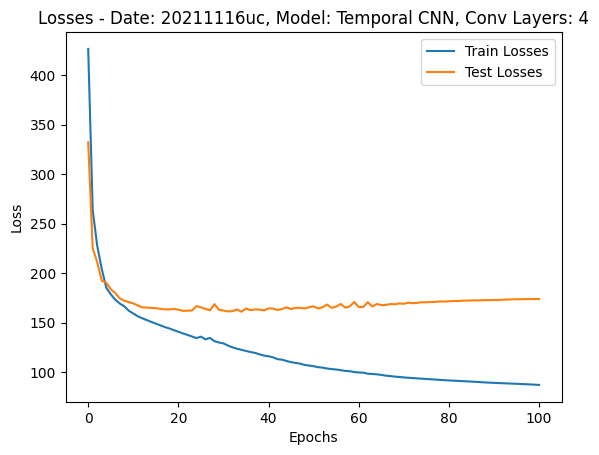

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211116uc/TempCNN_20211116uc_Joint Angles_4_convlayers_reluadded
20211116stick 95
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 526895
Epoch: 000, LR: 0.001000, Train Loss: 377.039798, Test Loss: 247.410950. Train R2: -0.4042883, Test R2: -0.3936220, Train pR2: -3.7343073, Test pR2: -3.7233219
Epoch: 050, LR: 0.001000, Train Loss: 104.539893, Test Loss: 131.894824. Train R2: 0.4368568, Test R2: 0.2584795, Train pR2: -0.9542430, Test pR2: -1.0818686
Epoch: 100, LR: 0.000328, Train Loss: 84.893749, Test Loss: 137.374095. Train R2: 0.5340972, Test R2: 0.2258172, Train pR2: -0.5175143, Test pR2: -0.7983154
Time to train model: 41.15058708190918


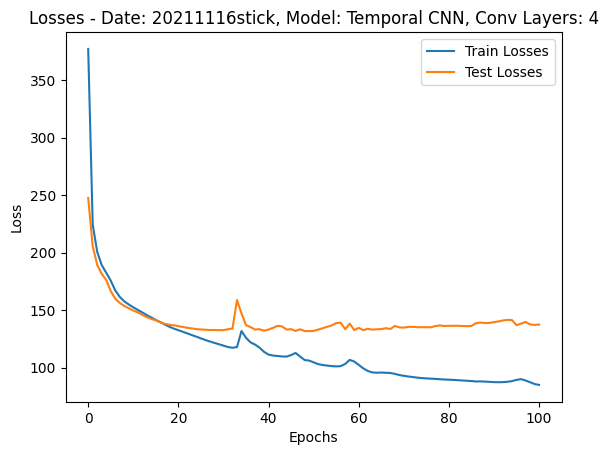

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20211116stick/TempCNN_20211116stick_Joint Angles_4_convlayers_reluadded
20210928 84
MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 522660
Epoch: 000, LR: 0.001000, Train Loss: 305.699141, Test Loss: 223.474421. Train R2: -0.3464043, Test R2: -0.4018713, Train pR2: -4.4588904, Test pR2: -4.5466166
Epoch: 050, LR: 0.000800, Train Loss: 101.513908, Test Loss: 122.433286. Train R2: 0.3448157, Test R2: 0.2019568, Train pR2: -2.2125821, Test pR2: -2.3038700
Epoch: 100, LR: 0.000410, Train Loss: 85.572355, Test Loss: 121.307376. Train R2: 0.4486431, Test R2: 0.2071498, Train pR2: -1.3109127, Test pR2: -1.5319152
Time to train model: 38.040992736816406


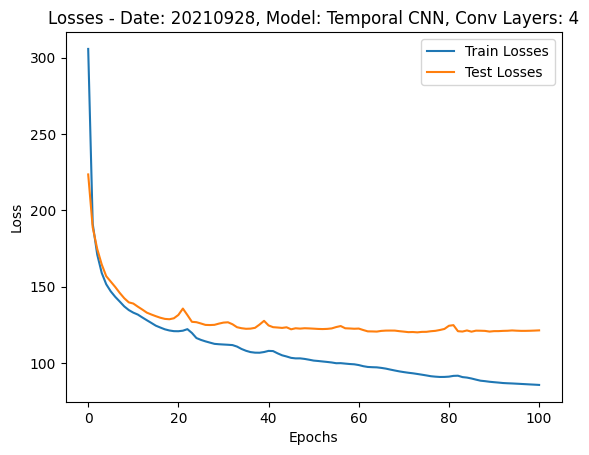

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20210928/TempCNN_20210928_Joint Angles_4_convlayers_reluadded


In [13]:
tcn_models_dict = {}
for date in new_dates_list:
    print(date, tcn_dataset_dict[date]['Joint Angles']['Full'].num_neural_units)
    dataset = tcn_dataset_dict[date]['Joint Angles']['Full']
    train_loader = tcn_loader_dict[date]['Joint Angles']['Train']
    test_loader = tcn_loader_dict[date]['Joint Angles']['Test']
    learning_rate = 0.001
    num_conv_layers = 4
    tcn = visualization.plot_losses_TempCNN(dataset, train_loader, test_loader, learning_rate, num_conv_layers, save = True, numepochs = 101)
    tcn_models_dict[date] = tcn

Temporal CNN, full dataset
Num Conv Layers: 1, Kernel Size: 10, Total Parameters: 16272
Epoch: 000, LR: 0.001000, Train Loss: 473.480927, Test Loss: 330.011078. Train R2: -2.6767390, Test R2: -2.5257066, Train pR2: -34.6014671, Test pR2: -34.0917816
Epoch: 050, LR: 0.001000, Train Loss: 70.952621, Test Loss: 67.880142. Train R2: 0.3616597, Test R2: 0.2973665, Train pR2: -0.5060584, Test pR2: -0.5538495
Epoch: 100, LR: 0.001000, Train Loss: 63.372069, Test Loss: 63.155840. Train R2: 0.4276998, Test R2: 0.3444295, Train pR2: -0.1237914, Test pR2: -0.1873362
Epoch: 150, LR: 0.001000, Train Loss: 60.486514, Test Loss: 61.712009. Train R2: 0.4526731, Test R2: 0.3579651, Train pR2: 0.0166148, Test pR2: -0.0538651
Epoch: 200, LR: 0.000800, Train Loss: 58.611944, Test Loss: 61.153841. Train R2: 0.4687648, Test R2: 0.3631401, Train pR2: 0.0354677, Test pR2: -0.0383999
Epoch: 250, LR: 0.000410, Train Loss: 57.712930, Test Loss: 61.081226. Train R2: 0.4760843, Test R2: 0.3637909, Train pR2: 0.042

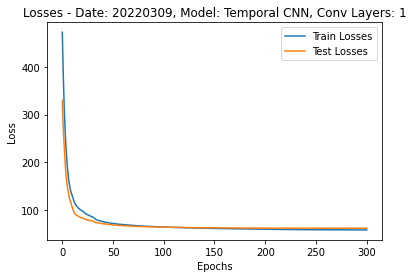

In [ ]:
cnn_1convlayers_add_relu_kern10 = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 1, kernel_size = 10, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

MSELoss()
Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 460.509412, Test Loss: 335.856796. Train R2: -2.1352796, Test R2: -2.0871118, Train pR2: -32.0694618, Test pR2: -34.8289413
Epoch: 050, LR: 0.001000, Train Loss: 67.436250, Test Loss: 67.988867. Train R2: 0.4011900, Test R2: 0.3231046, Train pR2: -0.3945335, Test pR2: -0.4522693
Epoch: 100, LR: 0.000640, Train Loss: 53.462050, Test Loss: 65.437216. Train R2: 0.4533780, Test R2: 0.3372532, Train pR2: -0.0503046, Test pR2: -0.1737416
Epoch: 150, LR: 0.000328, Train Loss: 50.812725, Test Loss: 65.185493. Train R2: 0.4699697, Test R2: 0.3361076, Train pR2: -0.0286781, Test pR2: -0.1745539
Epoch: 200, LR: 0.000168, Train Loss: 49.026865, Test Loss: 64.906404. Train R2: 0.4824145, Test R2: 0.3352745, Train pR2: -0.0126022, Test pR2: -0.1729275
Epoch: 250, LR: 0.000055, Train Loss: 48.387986, Test Loss: 64.921276. Train R2: 0.4868882, Test R2: 0.3341133, Trai

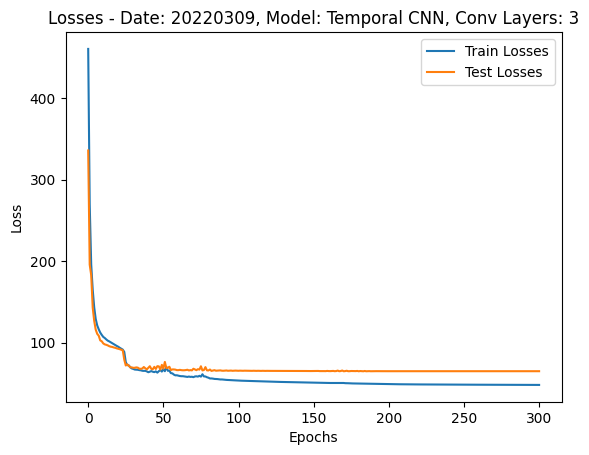

/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/Standard/NonSplit/instance_length_100/fullyrestrained/mse_loss/20220309/TempCNN_20220309_Joint Angles_3_convlayers_reluadded


In [43]:
cnn_1convlayers_add_relu = visualization.plot_losses_TempCNN(tcn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 3, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 1, Kernel Size: 5, Total Parameters: 10512
Epoch: 000, LR: 0.001000, Train Loss: 511.679645, Test Loss: 370.887924. Train R2: -3.2089684, Test R2: -3.0162888, Train pR2: -54.4559326, Test pR2: -50.4534035
Epoch: 050, LR: 0.001000, Train Loss: 73.562645, Test Loss: 69.613548. Train R2: 0.3376678, Test R2: 0.2833317, Train pR2: -0.5466101, Test pR2: -0.5795743
Epoch: 100, LR: 0.001000, Train Loss: 66.806399, Test Loss: 64.893030. Train R2: 0.3975108, Test R2: 0.3242850, Train pR2: -0.0941686, Test pR2: -0.1421532
Epoch: 150, LR: 0.001000, Train Loss: 64.243445, Test Loss: 63.689835. Train R2: 0.4198960, Test R2: 0.3357278, Train pR2: -0.0214693, Test pR2: -0.0891427
Epoch: 200, LR: 0.001000, Train Loss: 62.721686, Test Loss: 63.131390. Train R2: 0.4333471, Test R2: 0.3417325, Train pR2: 0.0071010, Test pR2: -0.0679829
Epoch: 250, LR: 0.000800, Train Loss: 61.590413, Test Loss: 62.903959. Train R2: 0.4430176, Test R2: 0.3449414, Train pR2: 0.028

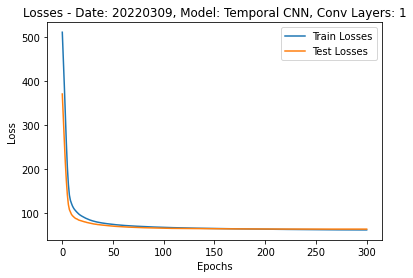

In [ ]:
cnn_1convlayers_add_relu = visualization.plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 1, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Learning Rate: 0.001


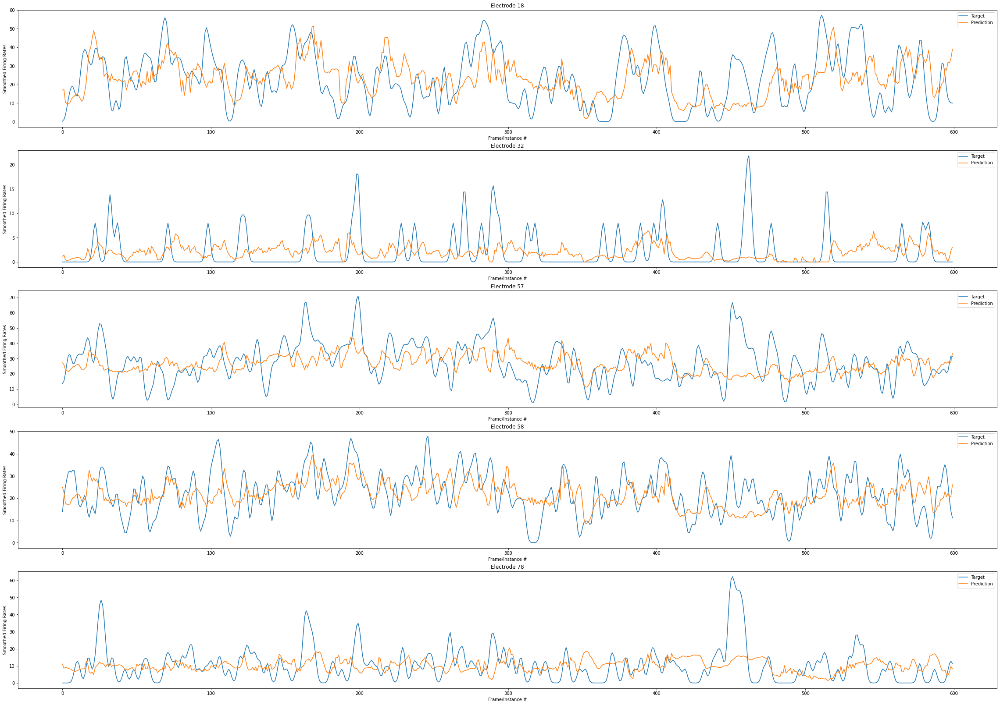

In [ ]:
plot_targets_and_preds_cnn(cnn_1convlayers_add_relu, good_input_20220309, good_output_frates_20220309)

Temporal CNN, full dataset
Num Conv Layers: 2, Kernel Size: 5, Total Parameters: 38256
Epoch: 000, LR: 0.001000, Train Loss: 431.846753, Test Loss: 250.181686. Train R2: -1.8513209, Test R2: -1.7075494, Train pR2: -16.2684917, Test pR2: -16.5530262
Epoch: 050, LR: 0.001000, Train Loss: 65.531921, Test Loss: 63.885281. Train R2: 0.4107958, Test R2: 0.3354343, Train pR2: -0.7579196, Test pR2: -0.8307348
Epoch: 100, LR: 0.000410, Train Loss: 61.304050, Test Loss: 63.654272. Train R2: 0.4455370, Test R2: 0.3430601, Train pR2: -0.6177249, Test pR2: -0.7164171
Epoch: 150, LR: 0.000107, Train Loss: 60.247634, Test Loss: 63.530247. Train R2: 0.4540917, Test R2: 0.3435505, Train pR2: -0.6083974, Test pR2: -0.7170670
Epoch: 200, LR: 0.000050, Train Loss: 59.912757, Test Loss: 63.499043. Train R2: 0.4568798, Test R2: 0.3434700, Train pR2: -0.6062565, Test pR2: -0.7164057
Epoch: 250, LR: 0.000050, Train Loss: 59.671474, Test Loss: 63.472895. Train R2: 0.4589804, Test R2: 0.3435263, Train pR2: -0.6

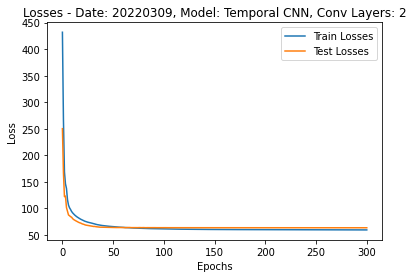

In [ ]:
cnn_2convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 2, kernel_size = 5, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

Learning Rate: 0.001


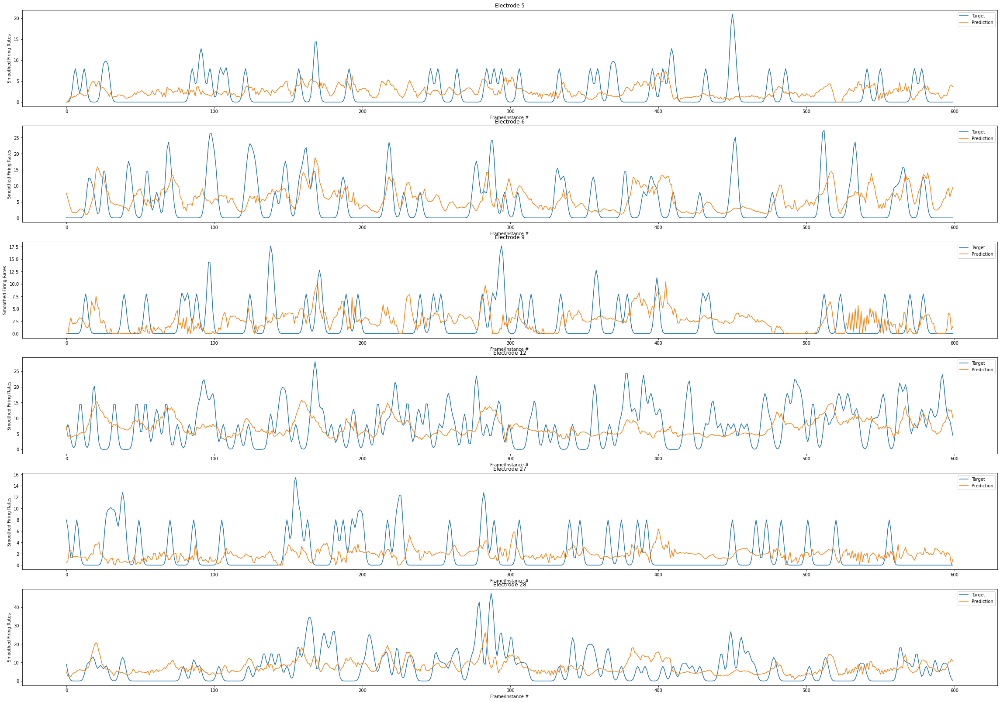

In [ ]:
plot_targets_and_preds_cnn(cnn_2convlayers_add_relu, good_inputs_dict['20220309'], good_frates_dict['20220309'], [5,6,9,12,27,28])

Temporal CNN, full dataset
Num Conv Layers: 2, Kernel Size: 5, Total Parameters: 38256
Epoch: 000, LR: 0.001000, Train Loss: 506.411340, Test Loss: 335.495178. Train R2: -2.7087829, Test R2: -2.5691185, Train pR2: -50.6254883, Test pR2: -53.0216560
Epoch: 050, LR: 0.001000, Train Loss: 65.095801, Test Loss: 63.872854. Train R2: 0.4142702, Test R2: 0.3214469, Train pR2: -0.1774634, Test pR2: -0.2219820
Epoch: 100, LR: 0.000640, Train Loss: 59.841807, Test Loss: 63.371468. Train R2: 0.4583964, Test R2: 0.3319379, Train pR2: -0.1037683, Test pR2: -0.1729261
Epoch: 150, LR: 0.000168, Train Loss: 58.447457, Test Loss: 63.736574. Train R2: 0.4697010, Test R2: 0.3335406, Train pR2: -0.0912166, Test pR2: -0.1670119
Epoch: 200, LR: 0.000055, Train Loss: 58.076067, Test Loss: 63.719120. Train R2: 0.4727366, Test R2: 0.3350745, Train pR2: -0.0878936, Test pR2: -0.1642843
Epoch: 250, LR: 0.000050, Train Loss: 57.898431, Test Loss: 63.737436. Train R2: 0.4742662, Test R2: 0.3356722, Train pR2: -0.0

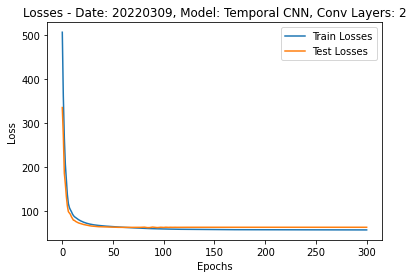

In [ ]:
cnn_2convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 2, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 478.472357, Test Loss: 330.654648. Train R2: -2.0780047, Test R2: -2.1479053, Train pR2: -11.7844229, Test pR2: -10.7966928
Epoch: 050, LR: 0.001000, Train Loss: 65.978582, Test Loss: 63.611668. Train R2: 0.4092494, Test R2: 0.3415115, Train pR2: -0.4421898, Test pR2: -0.4485811
Epoch: 100, LR: 0.000800, Train Loss: 62.260593, Test Loss: 66.602310. Train R2: 0.4270913, Test R2: 0.3174387, Train pR2: -0.4074554, Test pR2: -0.4382409
Epoch: 150, LR: 0.000410, Train Loss: 55.742218, Test Loss: 60.574186. Train R2: 0.4928074, Test R2: 0.3721431, Train pR2: -0.2612445, Test pR2: -0.3196973
Epoch: 200, LR: 0.000134, Train Loss: 54.649102, Test Loss: 60.190964. Train R2: 0.5019186, Test R2: 0.3760140, Train pR2: -0.2563550, Test pR2: -0.3239667
Epoch: 250, LR: 0.000134, Train Loss: 54.025748, Test Loss: 60.098003. Train R2: 0.5073843, Test R2: 0.3760407, Train pR2: -0.

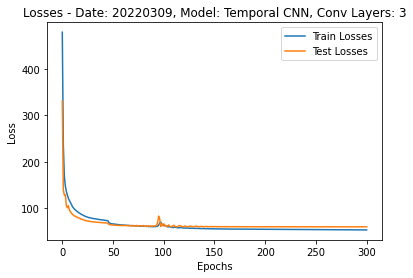

In [ ]:
cnn_3convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 3, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 139824
Epoch: 000, LR: 0.001000, Train Loss: 495.350629, Test Loss: 276.729607. Train R2: -1.9476766, Test R2: -1.9089566, Train pR2: -19.3580627, Test pR2: -19.4371433
Epoch: 050, LR: 0.000800, Train Loss: 66.091712, Test Loss: 69.076733. Train R2: 0.3964811, Test R2: 0.2867250, Train pR2: -0.9495503, Test pR2: -0.9374443
Epoch: 100, LR: 0.000410, Train Loss: 61.108868, Test Loss: 66.240410. Train R2: 0.4452520, Test R2: 0.3115854, Train pR2: -0.9172540, Test pR2: -0.9286649
Epoch: 150, LR: 0.000107, Train Loss: 59.627043, Test Loss: 66.005726. Train R2: 0.4574548, Test R2: 0.3134513, Train pR2: -0.9105907, Test pR2: -0.9309723
Epoch: 200, LR: 0.000050, Train Loss: 59.170590, Test Loss: 65.930967. Train R2: 0.4613505, Test R2: 0.3137410, Train pR2: -0.9082183, Test pR2: -0.9310710
Epoch: 250, LR: 0.000050, Train Loss: 58.816711, Test Loss: 65.898956. Train R2: 0.4644926, Test R2: 0.3137425, Train pR2: -0.

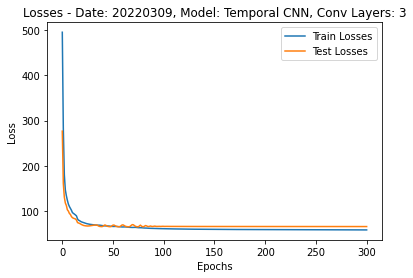

In [ ]:
cnn_3convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 3, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Learning Rate: 0.001


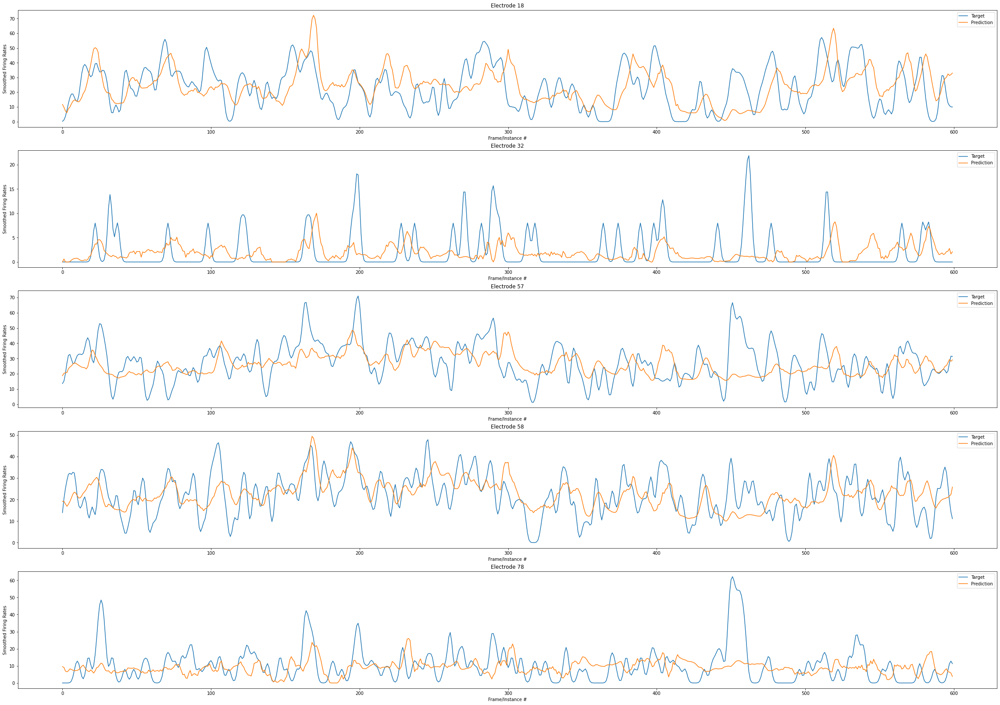

In [ ]:
plot_targets_and_preds_cnn(cnn_3convlayers_add_relu, good_input_20220309, good_output_frates_20220309)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 432.985638, Test Loss: 221.794495. Train R2: -1.0576005, Test R2: -1.1546711, Train pR2: -9.9175053, Test pR2: -9.4446802
Epoch: 050, LR: 0.001000, Train Loss: 64.925034, Test Loss: 64.973778. Train R2: 0.4314032, Test R2: 0.3147358, Train pR2: -2.3665485, Test pR2: -2.2408946
Epoch: 100, LR: 0.000800, Train Loss: 58.503857, Test Loss: 69.450912. Train R2: 0.4339539, Test R2: 0.2601434, Train pR2: -2.2057078, Test pR2: -2.1220546
Epoch: 150, LR: 0.000640, Train Loss: 54.701946, Test Loss: 61.106194. Train R2: 0.5010856, Test R2: 0.3537488, Train pR2: -2.1674373, Test pR2: -2.0946293
Epoch: 200, LR: 0.000210, Train Loss: 51.637572, Test Loss: 61.091234. Train R2: 0.5285785, Test R2: 0.3506920, Train pR2: -2.1406519, Test pR2: -2.0848401
Epoch: 250, LR: 0.000055, Train Loss: 51.065128, Test Loss: 61.097128. Train R2: 0.5333584, Test R2: 0.3502395, Train pR2: -2.13

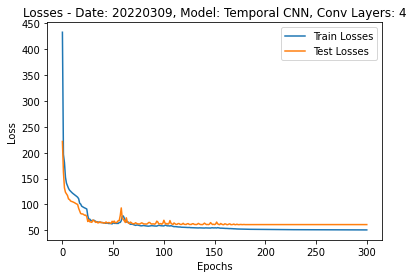

In [ ]:
cnn_4convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 527280
Epoch: 000, LR: 0.001000, Train Loss: 444.881415, Test Loss: 217.635399. Train R2: -1.1054984, Test R2: -1.1764024, Train pR2: -7.5638251, Test pR2: -7.0623336
Epoch: 050, LR: 0.000800, Train Loss: 77.041263, Test Loss: 76.864193. Train R2: 0.3037193, Test R2: 0.1974812, Train pR2: -3.1223915, Test pR2: -2.7083881
Epoch: 100, LR: 0.000512, Train Loss: 74.664151, Test Loss: 84.525658. Train R2: 0.2997457, Test R2: 0.1315071, Train pR2: -2.9226217, Test pR2: -2.5534487
Epoch: 150, LR: 0.000134, Train Loss: 68.604710, Test Loss: 76.567043. Train R2: 0.3806739, Test R2: 0.2113102, Train pR2: -2.7858932, Test pR2: -2.4427421
Epoch: 200, LR: 0.000050, Train Loss: 67.711893, Test Loss: 76.209057. Train R2: 0.3885010, Test R2: 0.2133676, Train pR2: -2.6255729, Test pR2: -2.3245916
Epoch: 250, LR: 0.000050, Train Loss: 67.272741, Test Loss: 76.034943. Train R2: 0.3923989, Test R2: 0.2143279, Train pR2: -2.60

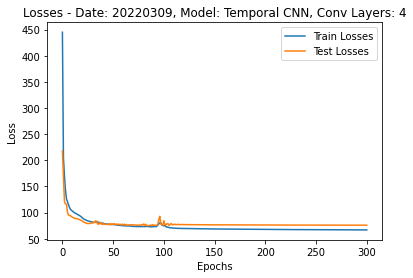

In [ ]:
cnn_4convlayers_add_relu = plot_losses_TempCNN(tcnn_dataset_dict['20220309']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20220309']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Learning Rate: 0.001


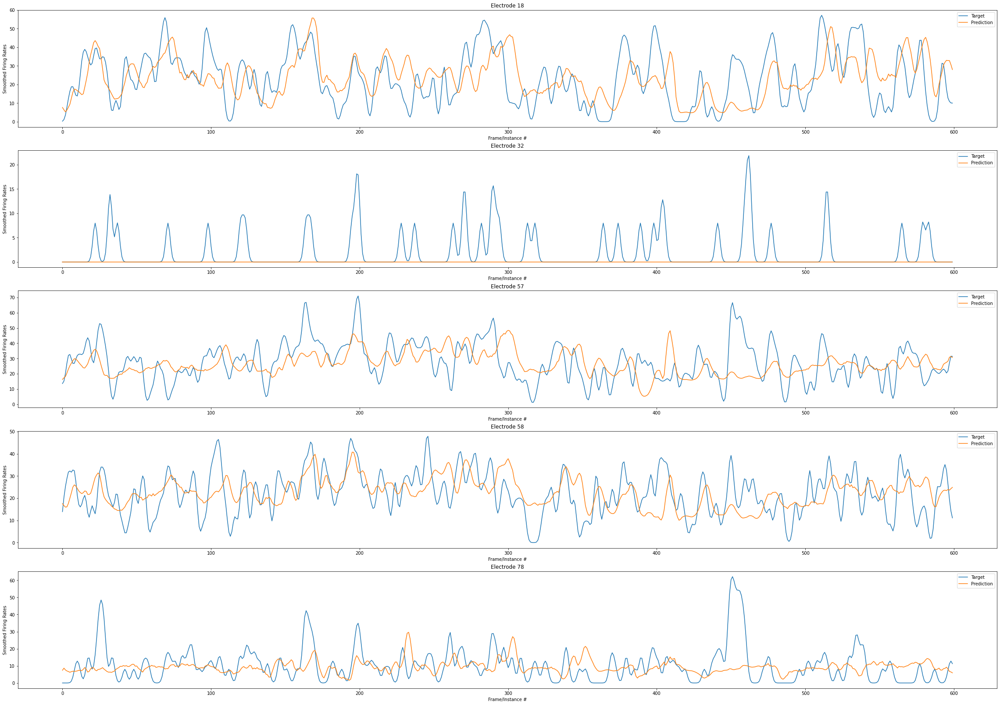

In [ ]:
plot_targets_and_preds_cnn(cnn_4convlayers_add_relu, good_input_20220309, good_output_frates_20220309)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 148702
Epoch: 000, LR: 0.001000, Train Loss: 378.127770, Test Loss: 243.994787. Train R2: -0.5890072, Test R2: -0.6338117, Train pR2: -8.2242403, Test pR2: -8.9511700
Epoch: 050, LR: 0.001000, Train Loss: 91.798198, Test Loss: 92.625608. Train R2: 0.3980986, Test R2: 0.3710630, Train pR2: -1.2773304, Test pR2: -1.3729814
Epoch: 100, LR: 0.001000, Train Loss: 81.021539, Test Loss: 86.108495. Train R2: 0.4667934, Test R2: 0.4158304, Train pR2: -0.5360736, Test pR2: -0.5939946
Epoch: 150, LR: 0.000640, Train Loss: 76.005186, Test Loss: 84.242755. Train R2: 0.4974404, Test R2: 0.4280301, Train pR2: -0.4335852, Test pR2: -0.5273790
Epoch: 200, LR: 0.000328, Train Loss: 73.358569, Test Loss: 83.978973. Train R2: 0.5145228, Test R2: 0.4310113, Train pR2: -0.4150432, Test pR2: -0.5296673
Epoch: 250, LR: 0.000107, Train Loss: 72.140033, Test Loss: 83.780355. Train R2: 0.5220089, Test R2: 0.4325330, Train pR2: -0.40

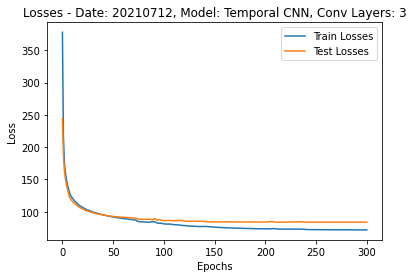

In [ ]:
cnn_3convlayers_add_relu_0712 = plot_losses_TempCNN(tcnn_dataset_dict['20210712']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Test'], \
                                               0.001, 3, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 3, Kernel Size: 5, Total Parameters: 148702
Epoch: 000, LR: 0.001000, Train Loss: 398.740606, Test Loss: 227.135986. Train R2: -0.5019756, Test R2: -0.5425511, Train pR2: -6.0620718, Test pR2: -6.2092528
Epoch: 050, LR: 0.001000, Train Loss: 93.352186, Test Loss: 95.687538. Train R2: 0.3871505, Test R2: 0.3519459, Train pR2: -1.2525817, Test pR2: -1.3891202
Epoch: 100, LR: 0.001000, Train Loss: 86.259125, Test Loss: 93.271777. Train R2: 0.4309585, Test R2: 0.3693618, Train pR2: -1.2289710, Test pR2: -1.4010350
Epoch: 150, LR: 0.000410, Train Loss: 82.223354, Test Loss: 92.275887. Train R2: 0.4573171, Test R2: 0.3797676, Train pR2: -1.2109796, Test pR2: -1.4008617
Epoch: 200, LR: 0.000134, Train Loss: 80.791235, Test Loss: 92.099281. Train R2: 0.4653979, Test R2: 0.3806839, Train pR2: -1.2018051, Test pR2: -1.3971807
Epoch: 250, LR: 0.000050, Train Loss: 80.226198, Test Loss: 91.923353. Train R2: 0.4682070, Test R2: 0.3815392, Train pR2: -1.20

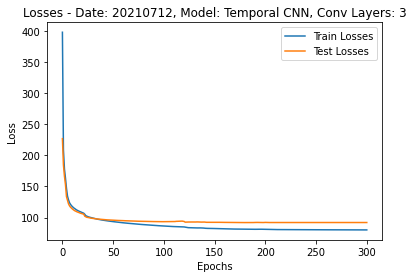

In [ ]:
cnn_3convlayers_add_relu_0712 = plot_losses_TempCNN(tcnn_dataset_dict['20210712']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Test'], \
                                               0.001, 3, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 544990
Epoch: 000, LR: 0.001000, Train Loss: 364.656301, Test Loss: 218.119512. Train R2: -0.4821027, Test R2: -0.4992952, Train pR2: -6.8613987, Test pR2: -7.1077433
Epoch: 050, LR: 0.001000, Train Loss: 86.553090, Test Loss: 90.999369. Train R2: 0.4283912, Test R2: 0.3823337, Train pR2: -0.7123906, Test pR2: -0.7738680
Epoch: 100, LR: 0.000640, Train Loss: 74.391152, Test Loss: 85.078349. Train R2: 0.5102845, Test R2: 0.4231700, Train pR2: -0.4787328, Test pR2: -0.5859018
Epoch: 150, LR: 0.000262, Train Loss: 69.171865, Test Loss: 86.517565. Train R2: 0.5329599, Test R2: 0.4148747, Train pR2: -0.3869489, Test pR2: -0.5564578
Epoch: 200, LR: 0.000107, Train Loss: 66.700291, Test Loss: 83.966235. Train R2: 0.5580728, Test R2: 0.4306197, Train pR2: -0.3353557, Test pR2: -0.5082390
Epoch: 250, LR: 0.000050, Train Loss: 65.997686, Test Loss: 84.036400. Train R2: 0.5622849, Test R2: 0.4300122, Train pR2: -0.33

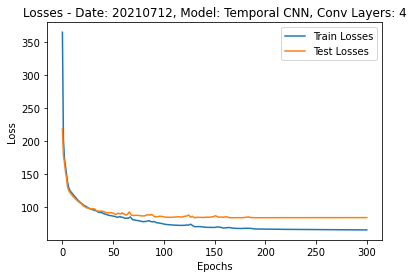

In [ ]:
cnn_4convlayers_add_relu_0712 = plot_losses_TempCNN(tcnn_dataset_dict['20210712']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = False, causal = False, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 544990
Epoch: 000, LR: 0.001000, Train Loss: 338.621175, Test Loss: 206.112233. Train R2: -0.3991320, Test R2: -0.4323410, Train pR2: -5.8630223, Test pR2: -5.9114056
Epoch: 050, LR: 0.001000, Train Loss: 87.825862, Test Loss: 92.564138. Train R2: 0.4224109, Test R2: 0.3722156, Train pR2: -1.2693399, Test pR2: -1.3536654
Epoch: 100, LR: 0.000800, Train Loss: 77.816047, Test Loss: 89.723005. Train R2: 0.4867994, Test R2: 0.3954025, Train pR2: -0.8700712, Test pR2: -0.9902067
Epoch: 150, LR: 0.000328, Train Loss: 70.951970, Test Loss: 88.106651. Train R2: 0.5307424, Test R2: 0.4072179, Train pR2: -0.8326313, Test pR2: -0.9811217
Epoch: 200, LR: 0.000086, Train Loss: 69.162183, Test Loss: 87.796801. Train R2: 0.5417591, Test R2: 0.4078873, Train pR2: -0.8295305, Test pR2: -0.9932386
Epoch: 250, LR: 0.000050, Train Loss: 68.591084, Test Loss: 87.990344. Train R2: 0.5453878, Test R2: 0.4065675, Train pR2: -0.82

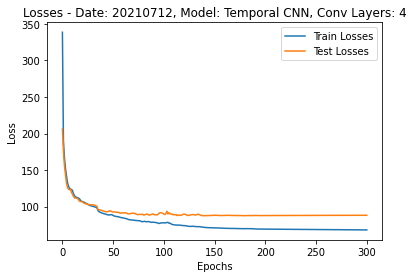

In [ ]:
cnn_4convlayers_add_relu_0712 = plot_losses_TempCNN(tcnn_dataset_dict['20210712']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210712']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = False, causal = True, numepochs = 301)

Learning Rate: 0.001


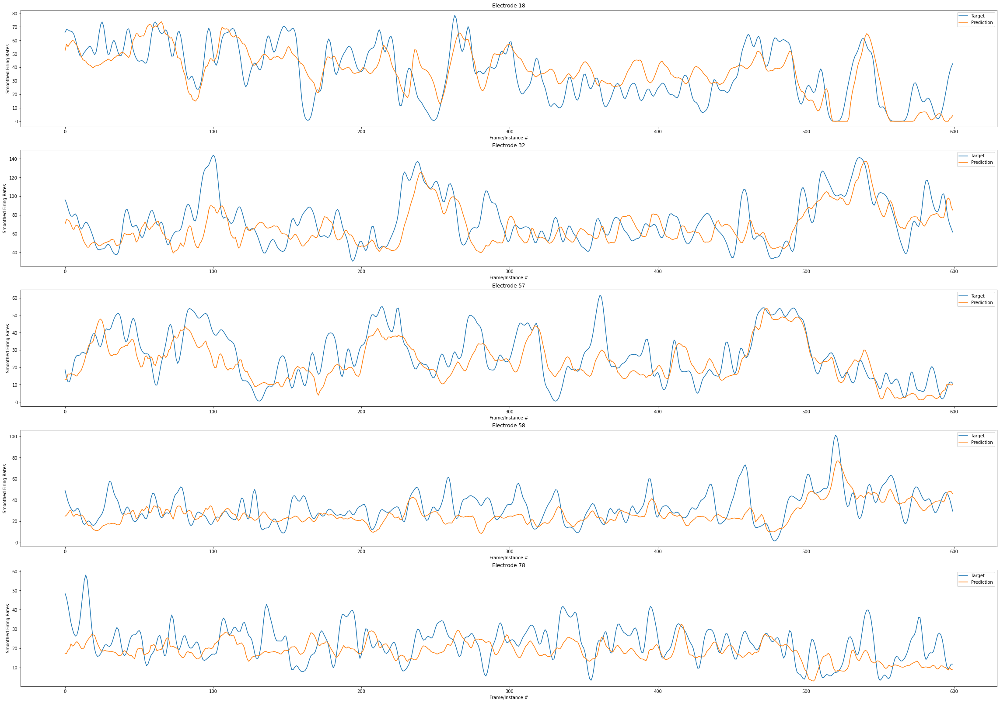

In [ ]:
plot_targets_and_preds_cnn(cnn_4convlayers_add_relu_0712, good_inputs_dict['20210712'], good_frates_dict['20210712'])

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 533825
Epoch: 000, LR: 0.001000, Train Loss: 231.014762, Test Loss: 144.320145. Train R2: -0.3209723, Test R2: -0.3105206, Train pR2: -5.2126031, Test pR2: -5.2654700
Epoch: 050, LR: 0.001000, Train Loss: 66.102612, Test Loss: 75.456164. Train R2: 0.4097437, Test R2: 0.3195619, Train pR2: -2.8172956, Test pR2: -2.9583688
Epoch: 100, LR: 0.000512, Train Loss: 56.468967, Test Loss: 75.023181. Train R2: 0.4918714, Test R2: 0.3393274, Train pR2: -2.4588604, Test pR2: -2.6160476
Epoch: 150, LR: 0.000134, Train Loss: 52.884048, Test Loss: 74.150487. Train R2: 0.5254266, Test R2: 0.3462760, Train pR2: -2.4349740, Test pR2: -2.6156278
Epoch: 200, LR: 0.000050, Train Loss: 51.546287, Test Loss: 74.061971. Train R2: 0.5367221, Test R2: 0.3474865, Train pR2: -2.1023786, Test pR2: -2.3076756
Epoch: 250, LR: 0.000050, Train Loss: 51.019562, Test Loss: 74.296145. Train R2: 0.5415197, Test R2: 0.3461531, Train pR2: -2.10

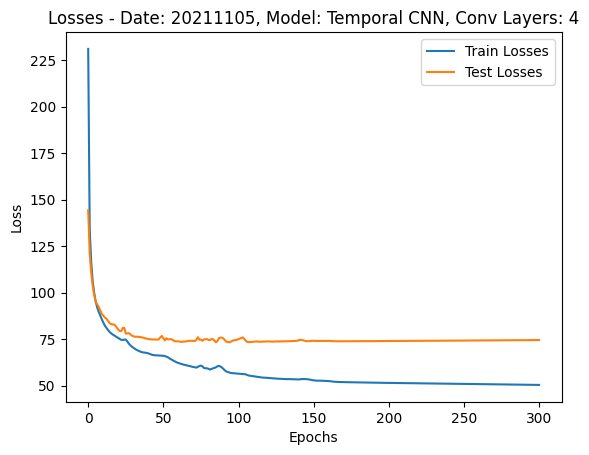

In [ ]:
cnn_4convlayers_add_relu_1105 = plot_losses_TempCNN(tcnn_dataset_dict['20211105']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20211105']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20211105']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = True, causal = True, numepochs = 301)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 546145
Epoch: 000, LR: 0.001000, Train Loss: 179.671035, Test Loss: 131.538860. Train R2: -0.0359867, Test R2: -0.0691145, Train pR2: -4.3238988, Test pR2: -4.6770649
Epoch: 050, LR: 0.001000, Train Loss: 53.442698, Test Loss: 64.245031. Train R2: 0.5579773, Test R2: 0.4726199, Train pR2: -1.2552764, Test pR2: -1.5194961
Epoch: 100, LR: 0.000512, Train Loss: 45.186299, Test Loss: 63.419777. Train R2: 0.6149220, Test R2: 0.4768054, Train pR2: -0.8702634, Test pR2: -1.2722515
Epoch: 150, LR: 0.000168, Train Loss: 42.021735, Test Loss: 63.025860. Train R2: 0.6413041, Test R2: 0.4785946, Train pR2: -0.5270172, Test pR2: -0.9376155
Time to train model: 368.22196888923645


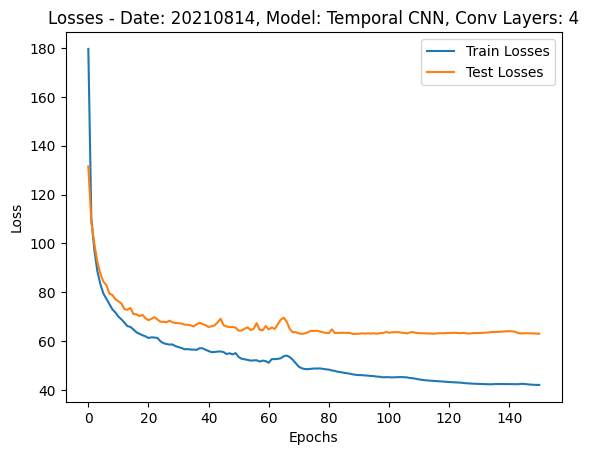

In [ ]:
cnn_4convlayers_add_relu_0814 = plot_losses_TempCNN(tcnn_dataset_dict['20210814']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210814']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210814']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = True, causal = True, numepochs = 151)

Temporal CNN, full dataset
Num Conv Layers: 4, Kernel Size: 5, Total Parameters: 549225
Epoch: 000, LR: 0.001000, Train Loss: 206.501375, Test Loss: 128.913078. Train R2: -0.1675113, Test R2: -0.1579681, Train pR2: -3.6186216, Test pR2: -3.6736248
Epoch: 050, LR: 0.001000, Train Loss: 70.588870, Test Loss: 77.623127. Train R2: 0.3690492, Test R2: 0.2818796, Train pR2: -0.6073860, Test pR2: -0.6962206
Epoch: 100, LR: 0.000512, Train Loss: 61.375939, Test Loss: 75.331532. Train R2: 0.4552893, Test R2: 0.2986779, Train pR2: -0.4358763, Test pR2: -0.6505479
Time to train model: 257.4573221206665


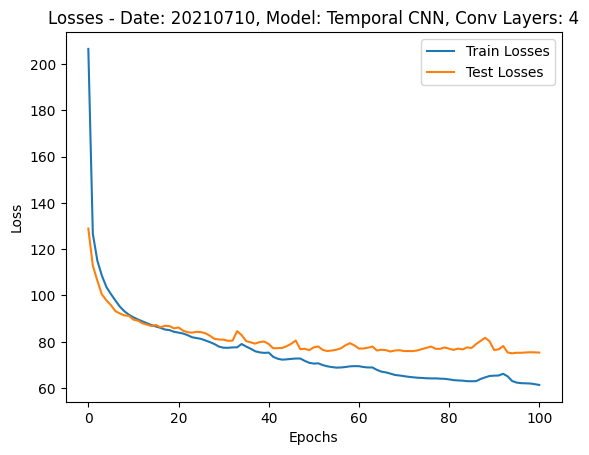

In [ ]:
cnn_4convlayers_add_relu_0710 = plot_losses_TempCNN(tcnn_dataset_dict['20210710']['Joint Angles']['Full'], \
                                               tcnn_loader_dict['20210710']['Joint Angles']['Train'], \
                                               tcnn_loader_dict['20210710']['Joint Angles']['Test'], \
                                               0.001, 4, add_relu = True, adapt_lr = True, \
                                               save = True, causal = True, numepochs = 101)

# Plotting Power Spectrums of Predictions

In [ ]:
cnn_4convlayers_add_relu = TempConvNet(24, 96, 4, 1, 5, 2, add_relu = True, causal=False)
cnn_4convlayers_add_relu.load_state_dict(torch.load('/content/drive/My Drive/Miller_Lab/FIU/Temporal_CNN/Pop_FR_OpenSIM/TempCNN_20220309_Joint Angles_4_convlayers_reluadded'))

<All keys matched successfully>

In [ ]:
def get_r2_by_electrode(target, pred):
    r2_list = []
    for i in range(len(target.shape[1])):
        r2_list.append(r2_score(target[:,i],pred[:,i]))
    return(r2_list)

In [ ]:
def get_psd(model, dataset, test_loader, nperseg, nrows=12, ncols=8):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    test_loss, test_R2, test_pr2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, dataset.num_neural_units, conv = True)

    f, ax = plt.subplots(nrows, ncols)
    f.subplots_adjust(top=0.97)
    f.set_size_inches(25, 25)
    for k in range(nrows*ncols):
        if k == 0:
            print(test_targets[:,k].shape)
        freq_targets, psd_targets = signal.welch(test_targets[:,k], fs=30, nperseg=nperseg)
        freq_targets, psd_targets = freq_targets[np.argsort(freq_targets)], psd_targets[np.argsort(freq_targets)]
        freq_preds, psd_preds = signal.welch(test_preds[:,k], fs=30, nperseg=nperseg)
        freq_preds, psd_preds = freq_preds[np.argsort(freq_preds)], psd_preds[np.argsort(freq_preds)]
        i = k-(int(k/ncols)*ncols)
        j = int(k/ncols)
        ax[j][i].plot(freq_targets,abs(psd_targets), label = 'Targets')
        ax[j][i].plot(freq_preds, abs(psd_preds), label = 'Predictions')
        ax[j][i].set_xlabel('Frequency')
        ax[j][i].set_ylabel('PSD')
        ax[j][i].set_title('Electrode {}'.format(k))
        ax[j][i].legend()
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_distributions_tcnn(model, dataset, test_loader, nrows=12, ncols=8, bins = 20):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    test_loss, test_R2, test_pr2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, dataset.num_neural_units, conv = True)

    f, ax = plt.subplots(nrows, ncols)
    f.subplots_adjust(top=0.97)
    f.set_size_inches(30, 35)
    pr2 = get_pr2(test_targets, test_preds, return_electrodes = True)
    for k in range(nrows*ncols):
        pr2_elec = round(pr2[k], 3)
        assert test_targets[:,k].shape == test_preds[:,k].shape
        r2 = round(r2_score(test_targets[:,k], test_preds[:,k]),3)
        # print('Electrode {} - Target Shape: {}, Pred Shape: {}'.format(k, test_targets[:,k].shape, test_preds[:,k].shape))
        i = k-(int(k/ncols)*ncols)
        j = int(k/ncols)
        ax[j][i].hist(test_targets[:,k], bins = bins, alpha = 0.4, label = 'Targets', density=False)
        ax[j][i].hist(test_preds[:,k], bins = bins, alpha = 0.4, label = 'Predictions', density=False)
        test_target_dist = np.histogram(test_targets[:,k], bins=bins, density=True)[0]
        test_pred_dist = np.histogram(test_preds[:,k], bins=bins, density=True)[0]
        # kld = calc_kld(test_target_dist, test_pred_dist)
        ax[j][i].set_xlabel('Firing Rate')
        ax[j][i].set_ylabel('Count')
        ax[j][i].set_title('Electrode {}\nR2: {}, pR2: {:.3f}'.format(k, r2, pr2_elec))
        ax[j][i].legend()
    plt.tight_layout()
    plt.show()

    return(test_target_dist, test_pred_dist)

In [ ]:
def plot_r2_tcnn(model, dataset, test_loader, bins = 20):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    test_loss, test_R2, test_pr2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, dataset.num_neural_units, conv = True)

    r2_elect = []
    for k in range(nrows*ncols):
        r2 = round(r2_score(test_targets[:,k], test_preds[:,k]),3)
        r2_elect.append(r2)
    plt.hist(r2_elect, bins = bins)
    plt.title('{} R^2 Test Distribution'.format(dataset.date))
    plt.show()

In [ ]:
def get_all_pr2(model, dataset, test_loader):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    test_loss, test_R2, test_pr2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, dataset.num_neural_units, conv = True)
    pr2 = get_pr2(test_targets, test_preds, return_electrodes = True)
    return(pr2)

(3500,)


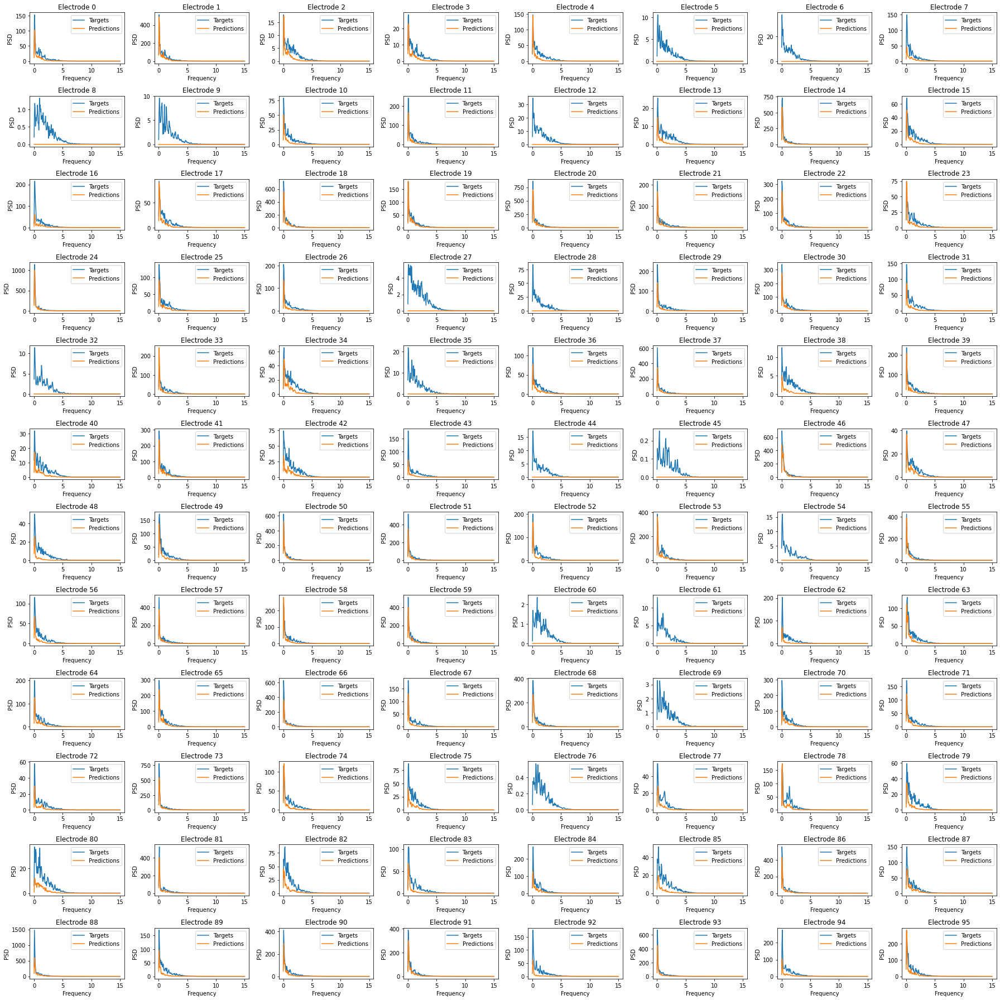

In [ ]:
get_psd(cnn_4convlayers_add_relu, tcnn_loader_dict['20220309']['Joint Angles']['Test'], 512)

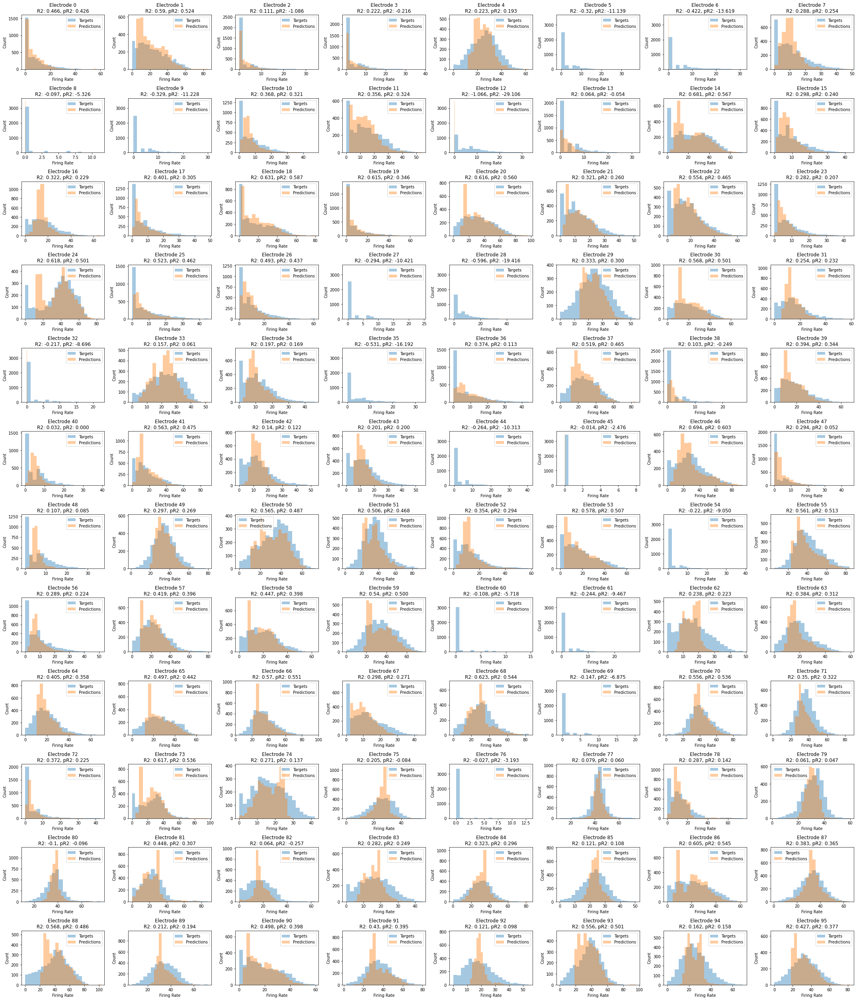

In [ ]:
test_target_dist, test_pred_dist = plot_distributions_tcnn(cnn_4convlayers_add_relu, tcnn_loader_dict['20220309']['Joint Angles']['Test'])

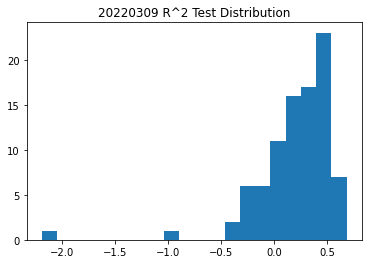

In [ ]:
plot_r2_tcnn(cnn_4convlayers_add_relu, tcnn_dataset_dict['20220309']['Joint Angles']['Full'], tcnn_loader_dict['20220309']['Joint Angles']['Test'])

In [ ]:
pr2_0309 = get_all_pr2(cnn_4convlayers_add_relu, tcnn_dataset_dict['20220309']['Joint Angles']['Full'], tcnn_loader_dict['20220309']['Joint Angles']['Test'])

In [ ]:
pr2_0309.shape

(96,)

In [ ]:
# pr2_glm = np.genfromtxt('20220309_GLM_pr2.csv',delimiter=',')
pr2_glm = np.array([0.220289776005016,0.215290334442639,0.120273504239680,0.118095844359804,0.126311606298404,0.0376392757407360,0.0837213218934339,0.0913996489086612,0.0199530499690461,0.0471979149985807,0.142693260760032,0.158977774653867,0.0683001889329097,0.0938343402991066,0.307791984310851,0.136763780106305,0.0845116341539655,0.173063465369165,0.254307225134326,0.215726418616133,0.238356205385482,0.199320011051728,0.270815062278090,0.115406457543200,0.296276262759554,0.168489411334023,0.128387349924716,0.0285003118106349,0.0737763352663492,0.117279754437415,0.142287506010046,0.0924601174975876,0.0982554650684041,0.203829562812001,0.0958476996753403,0.0764657508728965,0.113891051602939,0.215181035566561,0.0696371954211829,0.141102518230887,0.0339050165300817,0.176885597371307,0.0425762823624038,0.105159297108558,0.119044845724916,0.0119520983607525,0.380456346490134,0.124241931306150,0.0697417765388065,0.223847554069006,0.207429593554669,0.263379564099154,0.141767056668114,0.221265361922507,0.0906827232597173,0.250093848412323,0.102305660960078,0.188437110672330,0.165988305042146,0.198701614497570,0.0543742385828591,0.0799113362740269,0.107041976579518,0.171832968026976,0.178265836262604,0.208426837941961,0.360748420567329,0.106476575005904,0.247143923452165,0.0540410251308774,0.182474996922431,0.162358867359291,0.0866483080041624,0.319336201029341,0.177976861721272,0.0666692263747690,0.0528556399214800,0.0742839450553133,0.153331579950776,0.0517351750022609,0.0474691535172057,0.263938326389907,0.0689264081953318,0.216553341912978,0.171011588834646,0.0635997375456877,0.167330580567784,0.143769725158512,0.243722081733718,0.128025162792669,0.144052984125223,0.255902843687994,0.0529687812587969,0.222478185874562,0.0718352260310495,0.135202069150567])

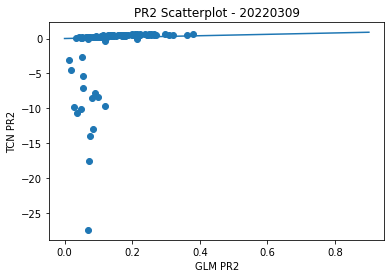

In [ ]:
inds = np.where(pr2_0309>0)
plt.scatter(pr2_glm[:],pr2_0309[:])
plt.plot(np.arange(0,1,0.1),np.arange(0,1,0.1))
plt.xlabel('GLM PR2')
plt.ylabel('TCN PR2')
plt.title('PR2 Scatterplot - 20220309')
plt.show()

(7100,)


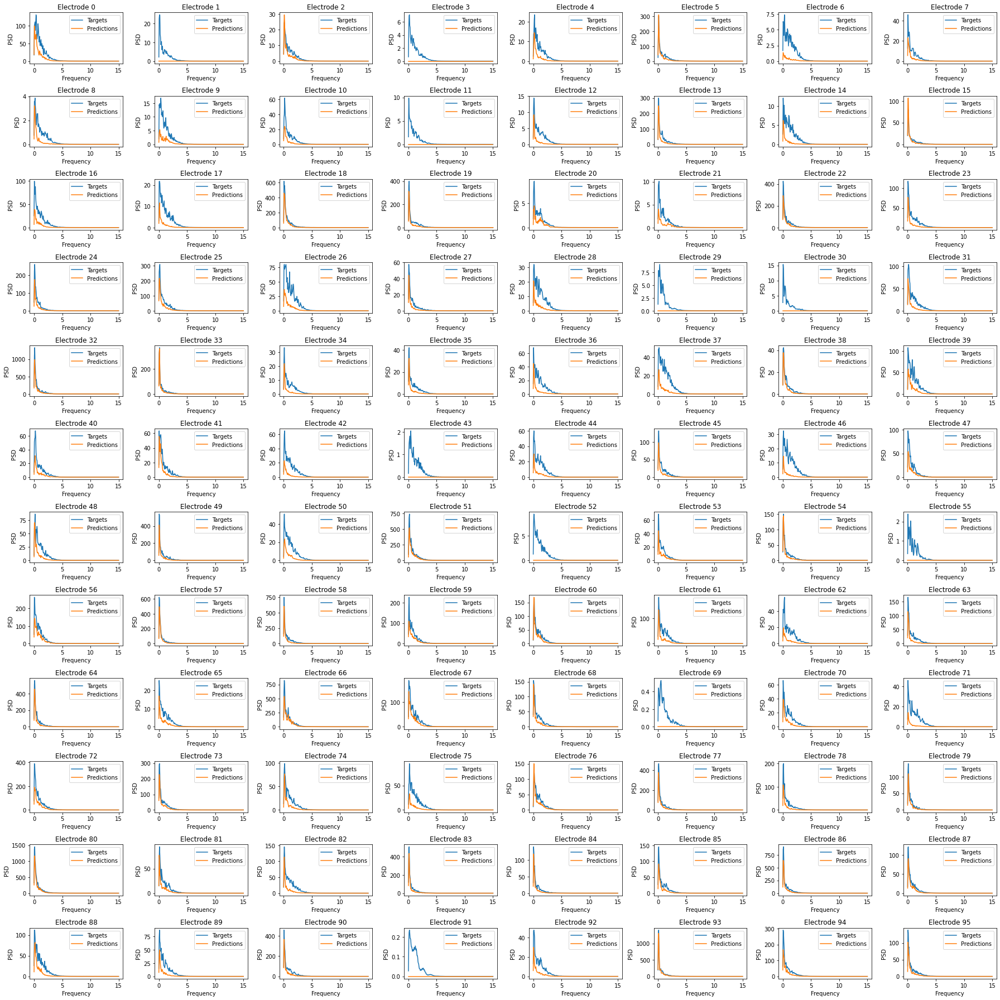

In [ ]:
get_psd(cnn_4convlayers_add_relu_0712, tcnn_dataset_dict['20210712']['Joint Angles']['Full'],tcnn_loader_dict['20210712']['Joint Angles']['Test'], 512)

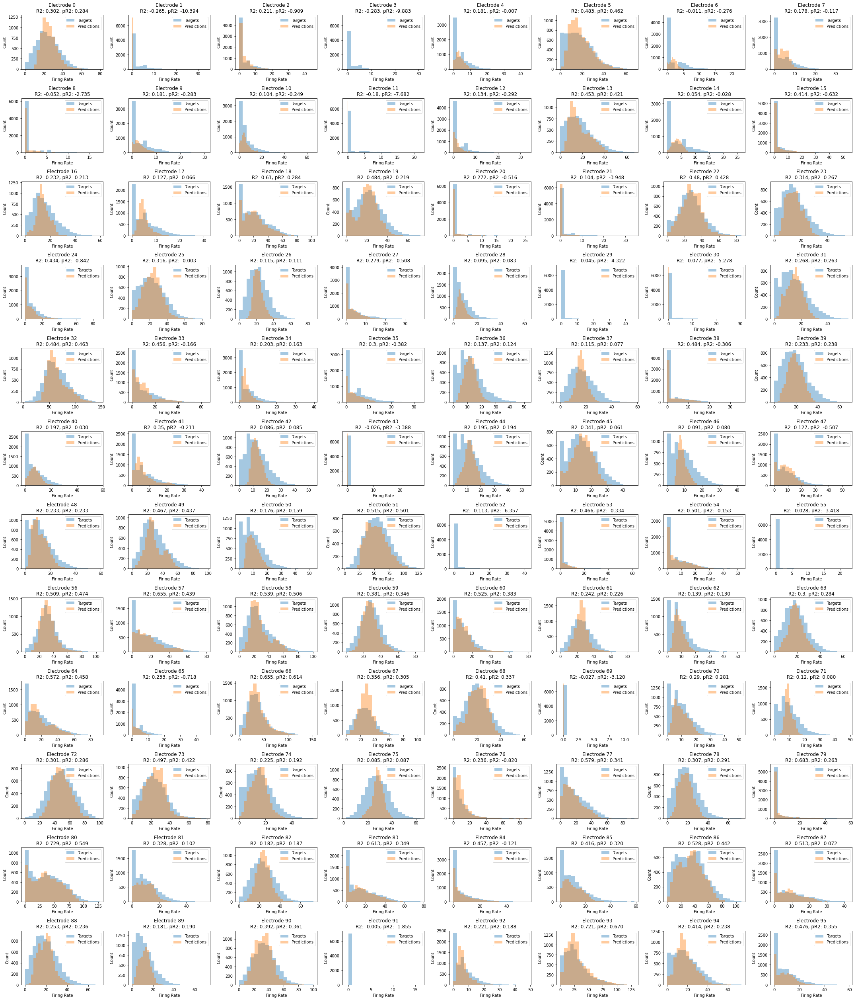

In [ ]:
test_target_dist, test_pred_dist = plot_distributions_tcnn(cnn_4convlayers_add_relu_0712, tcnn_dataset_dict['20210712']['Joint Angles']['Full'], tcnn_loader_dict['20210712']['Joint Angles']['Test'])

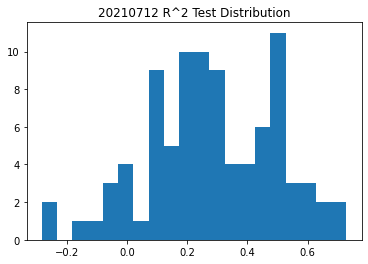

In [ ]:
plot_r2_tcnn(cnn_4convlayers_add_relu_0712, tcnn_dataset_dict['20210712']['Joint Angles']['Full'], tcnn_loader_dict['20210712']['Joint Angles']['Test'])

(3500,)


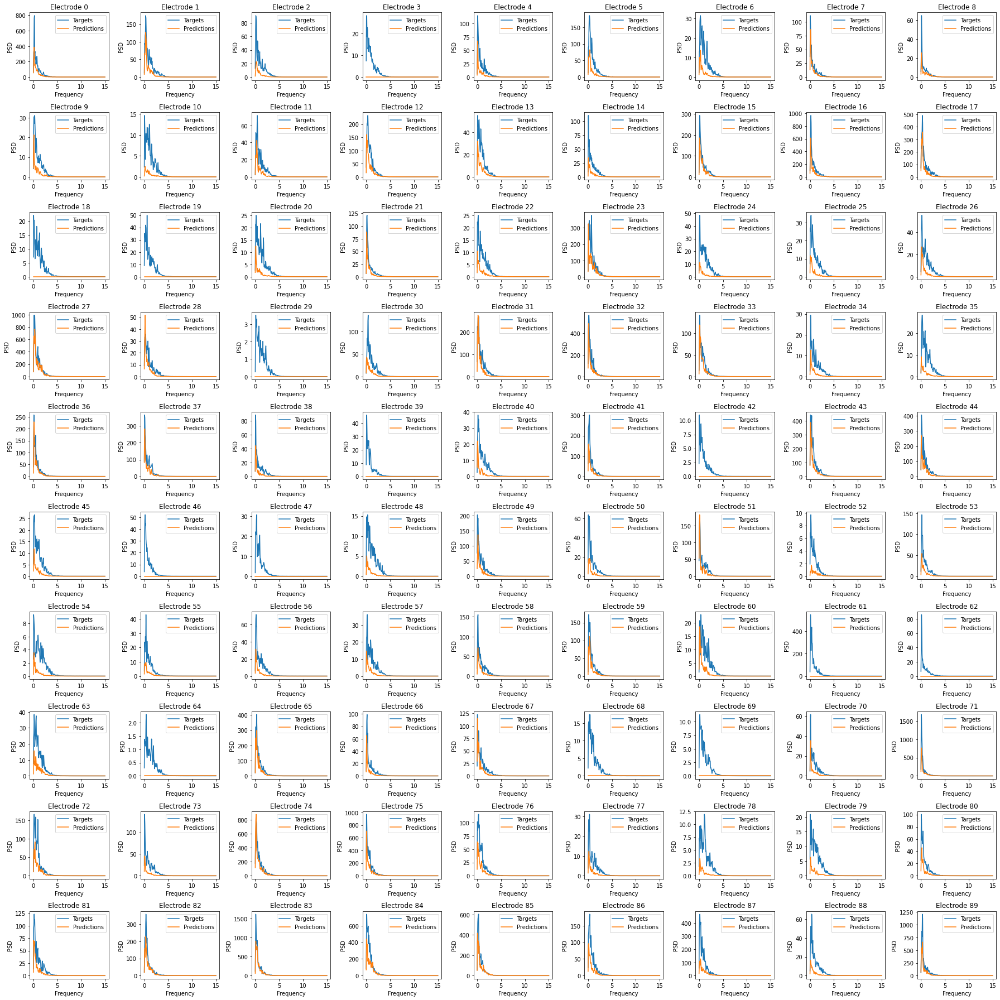

In [ ]:
get_psd(cnn_4convlayers_add_relu_1108, tcnn_dataset_dict['20211108']['Joint Angles']['Full'],tcnn_loader_dict['20211108']['Joint Angles']['Test'], 512, nrows = 10, ncols = 9)

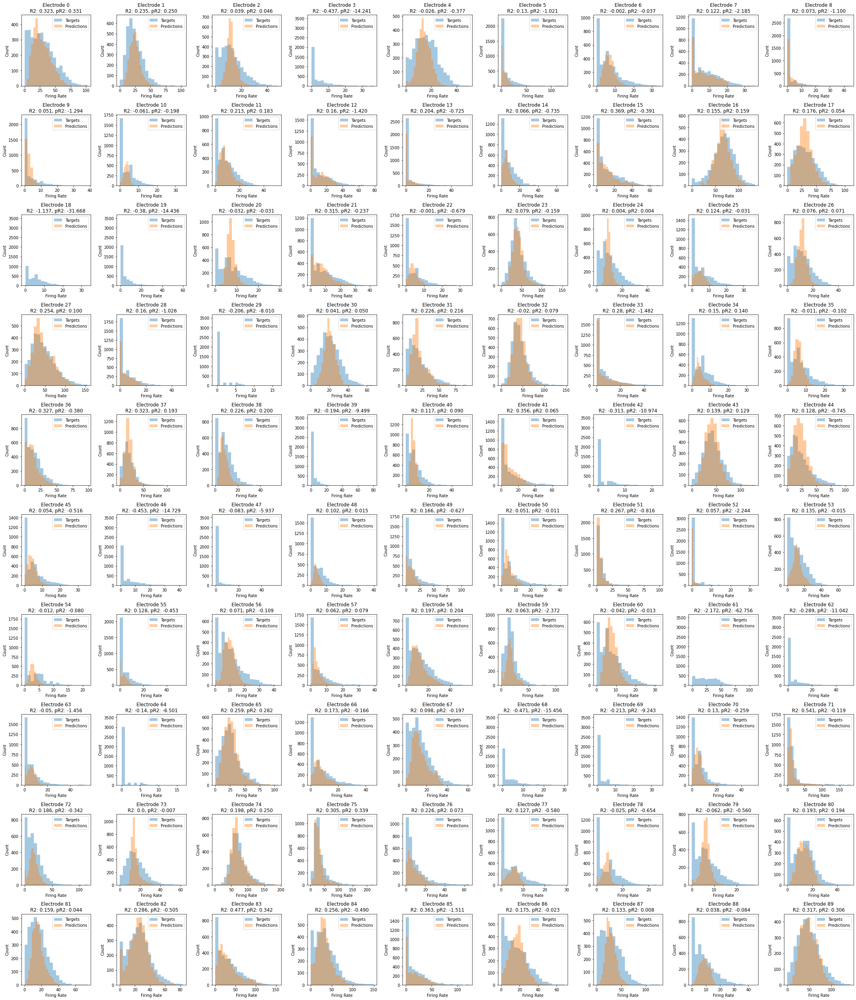

In [ ]:
test_target_dist, test_pred_dist = plot_distributions_tcnn(cnn_4convlayers_add_relu_1108, tcnn_dataset_dict['20211108']['Joint Angles']['Full'], tcnn_loader_dict['20211108']['Joint Angles']['Test'], nrows = 10, ncols = 9)

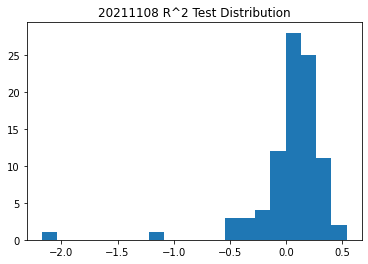

In [ ]:
plot_r2_tcnn(cnn_4convlayers_add_relu_1108, tcnn_dataset_dict['20211108']['Joint Angles']['Full'], tcnn_loader_dict['20211108']['Joint Angles']['Test'])

In [ ]:
def plot_corrmatx_pairwisecorr(model, dataset, test_loader):
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    test_loss, test_R2, test_pr2, test_preds, test_targets = test(test_loader, model, optimizer, criterion, dataset.num_neural_units, conv = True)
    for i in range(test_preds.shape[1]):
        if np.var(test_preds[:,i]) <= 1e-10:
            test_preds[-1,i] += 1e-6
    target_corrcoef = np.corrcoef(test_targets.T)
    pred_corrcoef = np.corrcoef(test_preds.T)

    sn.heatmap(target_corrcoef)
    plt.title('Target Correlation Matrix')
    plt.show()
    sn.heatmap(pred_corrcoef)
    plt.title('Prediction Correlation Matrix')
    plt.show()

    lower_tri_target = np.tril(target_corrcoef, -1).flatten()
    lower_tri_pred = np.tril(pred_corrcoef, -1).flatten()
    lower_tri_target = lower_tri_target[lower_tri_target!=0]
    lower_tri_pred = lower_tri_pred[lower_tri_pred!=0]

    plt.scatter(lower_tri_pred,lower_tri_target)
    lower_tri_corrcoef = round(np.corrcoef(lower_tri_target,lower_tri_pred)[0][1],3)
    plt.title('Pairwise Correlation, r = {}'.format(lower_tri_corrcoef))
    plt.show()

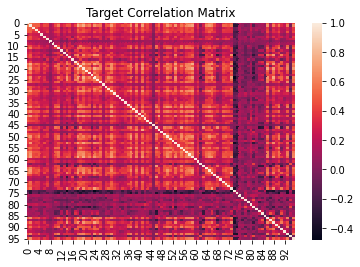

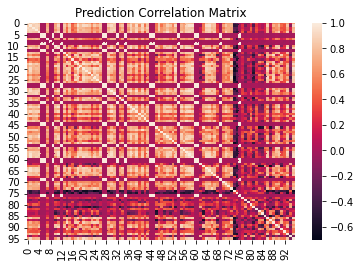

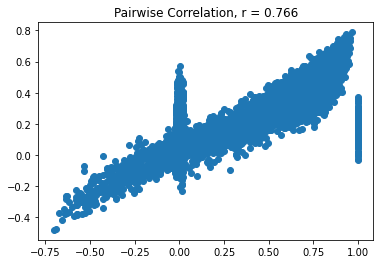

In [ ]:
plot_corrmatx_pairwisecorr(cnn_4convlayers_add_relu, tcnn_loader_dict['20220309']['Joint Angles']['Test'])

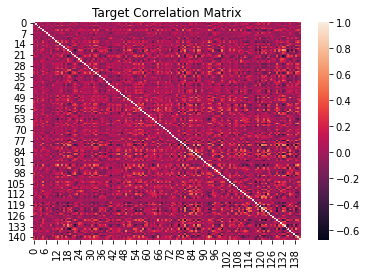

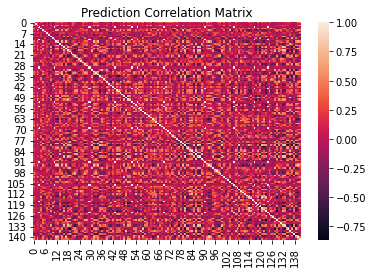

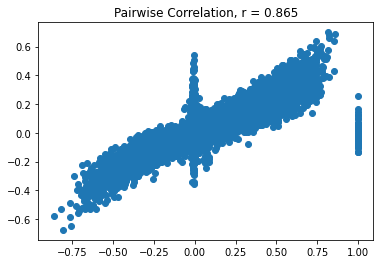

In [ ]:
plot_corrmatx_pairwisecorr(cnn_4convlayers_add_relu_0712, tcnn_dataset_dict['20210712']['Joint Angles']['Full'], tcnn_loader_dict['20210712']['Joint Angles']['Test'])

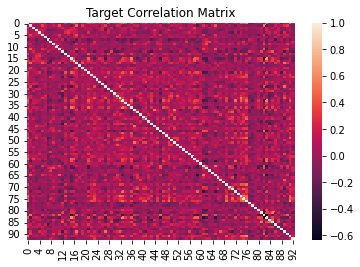

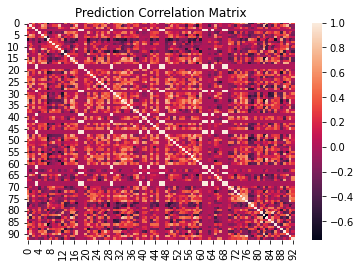

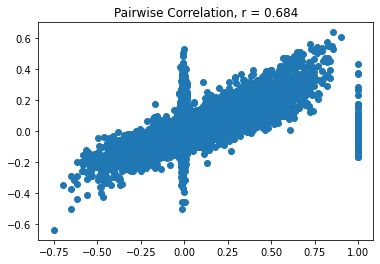

In [ ]:
plot_corrmatx_pairwisecorr(cnn_4convlayers_add_relu_1108, tcnn_dataset_dict['20211108']['Joint Angles']['Full'], tcnn_loader_dict['20211108']['Joint Angles']['Test'])